<a href="https://colab.research.google.com/github/abkimc/CV-course-test-prepration/blob/main/working_version.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# connect to my drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# print the names of all  files and folders in the pat folder

import os

# Replace 'path/to/your/folder' with the actual path to your folder
folder_path = '/content/drive/My Drive/PD_pat/pat'

if os.path.exists(folder_path):
  for item in os.listdir(folder_path):
    item_path = os.path.join(folder_path, item)
    print(item)
else:
  print(f"The folder '{folder_path}' does not exist.")

pat.7z
Database.xlsx
20181205_Database.xlsx
P002
P001
P005
P010
P003
P006
P007
P004
P009
P008
P019
P020
P017
P015
P011
P013
P018
P012
P014
P016
P027
P024
P022
P028
P021
P023
P026
P029
P025


In [ ]:
# read in the Database and 20181205_Database xlsx files into a df

import pandas as pd
from google.colab import drive
import os
if os.path.exists(folder_path):
  file1 = None
  file2 = None
  for item in os.listdir(folder_path):
    item_path = os.path.join(folder_path, item)
    if item == 'Database.xlsx':
        file1 = item_path
    elif item == '20181205_Database.xlsx':
        file2 = item_path

  if file1 and file2:
    try:
        df1 = pd.read_excel(file1)
        df2 = pd.read_excel(file2)
        print("Successfully read both Excel files into dataframes.")
    except Exception as e:
        print(f"An error occurred while reading the Excel files: {e}")
  else:
      print("One or both of the required Excel files were not found in the specified directory.")
else:
  print(f"The folder '{folder_path}' does not exist.")

Successfully read both Excel files into dataframes.


In [ ]:
df1


,ID,Birth,Age,Gender,UPDRS,Mini-Mental,PD Duration (y),DBS,Sight Disorder,Orthopedic/Rheumatic,Sleep Disorder,Sleep Duration,PD Effected side,Dominant Hand,Medications,FOG,Comments,Feedback
0,P001,1939,79,M,13,29,1,no,corrected,no,No,8,LT,RT,NaN,no,NaN,Felt that he was sitting uncomfortably
1,P002,1946,72,M,15,27,4,no,corrected,no,No,9,none,RT,NaN,no,NaN,Trial goals were not clear
2,P003,1950,68,M,12,28,1.5,no,corrected,Shoulder Pain,No,5 to 6,RT,RT,NaN,no,NaN,Fatigue
3,P004,1959,59,F,24,30,4,no,corrected,Osteoporosis,Yes,2,LT,RT,NaN,Possibly,NaN,NaN
4,P005,1942,76,M,12,30,2,no,corrected,Spinal disc herniation,No,6 to 7,LT,RT,NaN,no,NaN,NaN
5,P006,1940,78,M,11,27,5,no,corrected,Knee Pain,Yes,4.5,RT,LT,NaN,no,NaN,NaN
6,P007,1947,71,F,16,30,8,no,corrected,Knee Injury,Yes,5,LT,RT,NaN,no,NaN,Trial duration was too long
7,P008,1948,70,F,11,29,1,no,corrected,Lt shoulder injury,Yes,5,LT,RT,NaN,no,NaN,"Felt uncomfortable because her hand was ""free..."
8,P009,1964,54,M,9,28,2,no,corrected,Pelvis pain,No,7,LT,RT,NaN,no,NaN,NaN
9,P010,1953,65,M,16,28,5,no,corrected,no,No,6,RT,RT,NaN,no,NaN,NaN


In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 30.6 MB/s eta 0:00:00


In [149]:
def isolate_wavelet_components(signal, wavelet='db4', max_level=None):
    """
    Decompose signal into individual wavelet components and reconstruct each separately.

    Parameters:
    signal : array-like
        Input signal to analyze
    wavelet : str
        Wavelet to use for decomposition
    max_level : int or None
        Maximum decomposition level

    Returns:
    dict containing:
        components: list of isolated components
        levels: corresponding level labels
        pseudo_freqs: pseudo-frequencies for each level
        energy: energy distribution across levels
        coeffs: raw wavelet coefficients
    """
    print("max_level: ",max_level)
    # Input validation
    if not isinstance(signal, np.ndarray):
        signal = np.array(signal)

    if signal.size == 0:
        raise ValueError("Input signal is empty")

    # Calculate maximum decomposition level if not specified
    wavelet_obj = pywt.Wavelet(wavelet)
    if max_level is None:
        max_level = min(
            pywt.dwt_max_level(len(signal), wavelet_obj.dec_len),
            int(np.log2(len(signal)))
        )

    # Perform wavelet decomposition with error handling
    try:
        coeffs = pywt.wavedec(signal, wavelet, level=max_level, mode='symmetric')
    except Exception as e:
        raise ValueError(f"Wavelet decomposition failed: {str(e)}")

    # Initialize storage
    components = []
    levels = []
    energy = []

    # Calculate pseudo-frequencies for each level
    scales = [2**i for i in range(max_level + 1)]
    pseudo_freqs = pywt.scale2frequency(wavelet_obj, scales) * len(signal)

    # Reconstruct approximation component
    zero_coeffs = [np.zeros_like(c) for c in coeffs[1:]]
    try:
        approx_component = pywt.waverec([coeffs[0]] + zero_coeffs, wavelet, mode='symmetric')
        # Ensure length matches and handle edge effects
        if len(approx_component) > len(signal):
            start_idx = (len(approx_component) - len(signal)) // 2
            approx_component = approx_component[start_idx:start_idx + len(signal)]
        elif len(approx_component) < len(signal):
            approx_component = np.pad(
                approx_component,
                (0, len(signal) - len(approx_component)),
                mode='edge'
            )

        components.append(approx_component)
        levels.append(f'A{max_level}')
        energy.append(np.sum(approx_component**2))
    except Exception as e:
        raise ValueError(f"Failed to reconstruct approximation component: {str(e)}")

    # Reconstruct detail components
    for level in range(max_level):
        detail_coeffs = [np.zeros_like(c) for c in coeffs]
        detail_coeffs[level + 1] = coeffs[level + 1]

        try:
            detail_component = pywt.waverec(detail_coeffs, wavelet, mode='symmetric')

            # Handle length matching and edge effects
            if len(detail_component) > len(signal):
                start_idx = (len(detail_component) - len(signal)) // 2
                detail_component = detail_component[start_idx:start_idx + len(signal)]
            elif len(detail_component) < len(signal):
                detail_component = np.pad(
                    detail_component,
                    (0, len(signal) - len(detail_component)),
                    mode='edge'
                )

            components.append(detail_component)
            levels.append(f'D{max_level - level}')
            energy.append(np.sum(detail_component**2))
        except Exception as e:
            raise ValueError(f"Failed to reconstruct detail component at level {level}: {str(e)}")

    # Normalize energy values
    total_energy = sum(energy)
    energy = [e/total_energy for e in energy] if total_energy > 0 else energy

    return {
        'components': components,
        'levels': levels,
        'pseudo_freqs': pseudo_freqs,
        'energy': energy,
        'coeffs': coeffs
    }

In [150]:
def isolate_and_plot_frequencies(signal, sampling_rate, num_frequencies=10, min_magnitude_threshold=0.1, plot=False):
    """
    Isolates frequencies and progressively reconstructs the signal, showing the process at each step.

    Parameters:
    -----------
    signal : array-like
        Input signal to analyze
    sampling_rate : float
        Sampling rate of the signal in Hz
    num_frequencies : int, optional
        Number of top frequencies to analyze (default: 10)
    min_magnitude_threshold : float, optional
        Minimum relative magnitude threshold for frequency selection (default: 0.1)
    plot : bool, optional
        Whether to plot the analysis results (default: False)

    Returns:
    --------
    list
        List of isolated frequency components
    """
    # Input validation
    if signal is None or len(signal) == 0:
        raise ValueError("No valid signal data provided")

    if not isinstance(signal, np.ndarray):
        signal = np.array(signal)

    if sampling_rate <= 0:
        raise ValueError("Sampling rate must be positive")

    # Store original signal and remove DC component
    # original_signal = signal.copy()
    # signal_mean = np.mean(signal)
    # signal = signal - signal_mean

    # Perform FFT
    fft_vals = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(signal), d=1/sampling_rate)

    # Get positive frequencies
    positive_mask = freqs > 0
    positive_freqs = freqs[positive_mask]
    positive_fft_vals = fft_vals[positive_mask]

    # Calculate magnitudes and normalize
    magnitudes = np.abs(positive_fft_vals)
    max_magnitude = np.max(magnitudes)
    normalized_magnitudes = magnitudes / max_magnitude

    # Filter frequencies based on magnitude threshold
    significant_mask = normalized_magnitudes > min_magnitude_threshold
    significant_freqs = positive_freqs[significant_mask]
    significant_fft_vals = positive_fft_vals[significant_mask]
    significant_magnitudes = magnitudes[significant_mask]

    # Handle case when no significant frequencies are found
    if len(significant_freqs) == 0:
        print("No significant frequencies found above threshold")
        return []

    # Sort by magnitude
    sorted_indices = np.argsort(significant_magnitudes)[::-1]
    sorted_freqs = significant_freqs[sorted_indices]
    sorted_fft_vals = significant_fft_vals[sorted_indices]

    # Limit to specified number of frequencies
    num_freqs_to_analyze = min(num_frequencies, len(sorted_freqs))

    print(f"\nAnalyzing top {num_freqs_to_analyze} frequencies above {min_magnitude_threshold*100}% relative magnitude:")

    # Initialize storage for components
    components = []
    reconstructed_signal = np.zeros_like(signal, dtype=complex)

    # Add DC component
    dc_idx = np.where(freqs == 0)[0][0]
    reconstructed_signal[dc_idx] = fft_vals[dc_idx]

    # Iterate over frequencies
    for i in range(num_freqs_to_analyze):
        try:
            # Find current frequency index in original FFT array
            current_freq_idx = np.where(freqs == sorted_freqs[i])[0][0]

            # Add positive frequency component
            reconstructed_signal[current_freq_idx] = fft_vals[current_freq_idx]

            # Add negative frequency component (conjugate)
            reconstructed_signal[-current_freq_idx] = np.conj(fft_vals[current_freq_idx])

            # Extract current frequency component
            temp_fft = np.zeros_like(fft_vals, dtype=complex)
            temp_fft[current_freq_idx] = fft_vals[current_freq_idx]
            temp_fft[-current_freq_idx] = np.conj(fft_vals[current_freq_idx])
            current_component = np.fft.ifft(temp_fft).real

            # Distribute the DC offset across all components
            #dc_contribution_per_component = signal_mean / num_freqs_to_analyze
           # current_component += dc_contribution_per_component  # Add DC bias to this component
            # Store component
            components.append(current_component)

            if plot:
                # Current reconstruction
                current_reconstruction = np.fft.ifft(reconstructed_signal).real + signal_mean

                # Create visualization
                fig, axs = plt.subplots(3, 1, figsize=(15, 12))

                # Original signal
                axs[0].plot(original_signal)
                axs[0].set_title("Original Signal")
                axs[0].set_xlabel("Time (samples)")
                axs[0].set_ylabel("Amplitude")
                axs[0].grid(True)

                # Current component
                axs[1].plot(current_component)
                axs[1].set_title(f"Frequency Component: {sorted_freqs[i]:.2f} Hz")
                axs[1].set_xlabel("Time (samples)")
                axs[1].set_ylabel("Amplitude")
                axs[1].grid(True)

                # Progressive reconstruction
                axs[2].plot(current_reconstruction)
                axs[2].set_title(f"Reconstructed Signal (Components 1-{i+1})")
                axs[2].set_xlabel("Time (samples)")
                axs[2].set_ylabel("Amplitude")
                axs[2].grid(True)

                plt.tight_layout()
                plt.show()

                # Print analysis information
                error = np.mean(np.abs(original_signal - current_reconstruction))
                print(f"Added frequency {i+1}: {sorted_freqs[i]:.2f} Hz")
                print(f"Magnitude: {significant_magnitudes[sorted_indices][i]:.4f}")
                print(f"Reconstruction error: {error:.4f}")
                print("-" * 50)

        except Exception as e:
            print(f"Error processing frequency {i+1}: {str(e)}")
            continue

    return components

In [152]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.fft import fft, ifft
from sklearn.linear_model import OrthogonalMatchingPursuit
from scipy.fftpack import dct

def load_signal_data(file_path):
    """Load signal data from file."""
    try:
        df = pd.read_csv(file_path, header=None, delimiter=' ')
        df.reset_index(drop=True, inplace=True)
        df.columns = [f"Col_{i+1}" for i in range(df.shape[1])]
        return df['Col_1'].values
    except Exception as e:
        print(f"Error loading data: {str(e)}")
        return None

def create_hybrid_dictionary(signal,n_components , wavelet='db4', max_level=None, dict_mode = "all"):
    """Create dictionary combining Fourier and wavelet atoms."""
    if signal is None:
        raise ValueError("No valid signal provided")

    n_samples = len(signal)
    sampling_rate = 120  # Hz
    print("then numeber of com " ,n_components)
    # Get Fourier components
    fourier_components = isolate_and_plot_frequencies(
        signal,
        sampling_rate,
        num_frequencies=n_components,
        min_magnitude_threshold=0.0,
        plot=False  # Disable plotting during dictionary creation
    )

    # Handle empty components list
    if not fourier_components:
        raise ValueError("No Fourier components extracted")

    # Create Fourier dictionary
    fourier_dict = np.array(fourier_components).T

    # Get wavelet components
    components_dict = isolate_wavelet_components(
        signal,
        wavelet=wavelet,
        max_level=max_level ,#or pywt.dwt_max_level(len(signal), pywt.Wavelet(wavelet).dec_len)
    )
    wavelet_dict = np.array(components_dict['components']).T

    # Print dictionary information
    print(f"Fourier dictionary shape: {fourier_dict.shape}")
    print(f"Wavelet dictionary shape: {wavelet_dict.shape}")
    # original
    if dict_mode == "all":
      D = np.column_stack([fourier_dict, wavelet_dict])
    if dict_mode == "fourier":
      D = np.column_stack([fourier_dict])
    if dict_mode == "wavelet":
      D = np.column_stack([wavelet_dict])

    if dict_mode == "all":
        n_fourier_actual = fourier_dict.shape[1]
        n_wavelet_actual = wavelet_dict.shape[1]
    elif dict_mode == "fourier":
        n_fourier_actual = fourier_dict.shape[1]
        n_wavelet_actual = 0  # Wavelet components excluded
    elif dict_mode == "wavelet":
        n_fourier_actual = 0  # Fourier components excluded
        n_wavelet_actual = wavelet_dict.shape[1]
    else:
        raise ValueError("Invalid dict_mode")



    norms = np.linalg.norm(D, axis=0, keepdims=True)
    norms[norms == 0] = 1  # Avoid division by zero
    D = D / norms

    return D, n_fourier_actual, n_wavelet_actual,fourier_dict, wavelet_dict

   # return D, fourier_dict.shape[1], wavelet_dict.shape[1]

def calculate_bic(signal, reconstructed, n_components):
    """Calculate Bayesian Information Criterion."""
    n = len(signal)
    residual = signal - reconstructed
    variance = np.var(residual)
    if variance == 0:
        return np.inf
    log_likelihood = -0.5 * n * np.log(2 * np.pi * variance) - \
                    0.5 * np.sum(residual ** 2) / variance
    bic = -2 * log_likelihood + n_components * np.log(n)
    print(f"BIC: {bic}")
    print(f"log_likelihood: {log_likelihood}")
    print(f"variance: {variance}")
    print(f"log_likelihood upper part:{-0.5 * n * np.log(2 * np.pi * variance)}")
    print(f"log_likelihood lower part:{-0.5 * np.sum(residual ** 2) / variance}")
    print(f"n: {n}")
    print(f"n_components: {n_components}")
    print(f"np.log(n): {np.log(n)}")
    print(f"np.log(2 * np.pi * variance): {np.log(2 * np.pi * variance)}")

    return bic
def calculate_bic(signal, reconstructed, n_components):
    """
    Calculate BIC using residual sum of squares.

    Parameters:
    signal : np.array
        Original signal data.
    reconstructed : np.array
        Reconstructed signal data.
    n_components : int
        Number of model parameters/components.

    Returns:
    float
        Bayesian Information Criterion (BIC).
    """
    n = len(signal)
    residual = signal - reconstructed
    rss = np.sum(residual ** 2)  # Residual sum of squares
    bic = n * np.log(rss / n) + n_components * np.log(n)

    print(f"BIC: {bic}")
    print(f"RSS: {rss}")
    print(f"n: {n}")
    print(f"n_components: {n_components}")
    print(f"log(n): {np.log(n)}")

    return bic

def analyze_signal_with_omp(signal, n_components, wavelet='db4', plot  = False,dict_mode = "all"):
    """Analyze signal using OMP with hybrid dictionary."""
    # fixing the DC removal
    if signal is None:
        raise ValueError("No valid signal provided")
    signal_mean = np.mean(signal)
    if dict_mode == "wavelet":
        signal_mean = 0



    try:
        # Create hybrid dictionary
        print("the number of som", n_components)
        #D, n_fourier, n_wavelet = create_hybrid_dictionary(signal, n_components, wavelet, n_components,dict_mode)
        D, n_fourier, n_wavelet ,fourier_dict, wavelet_dict= create_hybrid_dictionary(
            signal,
            n_components,
            wavelet,
            max_level=n_components,  # Let wavelet determine its max decomposition level
            dict_mode=dict_mode
        )
        print(len(D))
    except Exception as e:
        print(f"Error creating dictionary: {str(e)}")
        return None, 0, 0, []

    # Store original dictionary for reconstructions
    D_original = D.copy()

    # Initialize tracking variables
    bics = []
    best_bic = np.inf
    best_n_components = 0
    reconstructions = []

    # Original indices tracking
    original_indices = np.arange(D.shape[1])

    # Lists to track the selected Fourier and Wavelet atoms
    used_fourier_atoms = set()
    used_wavelet_atoms = set()
    best_bic_fourier , best_bic_wavelet = 0,0

    for i in range(n_components):
        try:
            # Run OMP with i+1 non-zero coefficients
            omp = OrthogonalMatchingPursuit(n_nonzero_coefs=i + 1)
            omp.fit(D_original, signal)
            coef = omp.coef_

            # Get reconstruction
            reconstructed = np.dot(D_original, coef)
            # fixing DC remove
            reconstructed = np.dot(D_original, coef)# + signal_mean
            reconstructions.append(reconstructed)

            # Track selected atoms
            selected_atoms = np.nonzero(coef)[0]

            # # Update component sets
            # for atom_idx in selected_atoms:
            #     if atom_idx < n_fourier:
            #         used_fourier_atoms.add(atom_idx)
            #     else:
            #         used_wavelet_atoms.add(atom_idx)


            # Calculate BIC
            current_bic = calculate_bic(signal, reconstructed, i + 1)
            bics.append(current_bic)

            current_atom_idx = selected_atoms[-1]  # Get the last selected atom
            current_atom = D_original[:, current_atom_idx] * coef[current_atom_idx]

            current_atom_idx = selected_atoms[-1]  # Get the last selected atom

            # Determine atom type based on index
            if current_atom_idx < n_fourier:
                atom_type = "Fourier"
                atom_color = "blue"
                used_fourier_atoms.add(current_atom_idx)  # Store index instead of atom
            else:
                atom_type = "Wavelet"
                atom_color = "red"
                used_wavelet_atoms.add(i)  # Adjust index for wavelet

            fourier_selected = len(used_fourier_atoms)
            wavelet_selected = len(used_wavelet_atoms)


            # Update best BIC
            if current_bic < best_bic:
                best_bic = current_bic
                best_n_components = i + 1
                best_bic_fourier = fourier_selected
                best_bic_wavelet = wavelet_selected
            # Optional ploting of the procces
            if plot:
              # Visualization
              fig, axs = plt.subplots(4, 1, figsize=(20, 20))  # Added one more subplot

              # Plot 1: Signal vs Reconstruction
              axs[0].plot(signal, label="Original", color="blue", alpha=0.7)
              axs[0].plot(reconstructed, label="Reconstructed", color="red",
                        linestyle="--", alpha=0.7)
              axs[0].set_title(f'Reconstruction (Components: {i+1}, BIC: {current_bic:.2f})')
              axs[0].legend()
              axs[0].grid(True)

              # Plot 2: BIC Evolution
              axs[1].plot(range(1, len(bics)+1), bics, 'o-', label='BIC Evolution')
              axs[1].axvline(best_n_components, color='r', linestyle='--',
                            label=f'Best: {best_n_components} components')
              axs[1].set_title('BIC Evolution')
              axs[1].set_xlabel('Number of Components')
              axs[1].legend()
              axs[1].grid(True)


              axs[3].plot(current_atom, label=f'Selected Atom (#{i+1}, {atom_type})', color=atom_color)
              axs[3].set_title(f'Current Atom Contribution (Type: {atom_type})')
              axs[3].legend()
              axs[3].grid(True)

                # if plot:
                #     axs[3].plot(current_atom, label=f'Selected Atom (#{i+1}, {atom_type})', color=atom_color)
                #     axs[3].set_title(f'Current Atom Contribution (Type: {atom_type})')
                #     axs[3].legend()
                #     axs[3].grid(True)

              # Plot 3: Atom Counts
              # Get current counts
              fourier_selected = len(used_fourier_atoms)
              wavelet_selected = len(used_wavelet_atoms)
              axs[2].bar(['Fourier', 'Wavelet'], [fourier_selected, wavelet_selected],
                        color=['blue', 'red'])
              axs[2].set_title(f'Atom Counts (F: {fourier_selected}, W: {wavelet_selected})')
              axs[2].grid(True)

              if plot:
                plt.tight_layout()
                plt.show()
        except Exception as e:
            print(f"Error in iteration {i}: {str(e)}")
            continue



    # Return the final counts of unique atoms used
    return bics, len(used_fourier_atoms), len(used_wavelet_atoms), reconstructions  ,best_bic_fourier , best_bic_wavelet


the number of som 35
then numeber of com  35

Analyzing top 35 frequencies above 0.0% relative magnitude:
max_level:  35
Fourier dictionary shape: (7594, 35)
Wavelet dictionary shape: (7594, 36)
7594
BIC: 36963.39510048394
RSS: 985973.2260454629
n: 7594
n_components: 1
log(n): 8.935113740791747


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 35 is too high: all coefficients will experience boundary effects.
  warnings.warn(


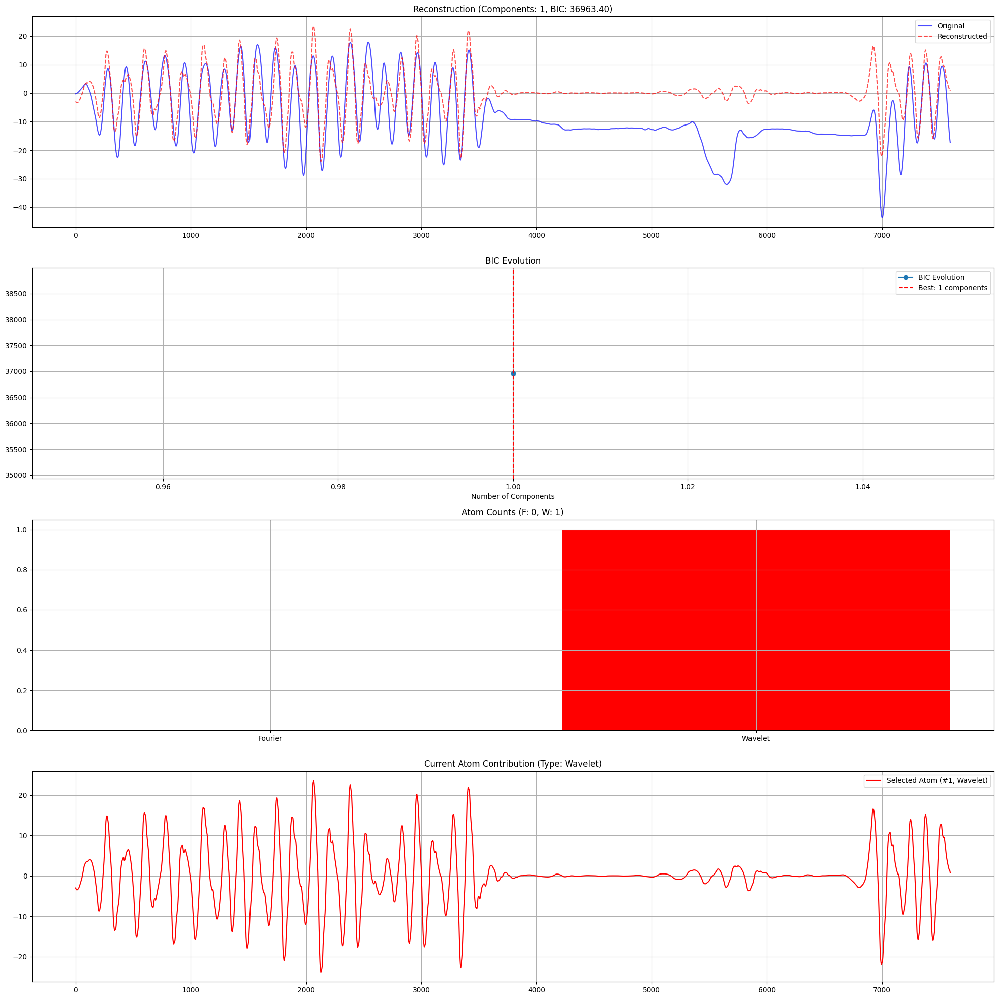

BIC: 34855.89550282768
RSS: 746153.1870295908
n: 7594
n_components: 2
log(n): 8.935113740791747


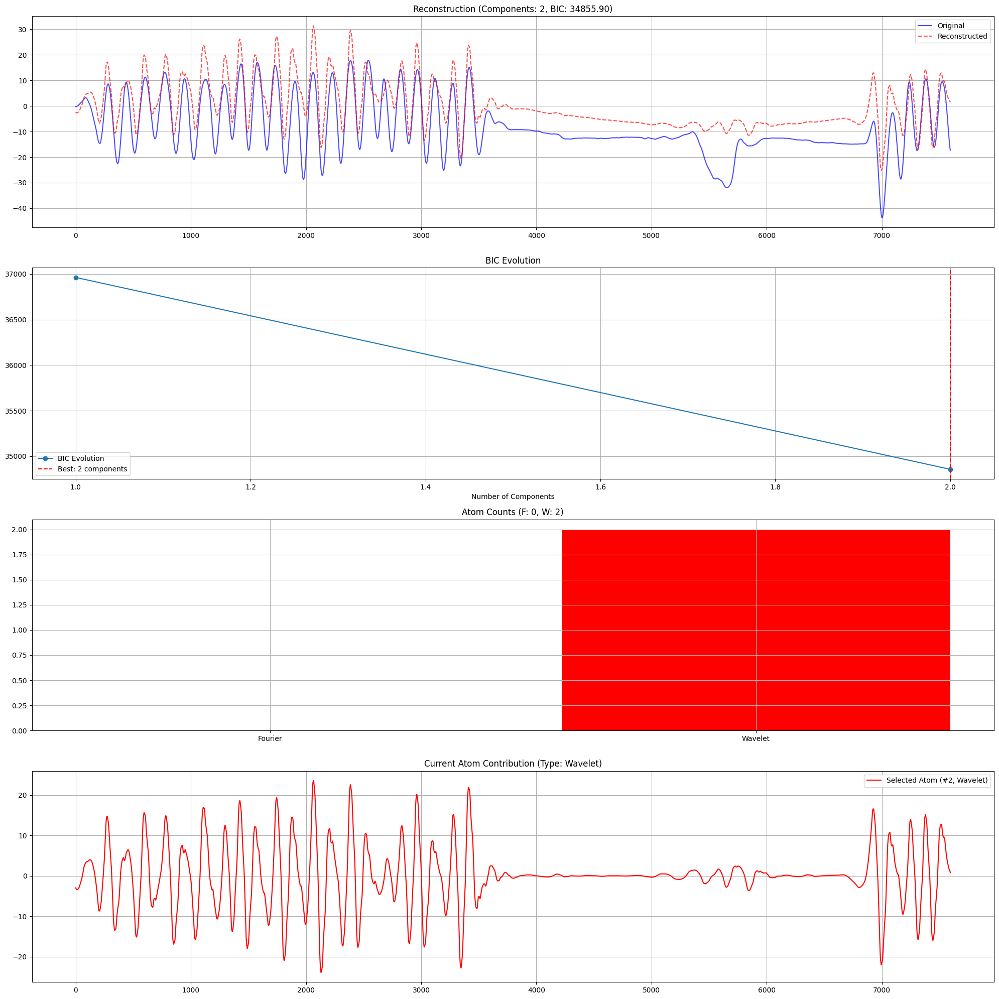

BIC: 33511.389311747786
RSS: 624346.7089832141
n: 7594
n_components: 3
log(n): 8.935113740791747


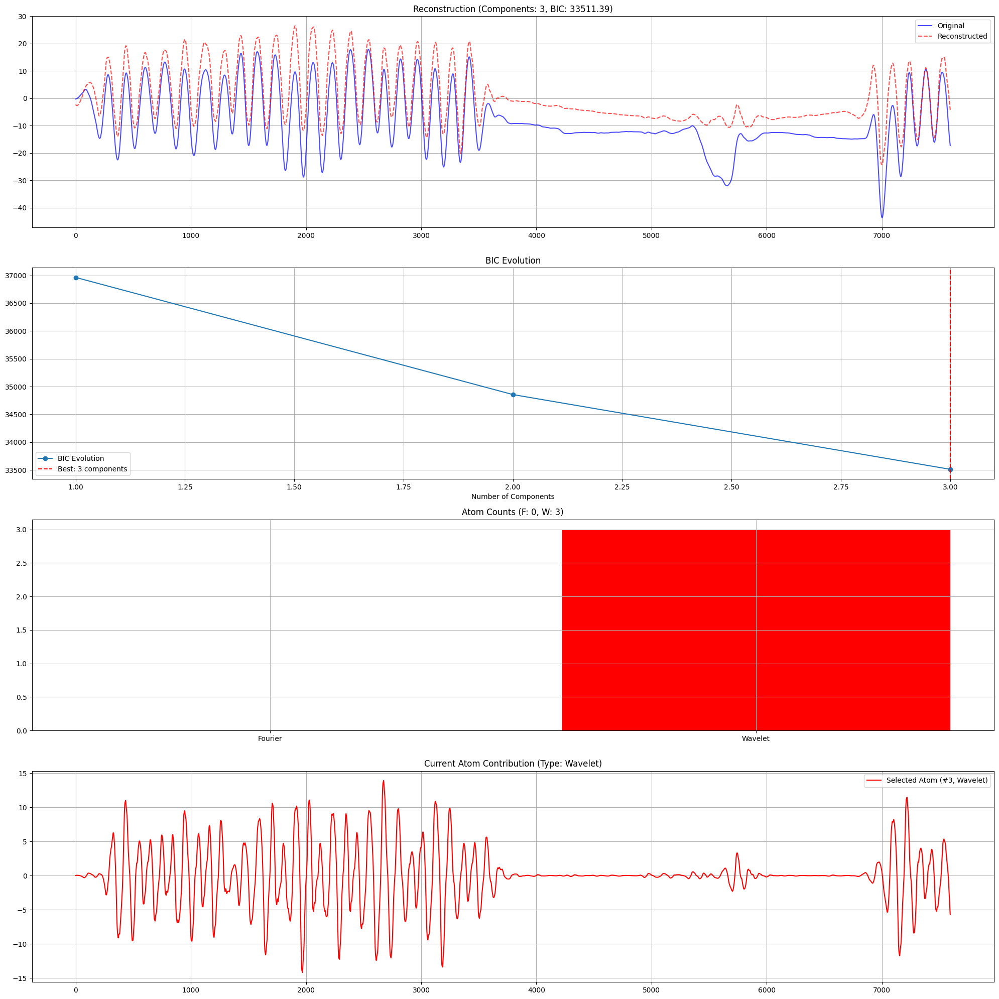

BIC: 32940.60586024554
RSS: 578458.5025409186
n: 7594
n_components: 4
log(n): 8.935113740791747


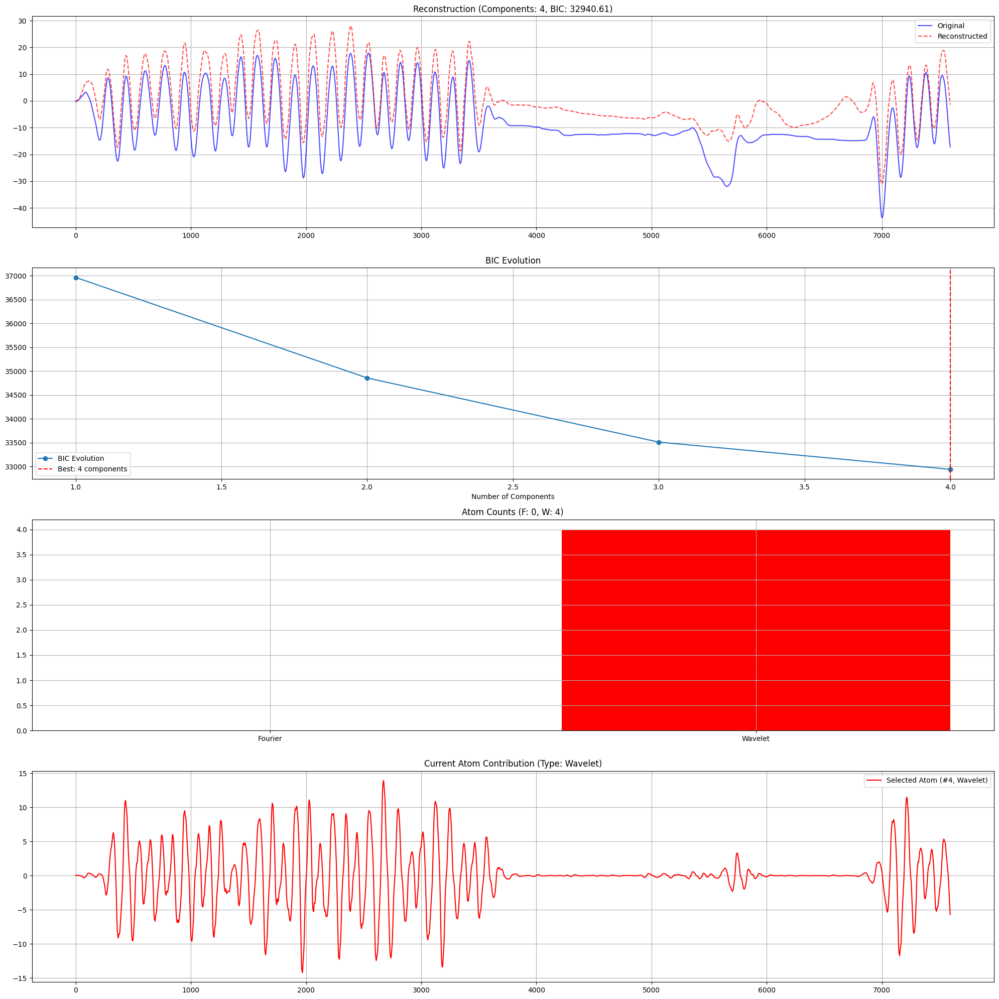

BIC: 32705.524195720274
RSS: 560166.4503579813
n: 7594
n_components: 5
log(n): 8.935113740791747


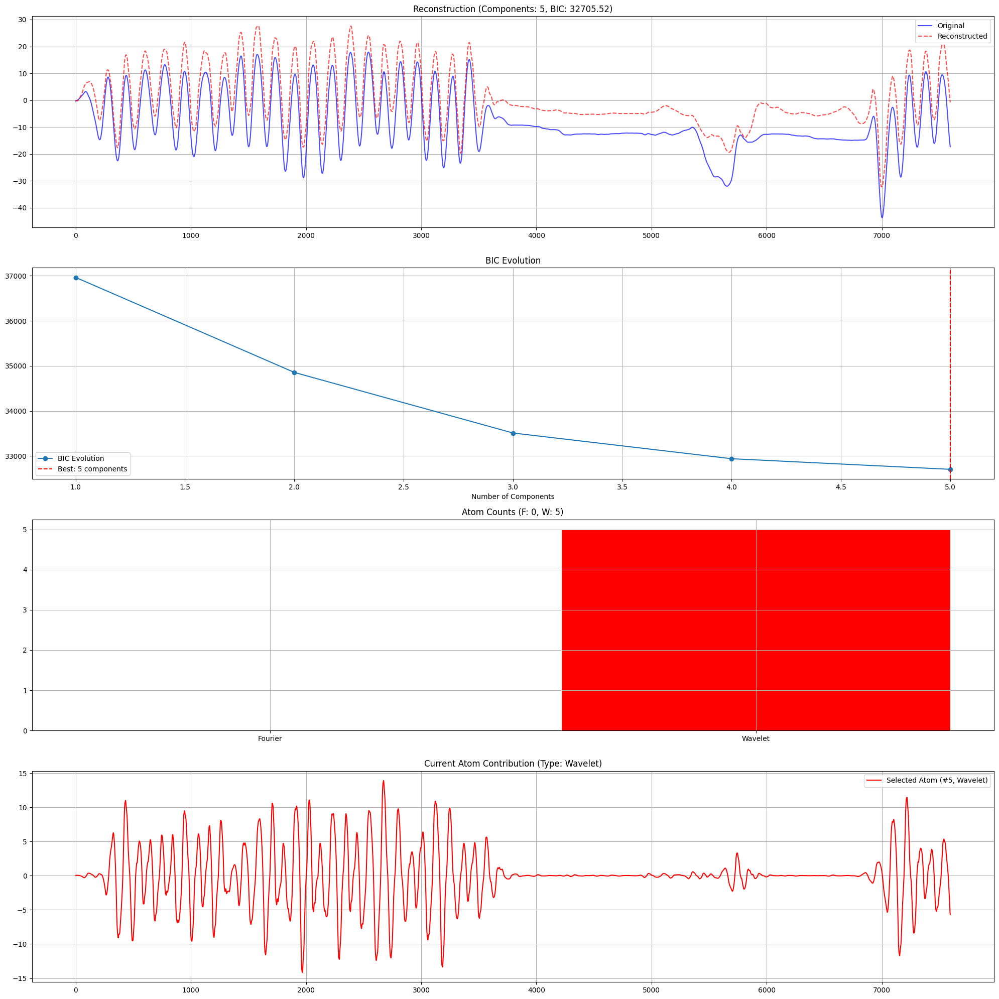

BIC: 32308.571206868946
RSS: 531012.4391454988
n: 7594
n_components: 6
log(n): 8.935113740791747


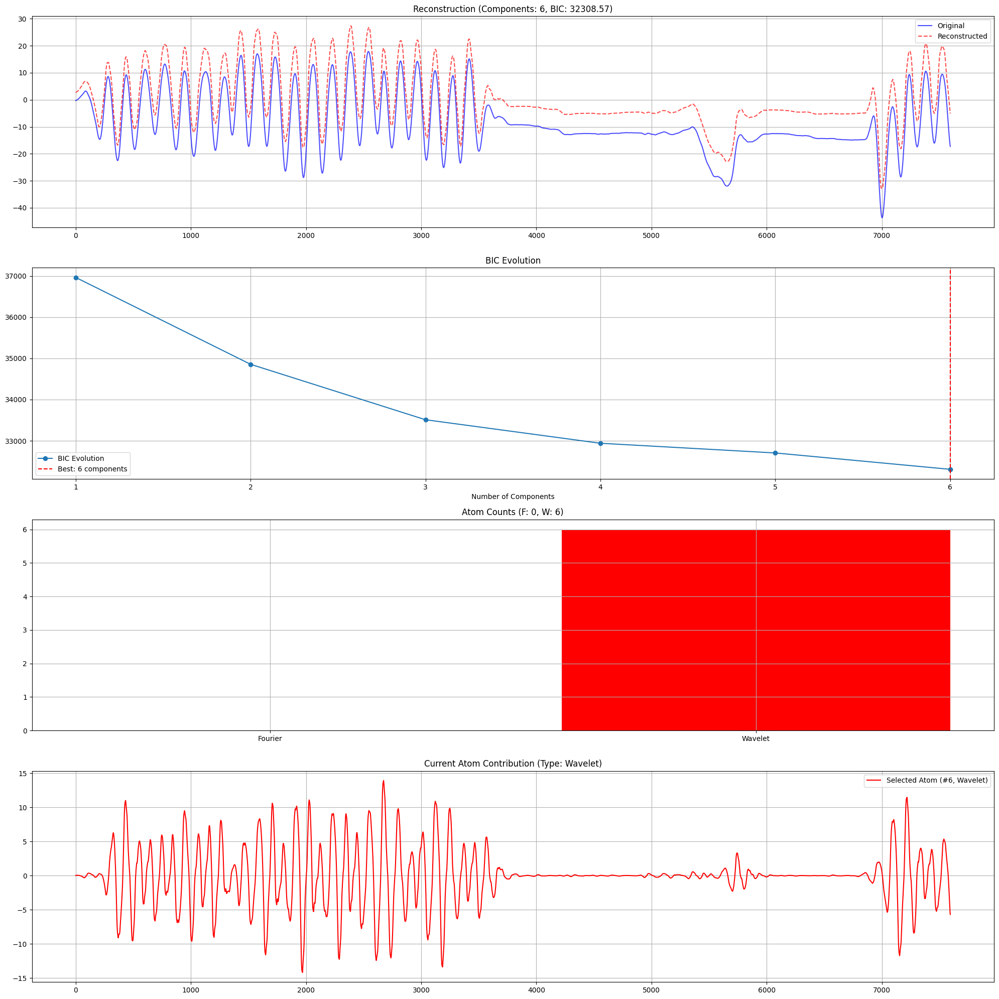

BIC: 32236.73085903945
RSS: 525394.127092297
n: 7594
n_components: 7
log(n): 8.935113740791747


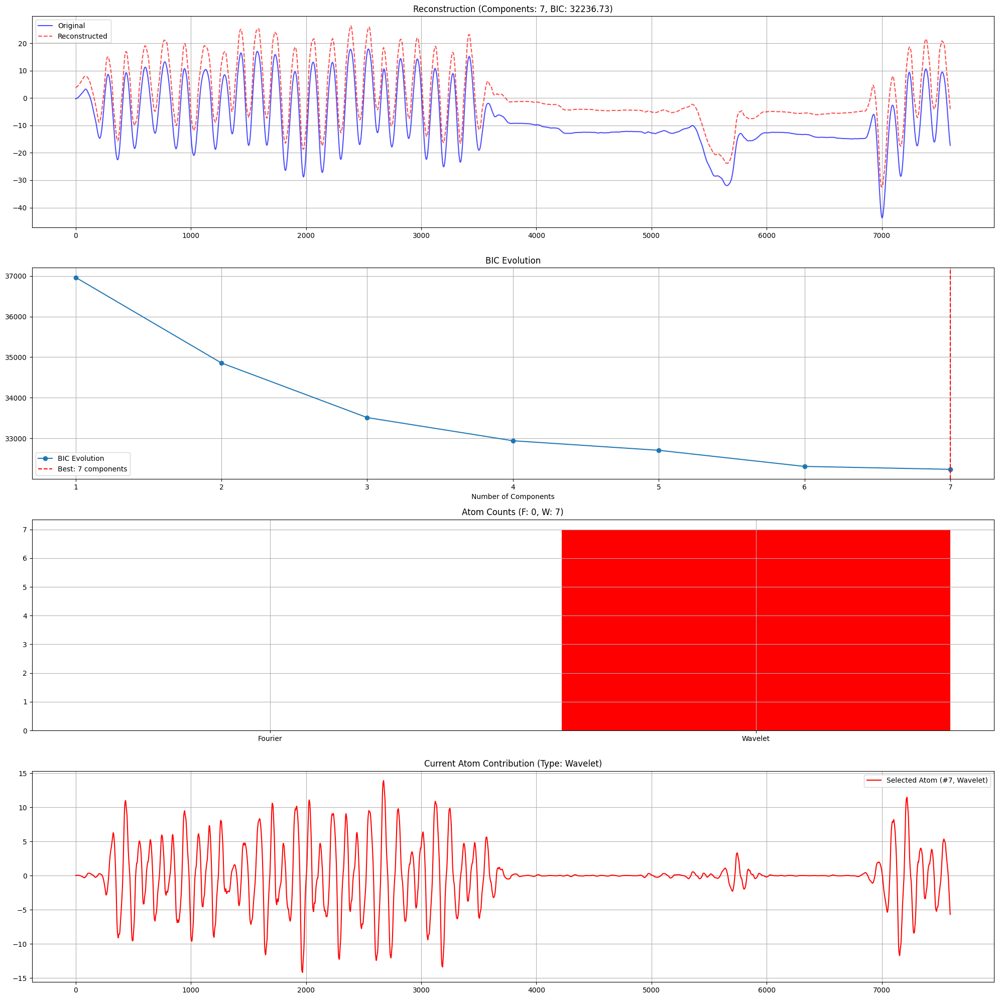

BIC: 32205.60934579877
RSS: 522630.0885265088
n: 7594
n_components: 8
log(n): 8.935113740791747


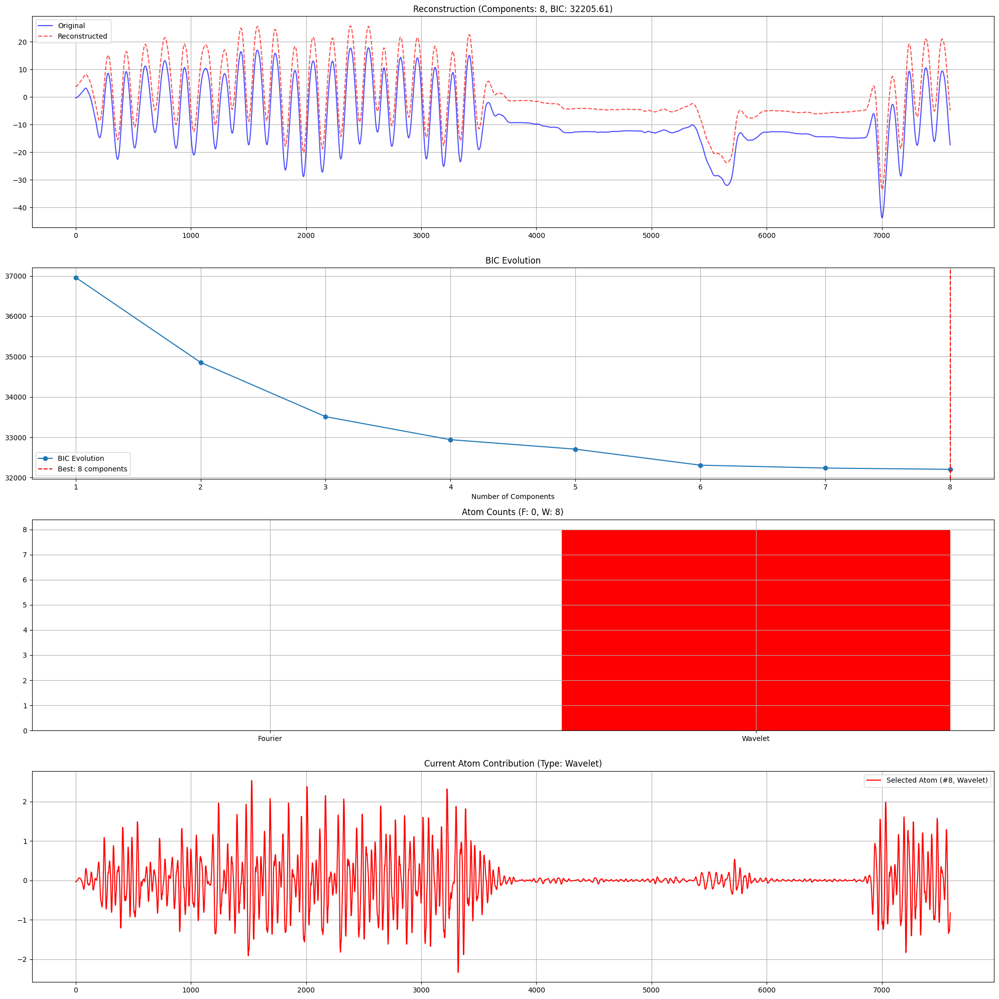

BIC: 32234.88995360399
RSS: 524032.17228191526
n: 7594
n_components: 9
log(n): 8.935113740791747


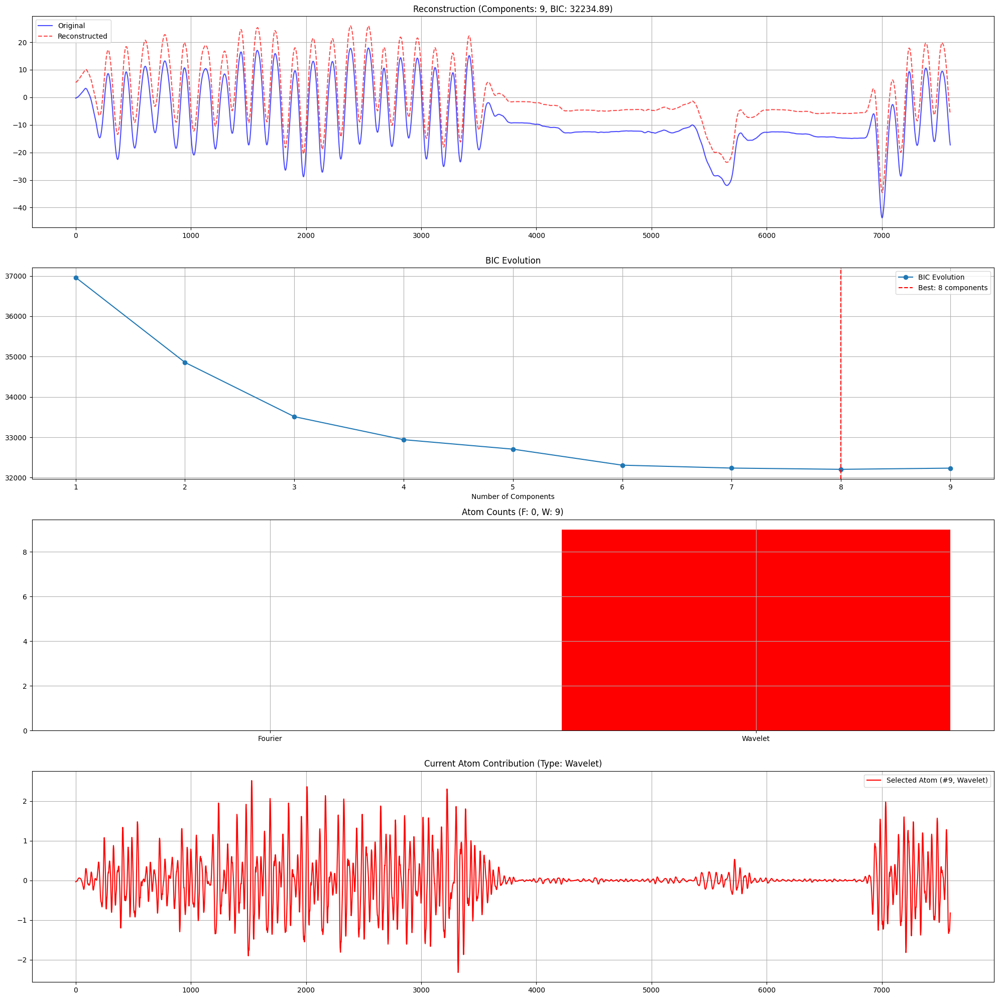

BIC: 32233.048052634444
RSS: 523289.0201879344
n: 7594
n_components: 10
log(n): 8.935113740791747


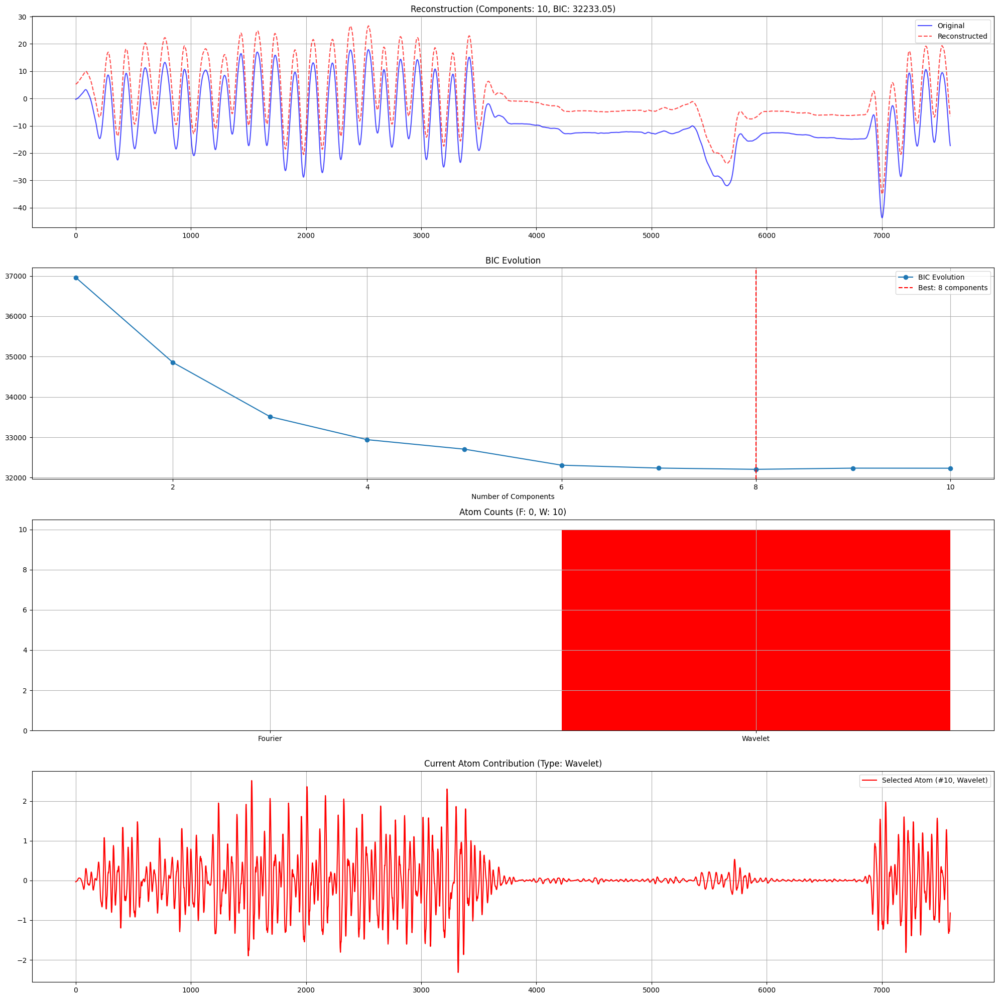

BIC: 32221.518709544605
RSS: 521880.74927116575
n: 7594
n_components: 11
log(n): 8.935113740791747


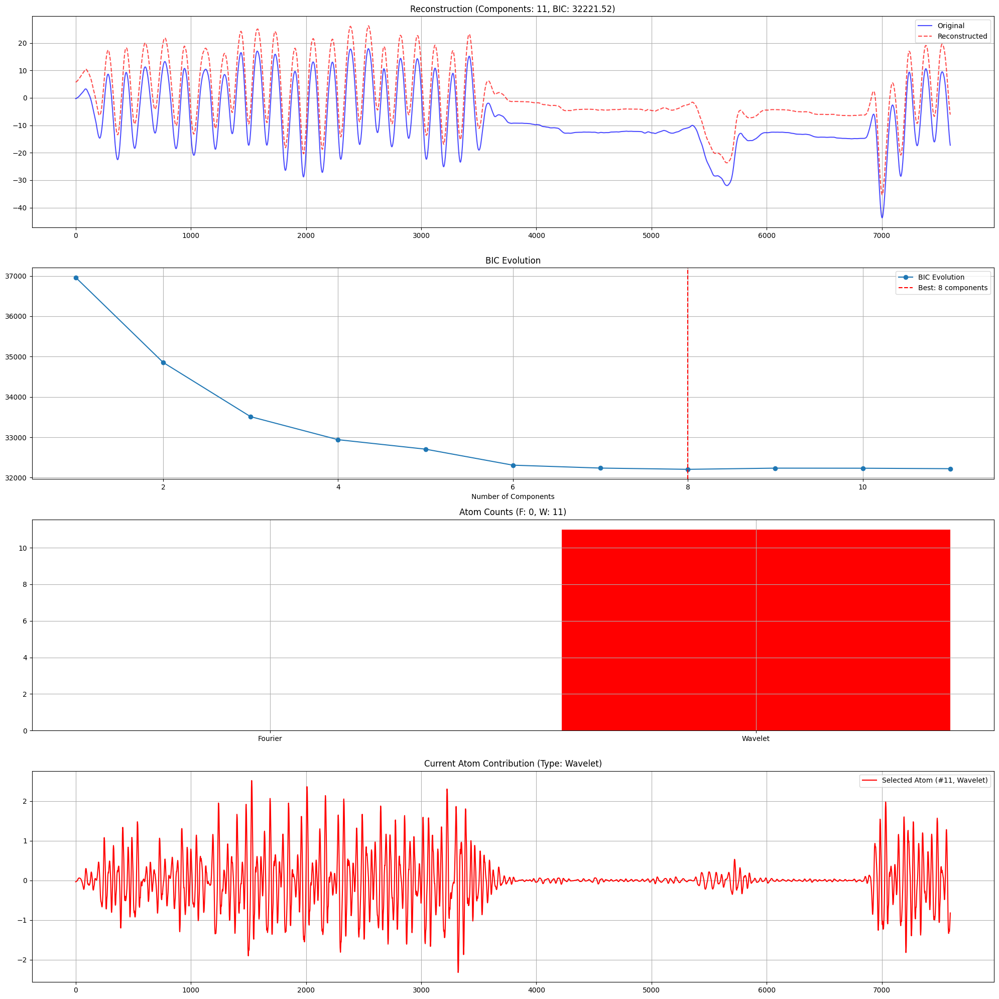

BIC: 32246.43141023777
RSS: 522979.9292939772
n: 7594
n_components: 12
log(n): 8.935113740791747


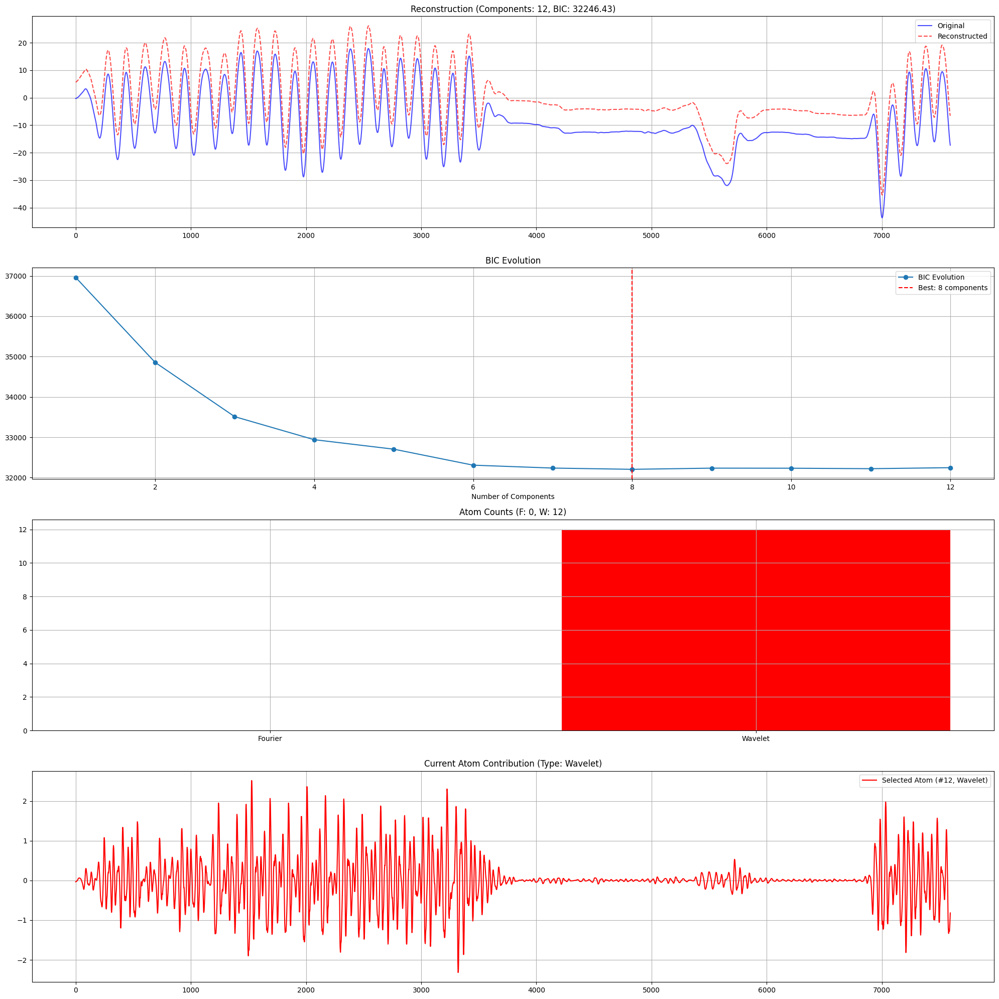

BIC: 32240.136153789914
RSS: 521932.1026067254
n: 7594
n_components: 13
log(n): 8.935113740791747


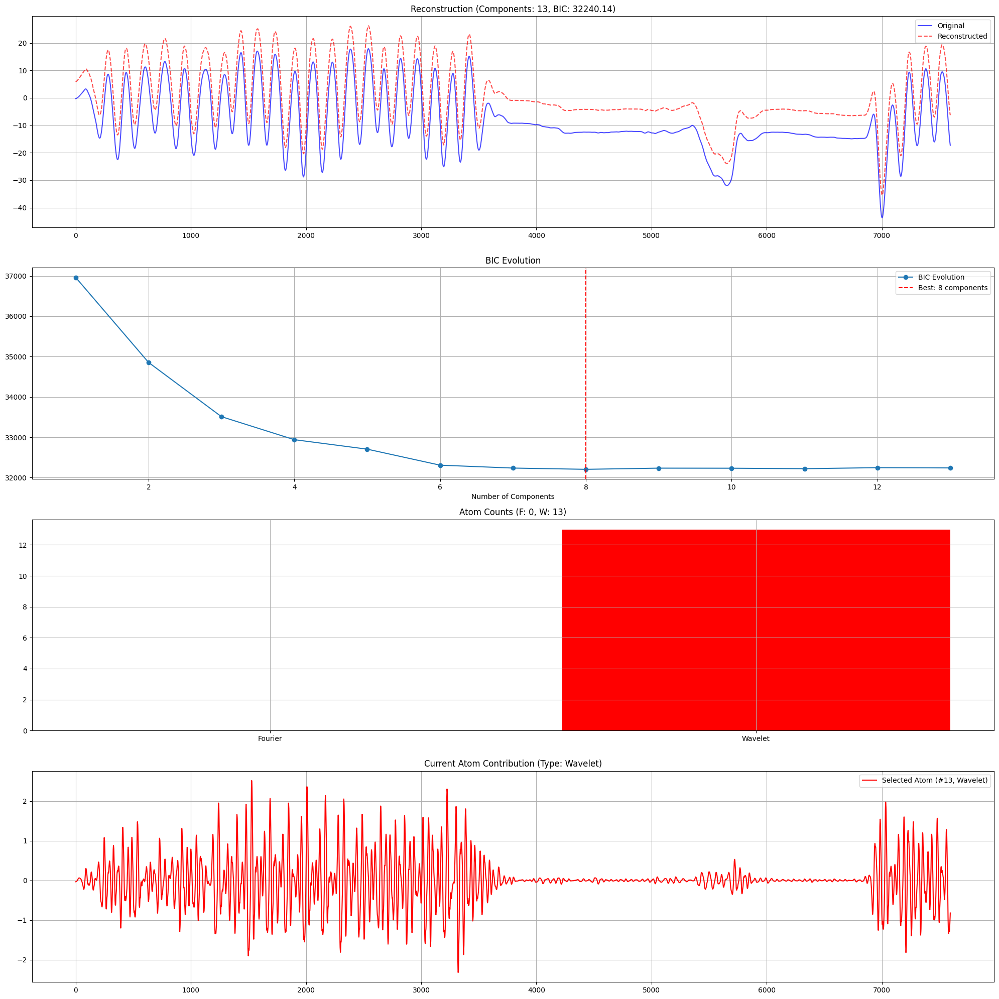

BIC: 32246.037651693987
RSS: 521723.64523494325
n: 7594
n_components: 14
log(n): 8.935113740791747


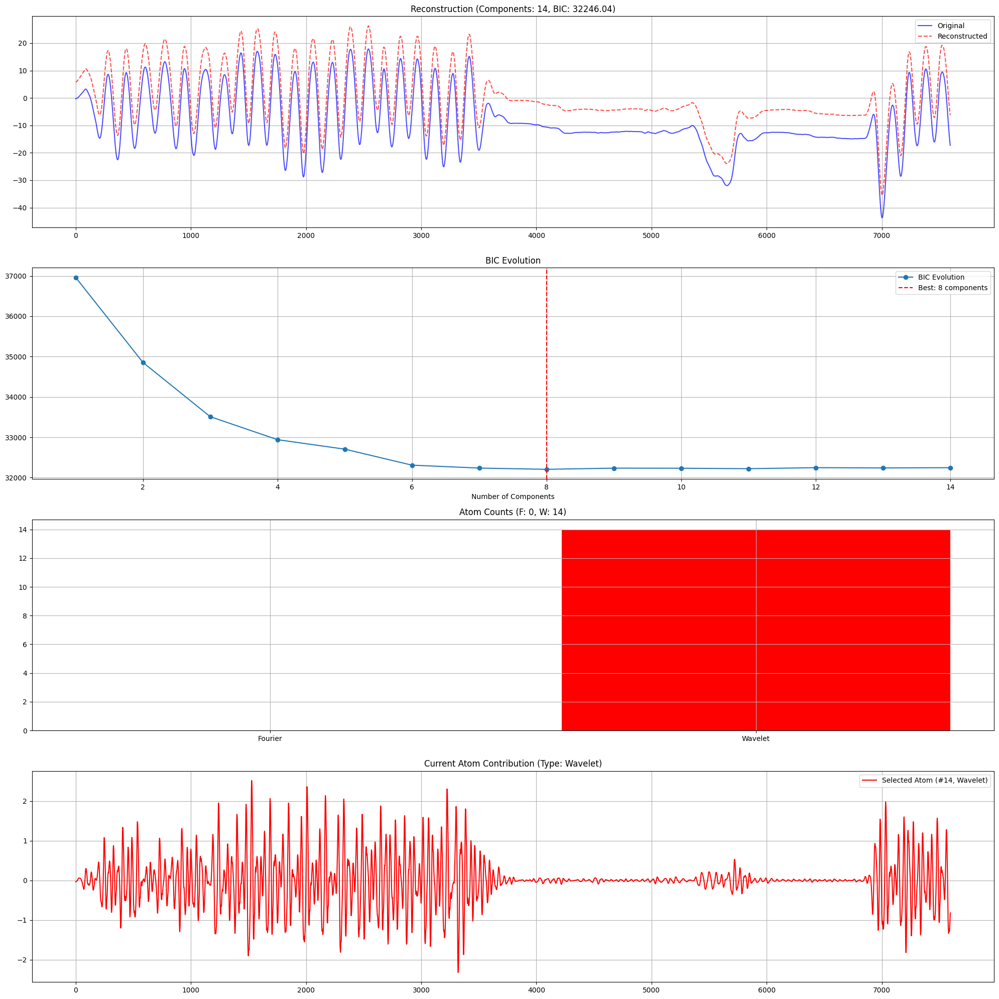

BIC: 32253.054014516332
RSS: 521591.8396954195
n: 7594
n_components: 15
log(n): 8.935113740791747


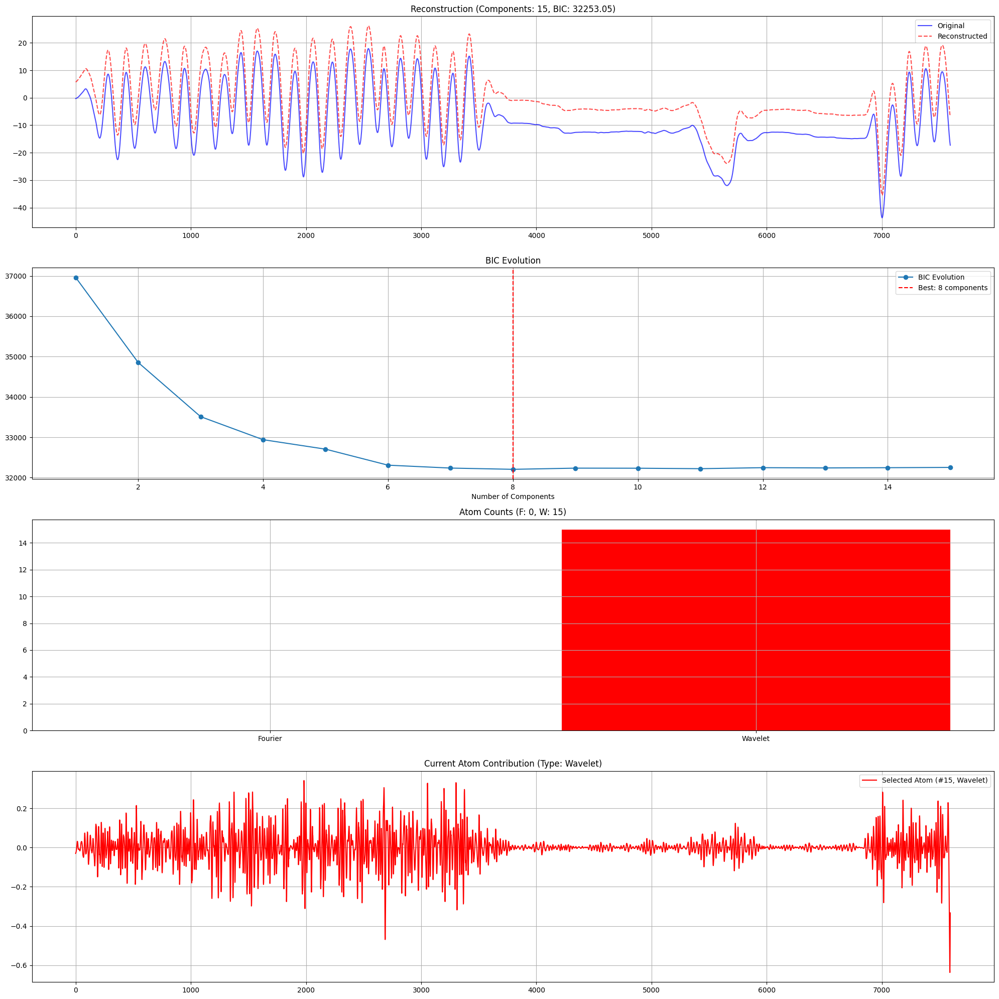

BIC: 32262.914095447082
RSS: 521655.3746864069
n: 7594
n_components: 16
log(n): 8.935113740791747


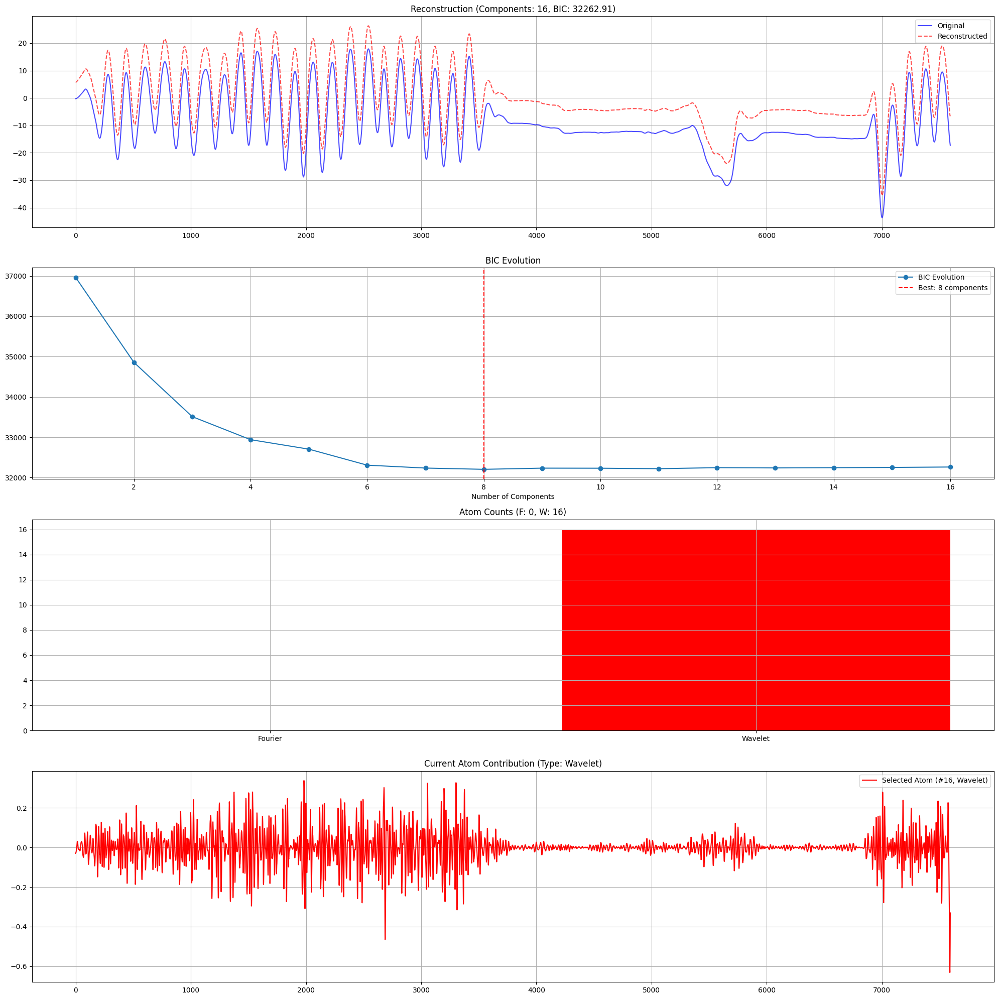

BIC: 32837.01364343284
RSS: 561959.4330219583
n: 7594
n_components: 17
log(n): 8.935113740791747


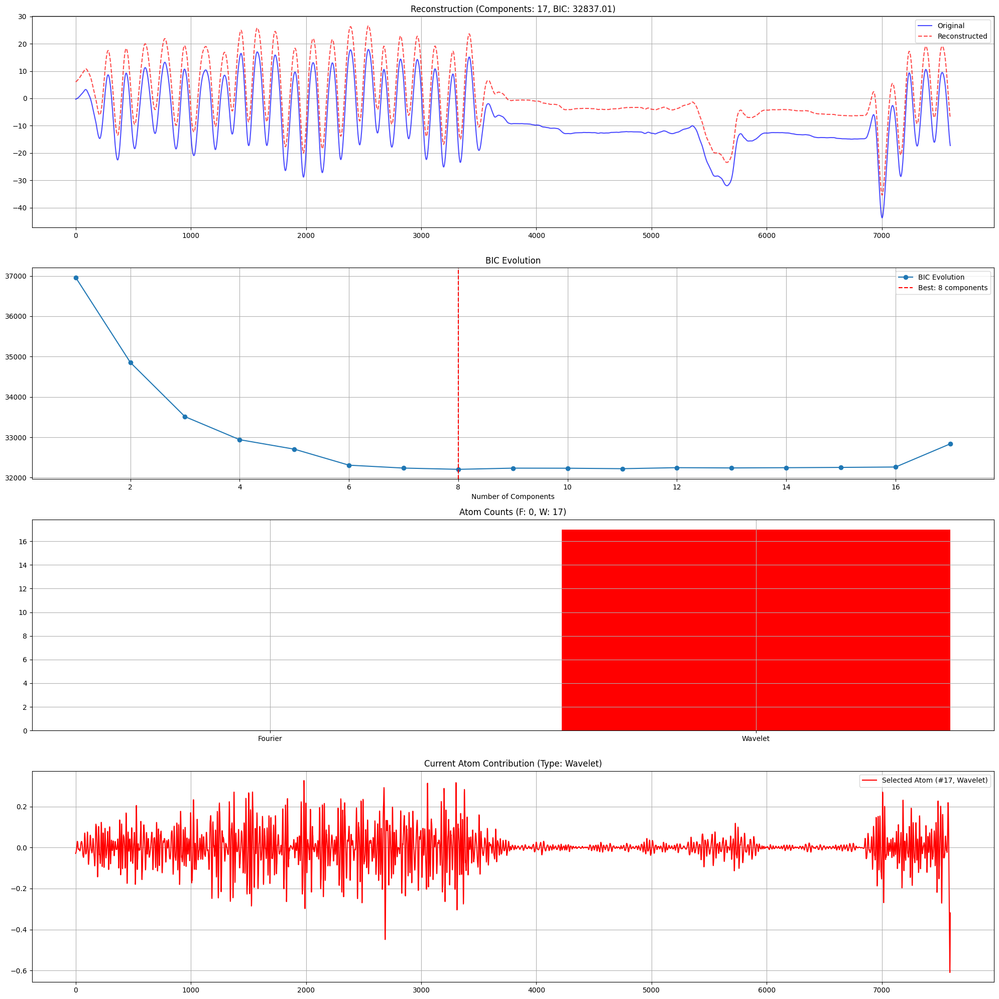

BIC: 32844.842940240924
RSS: 561877.6080267384
n: 7594
n_components: 18
log(n): 8.935113740791747


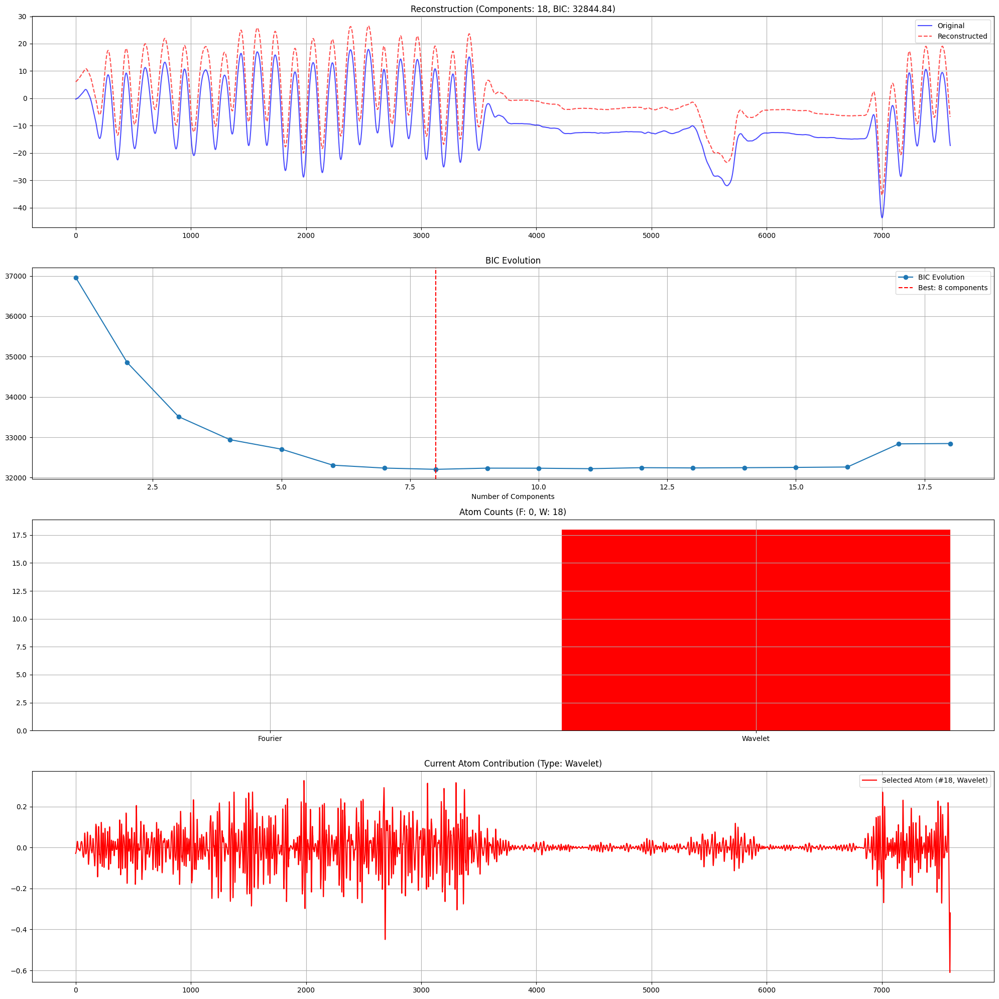

BIC: 32850.53413685346
RSS: 561637.6429022365
n: 7594
n_components: 19
log(n): 8.935113740791747


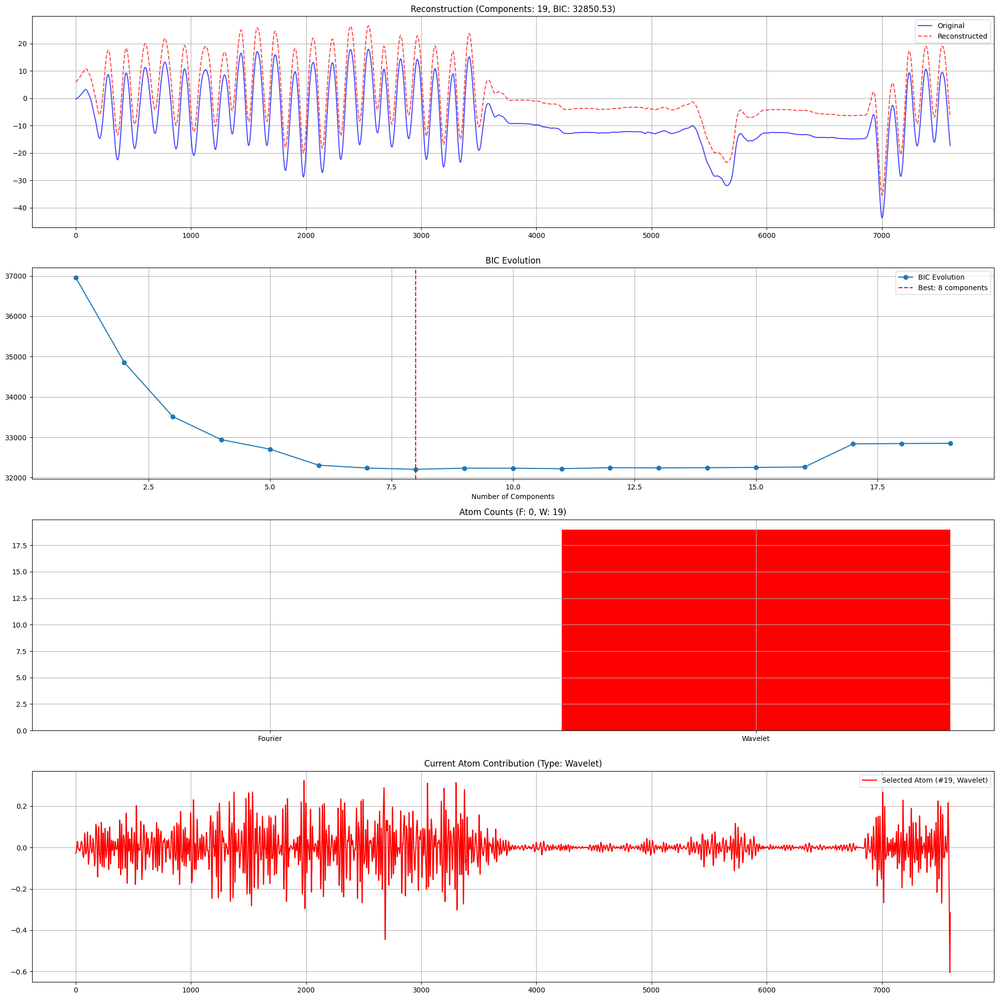

BIC: 32857.788202512296
RSS: 561513.329577222
n: 7594
n_components: 20
log(n): 8.935113740791747


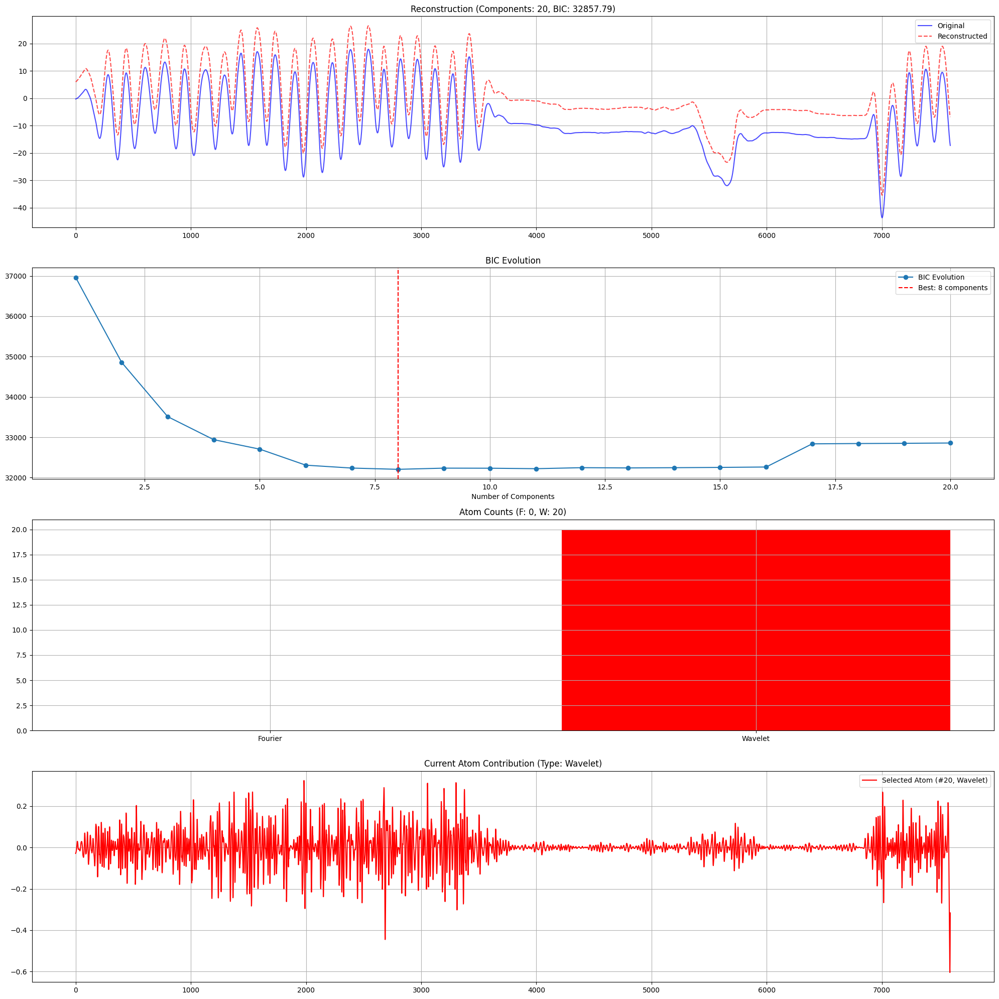

BIC: 32086.039940996296
RSS: 506656.29592289694
n: 7594
n_components: 21
log(n): 8.935113740791747


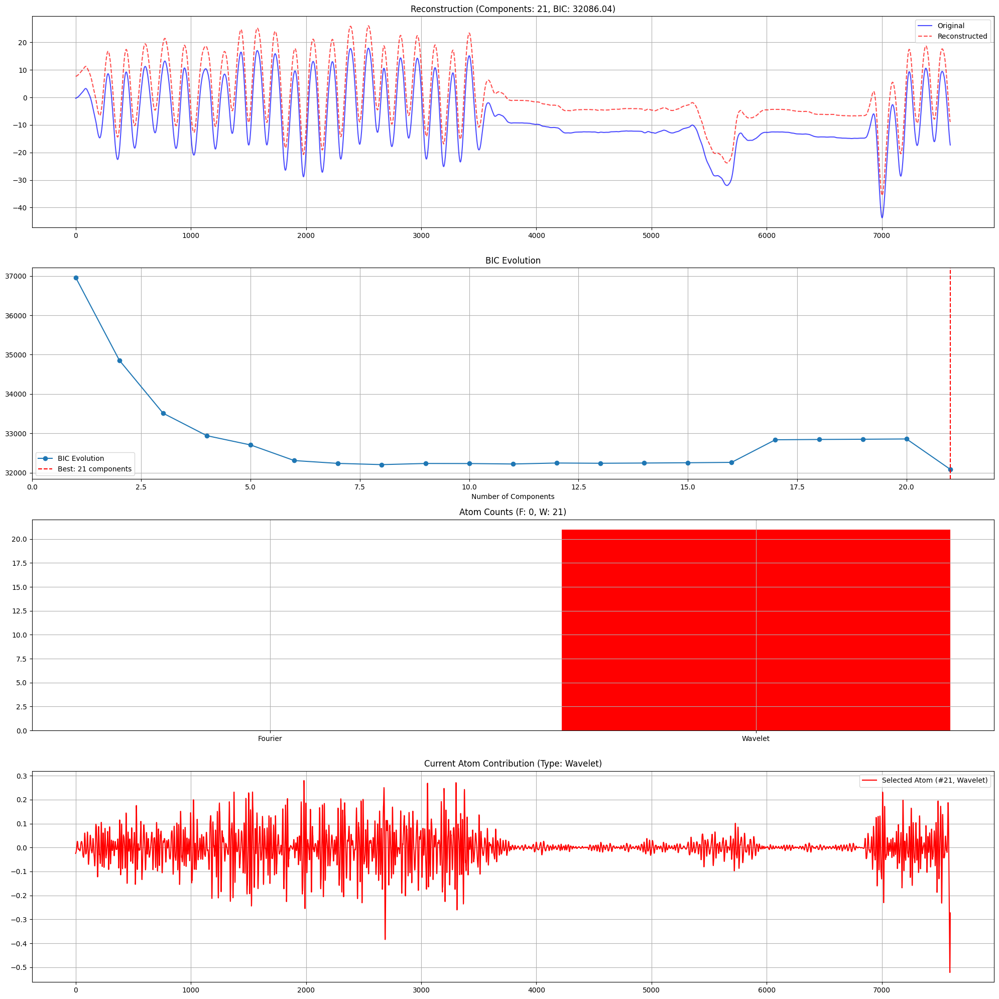

BIC: 32094.791961117313
RSS: 506644.08043476054
n: 7594
n_components: 22
log(n): 8.935113740791747


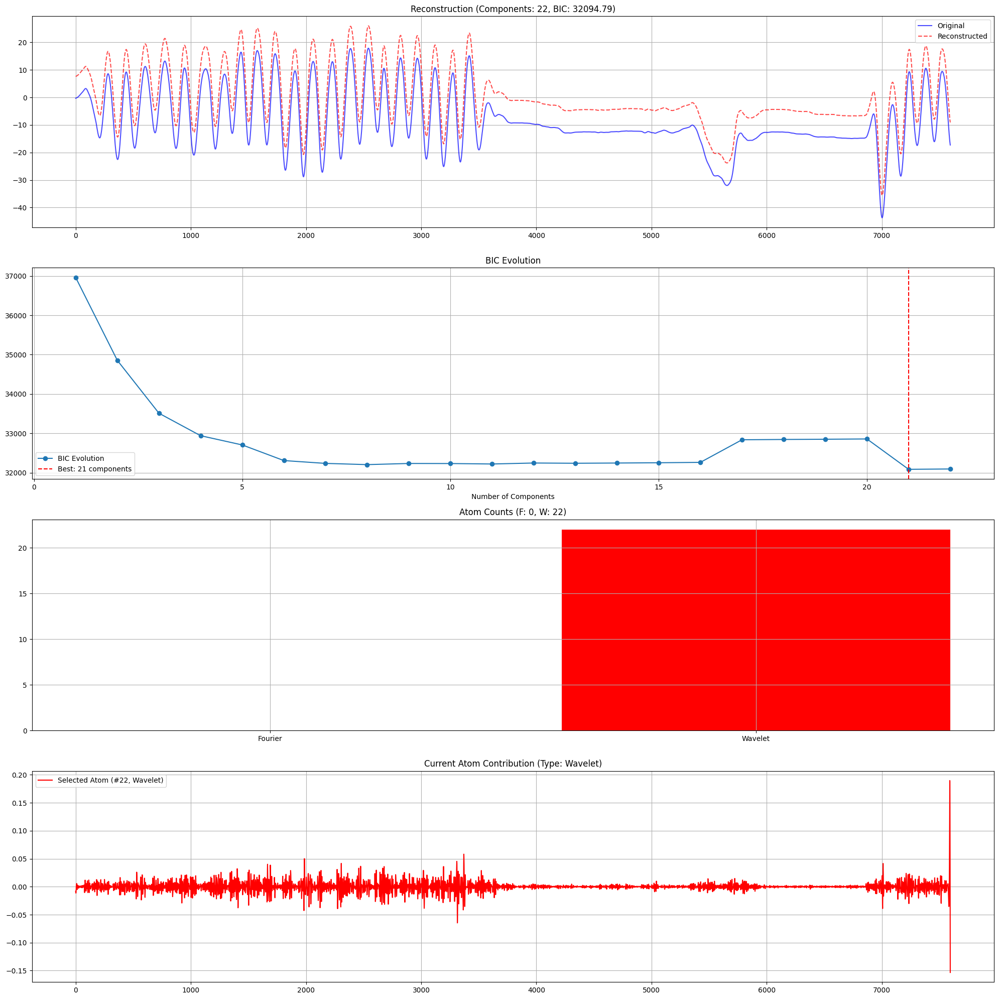

BIC: 29127.19801223247
RSS: 342355.8676290437
n: 7594
n_components: 23
log(n): 8.935113740791747


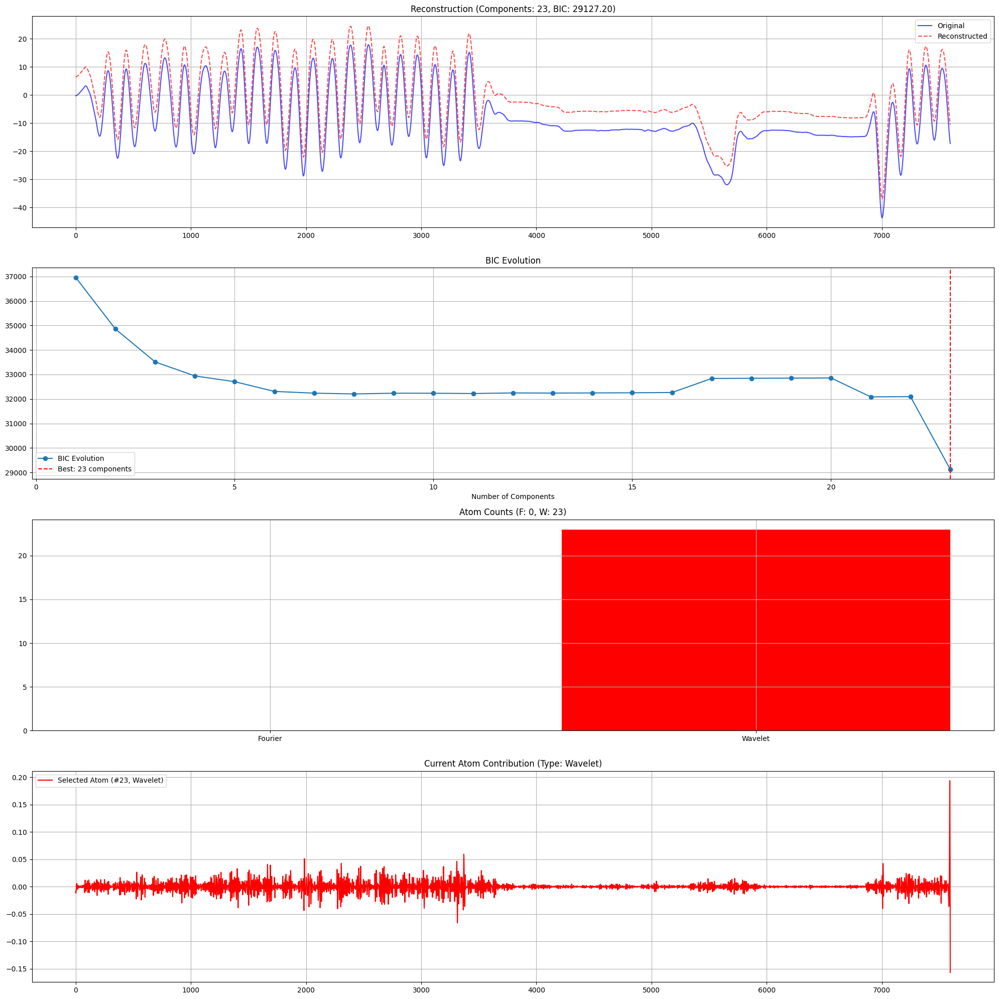

BIC: 29136.013786406107
RSS: 342350.48755529756
n: 7594
n_components: 24
log(n): 8.935113740791747


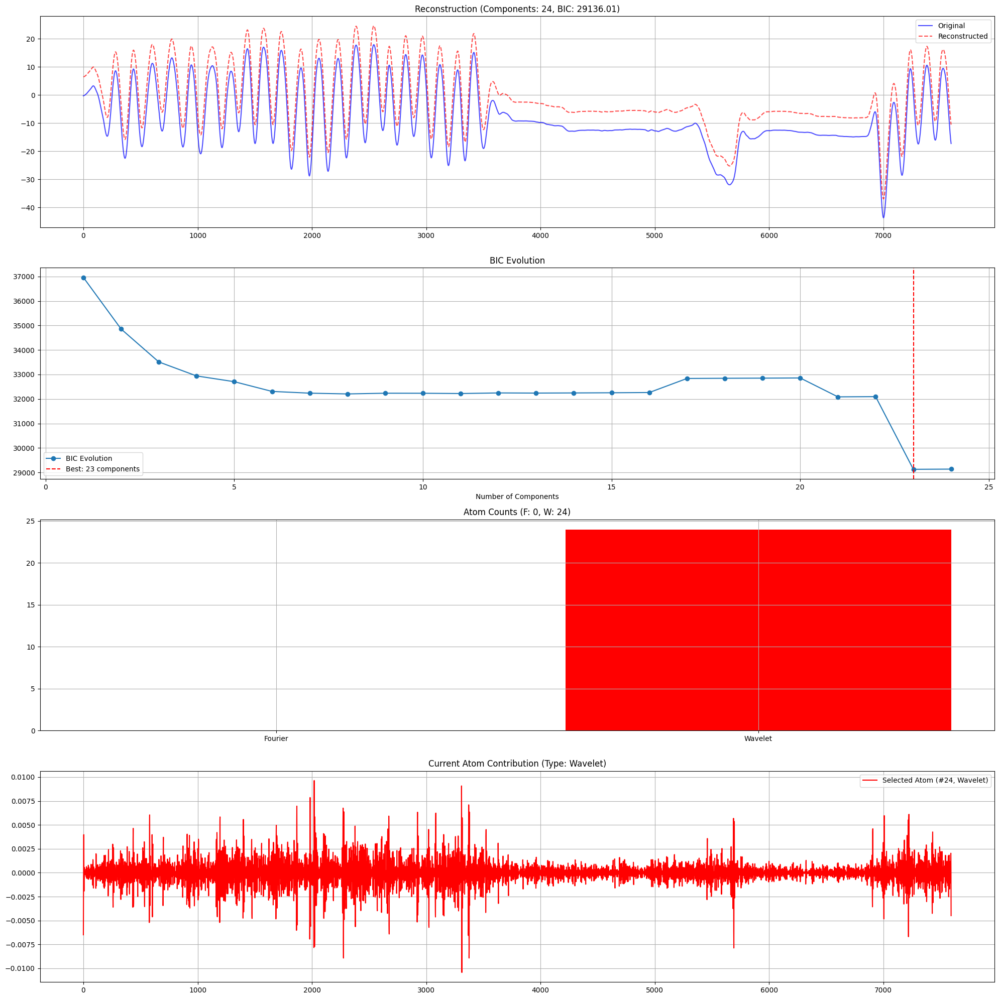

BIC: 29144.951944117478
RSS: 342350.62478271674
n: 7594
n_components: 25
log(n): 8.935113740791747


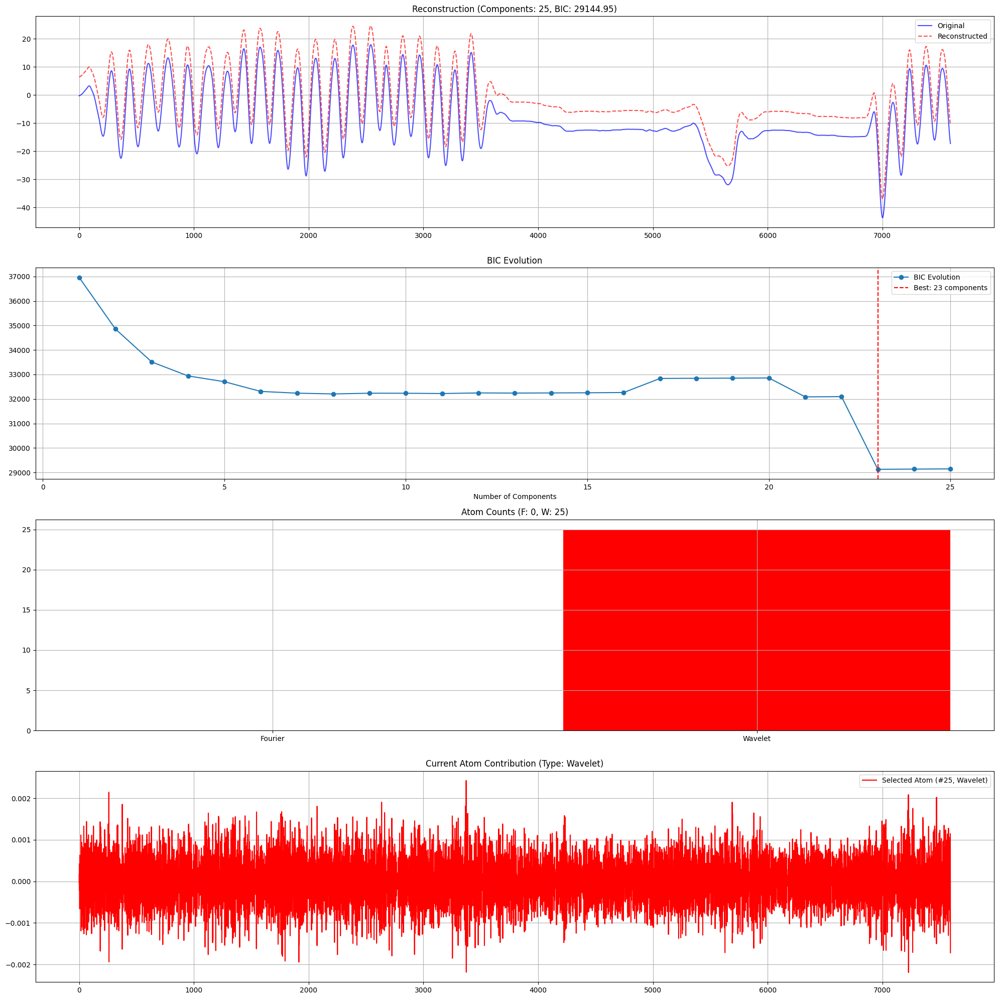

BIC: 29154.091110141602
RSS: 342359.8239353683
n: 7594
n_components: 26
log(n): 8.935113740791747


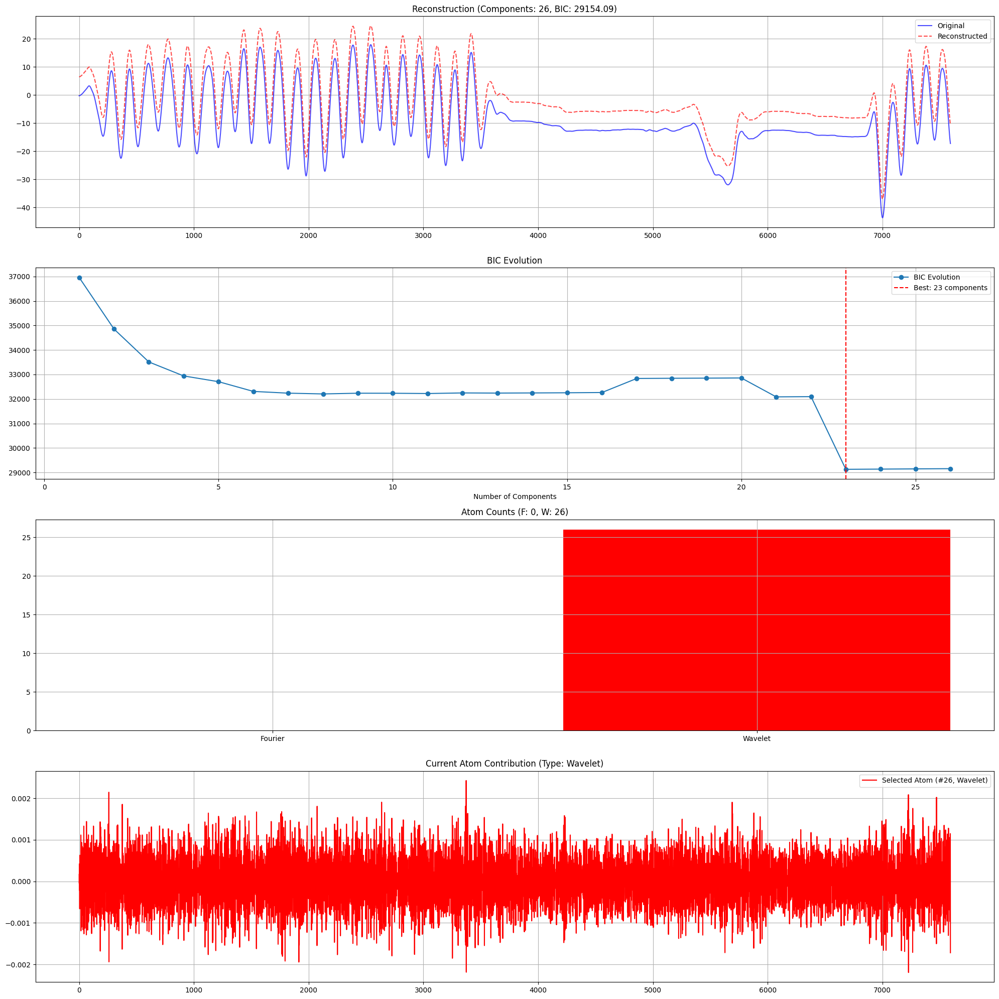

BIC: 29162.996275664016
RSS: 342358.47378438694
n: 7594
n_components: 27
log(n): 8.935113740791747


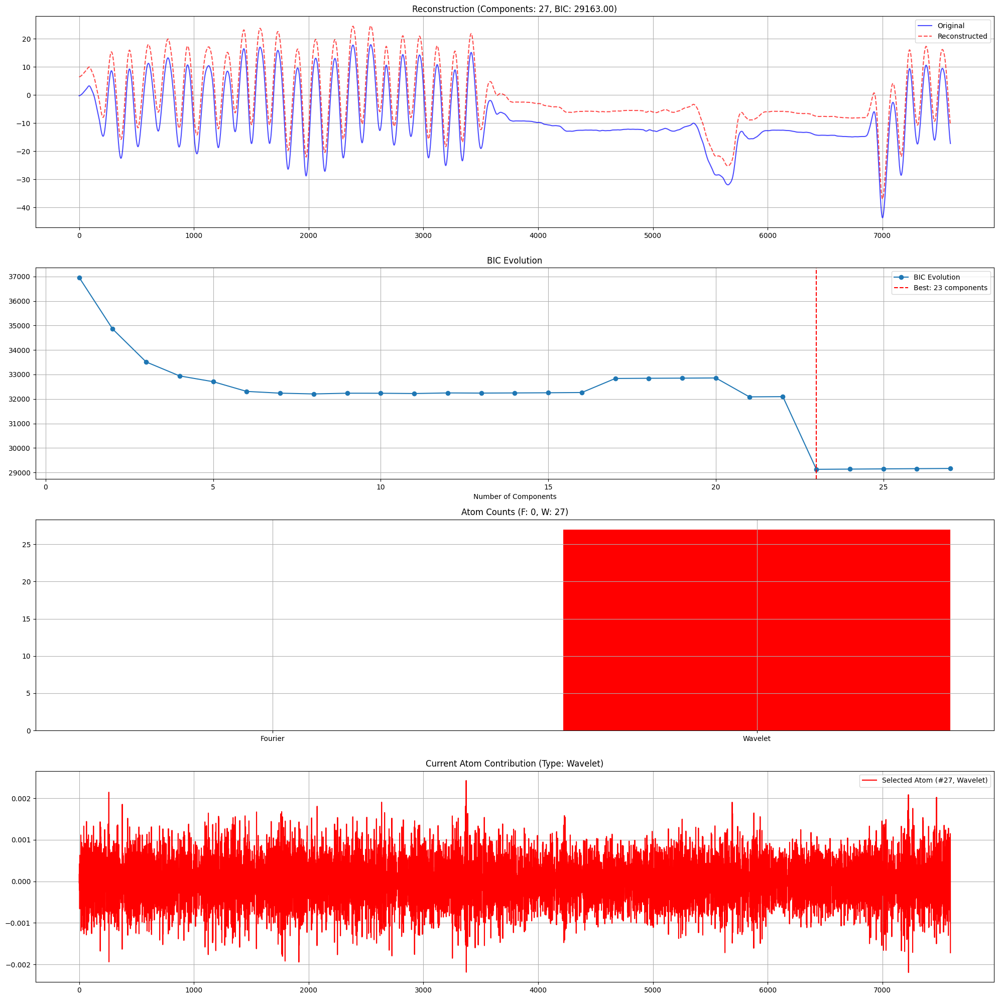

BIC: 29171.51534567245
RSS: 342339.7178987447
n: 7594
n_components: 28
log(n): 8.935113740791747


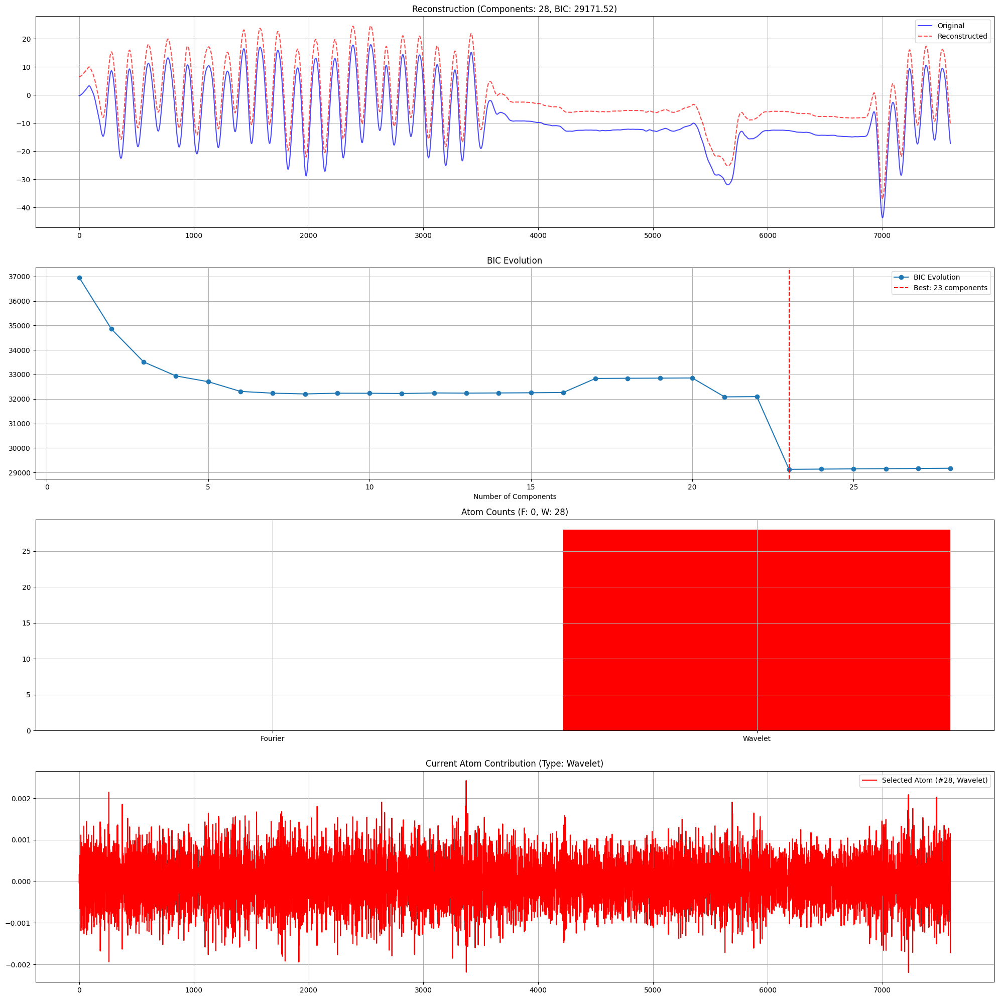

BIC: 29180.445147399187
RSS: 342339.4784316972
n: 7594
n_components: 29
log(n): 8.935113740791747


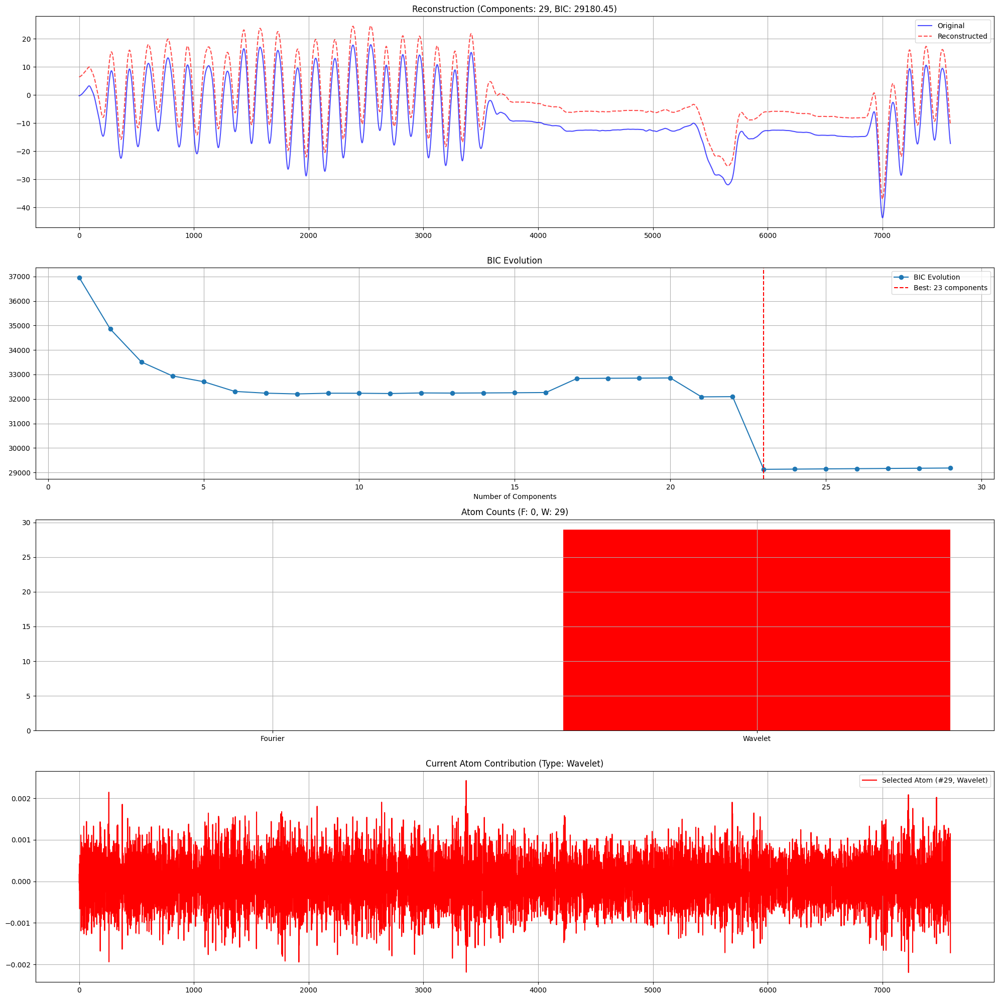

BIC: 29189.369614312393
RSS: 342338.99847030046
n: 7594
n_components: 30
log(n): 8.935113740791747


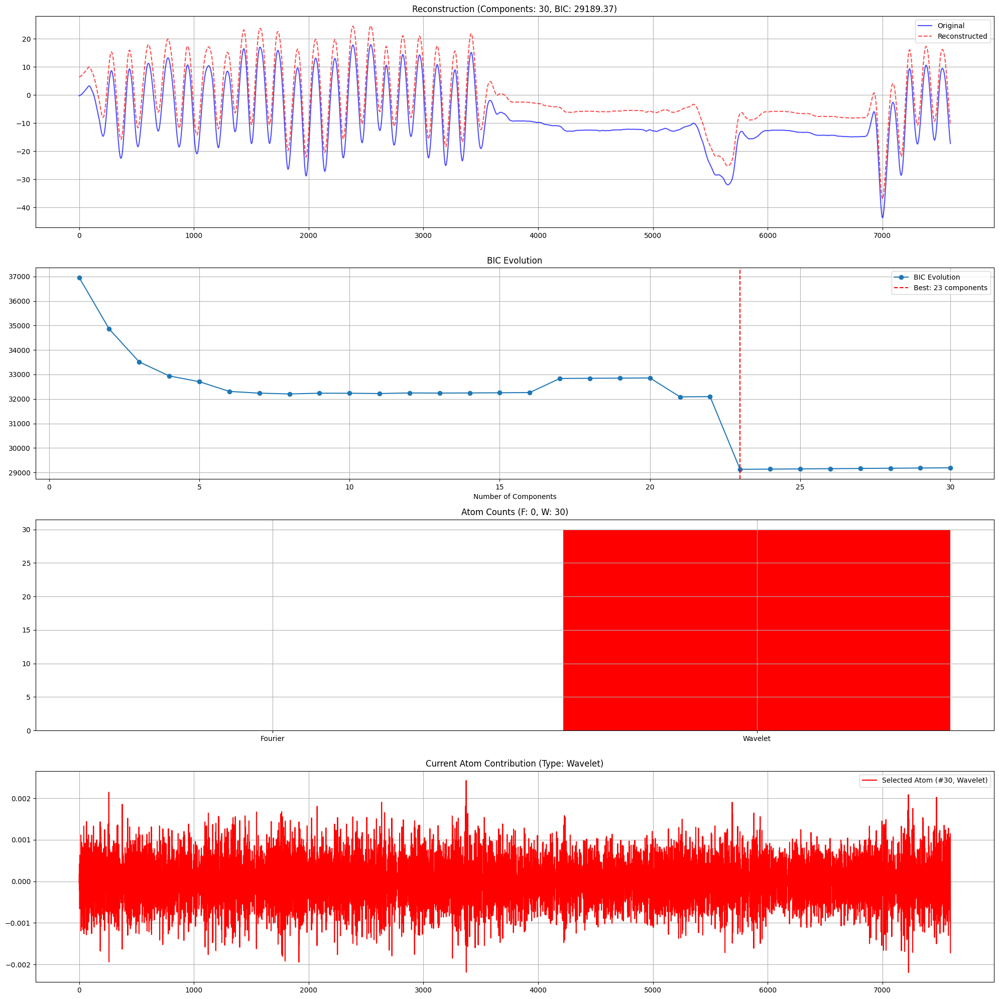

BIC: 29198.308943619835
RSS: 342339.1885089185
n: 7594
n_components: 31
log(n): 8.935113740791747


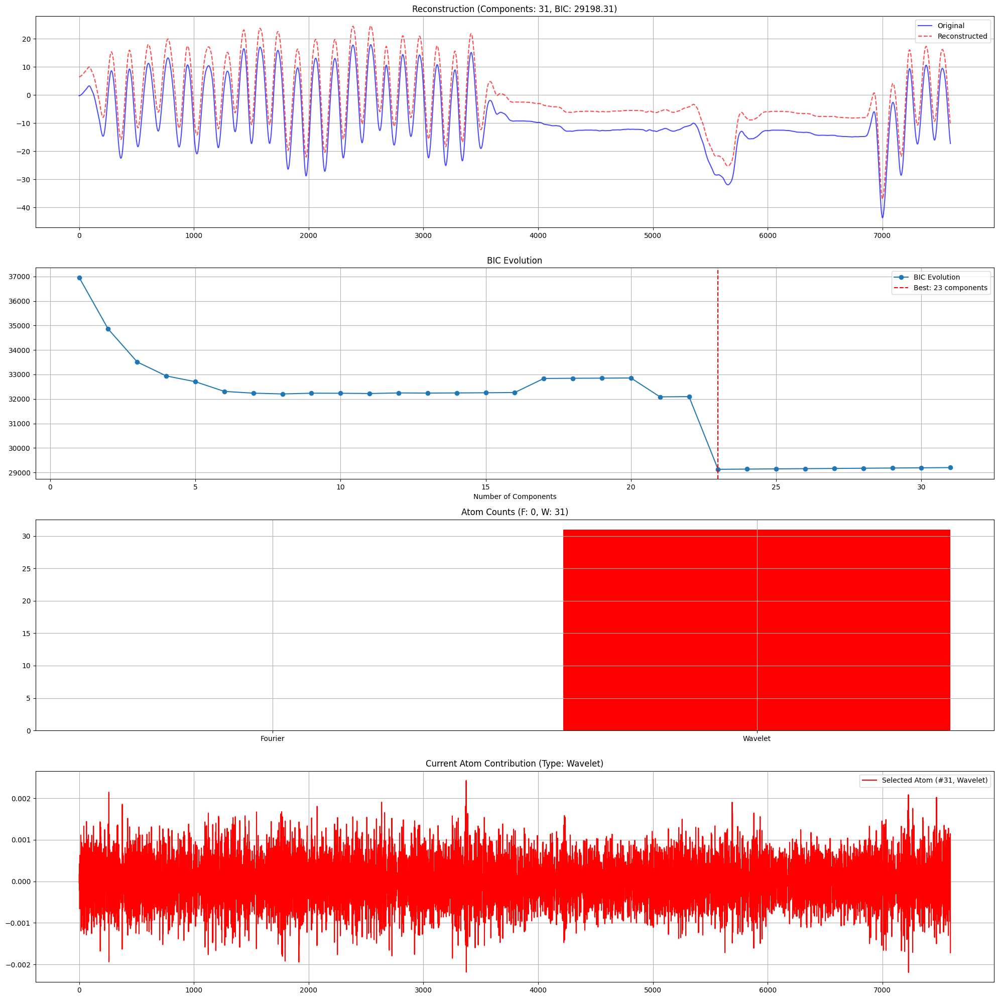

BIC: 29207.23899762926
RSS: 342338.96041519294
n: 7594
n_components: 32
log(n): 8.935113740791747


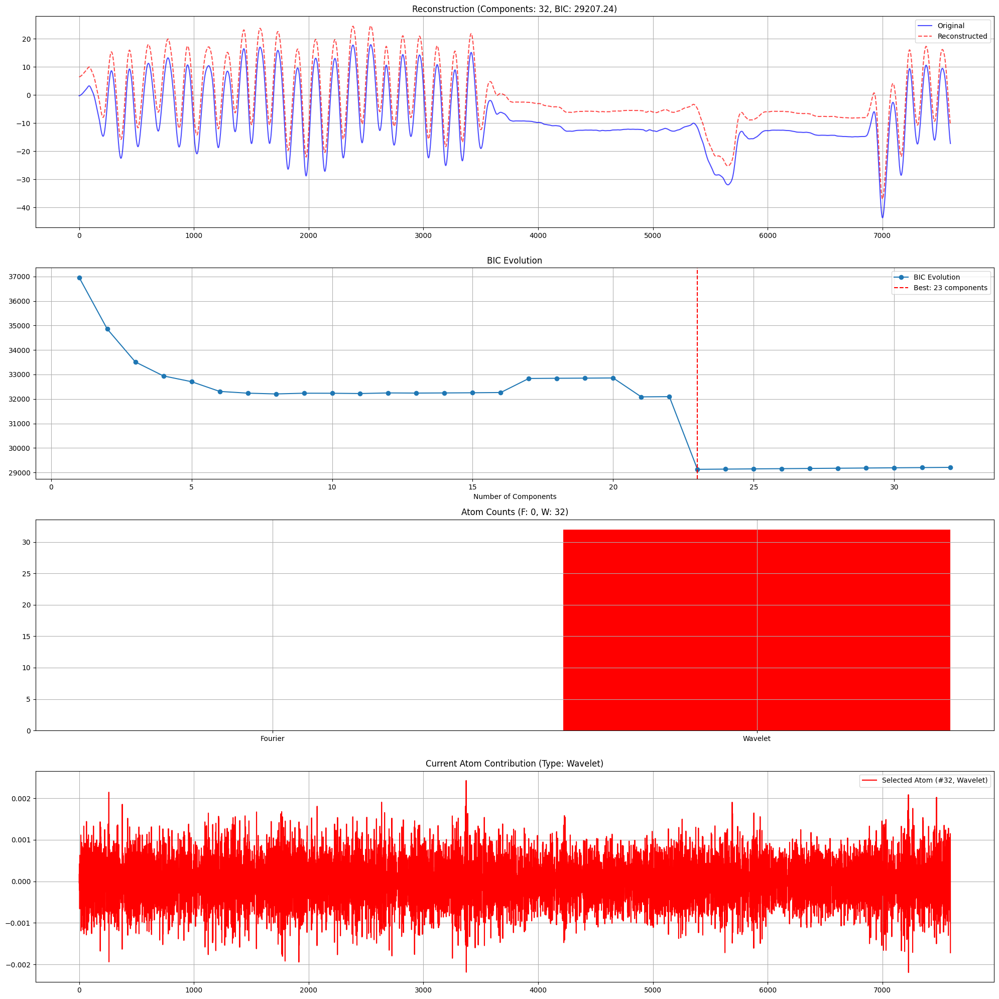

BIC: 29216.177689963006
RSS: 342339.1217388798
n: 7594
n_components: 33
log(n): 8.935113740791747


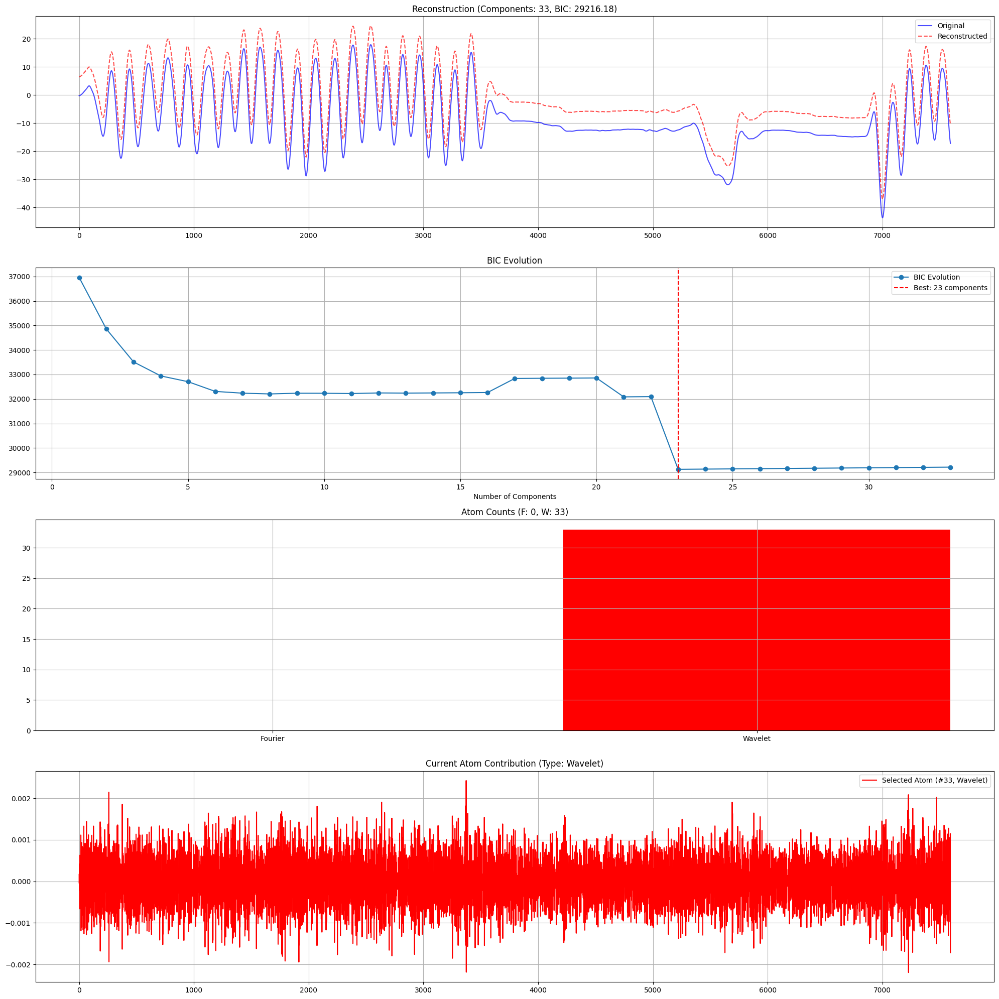

BIC: 29225.107983789894
RSS: 342338.9044562136
n: 7594
n_components: 34
log(n): 8.935113740791747


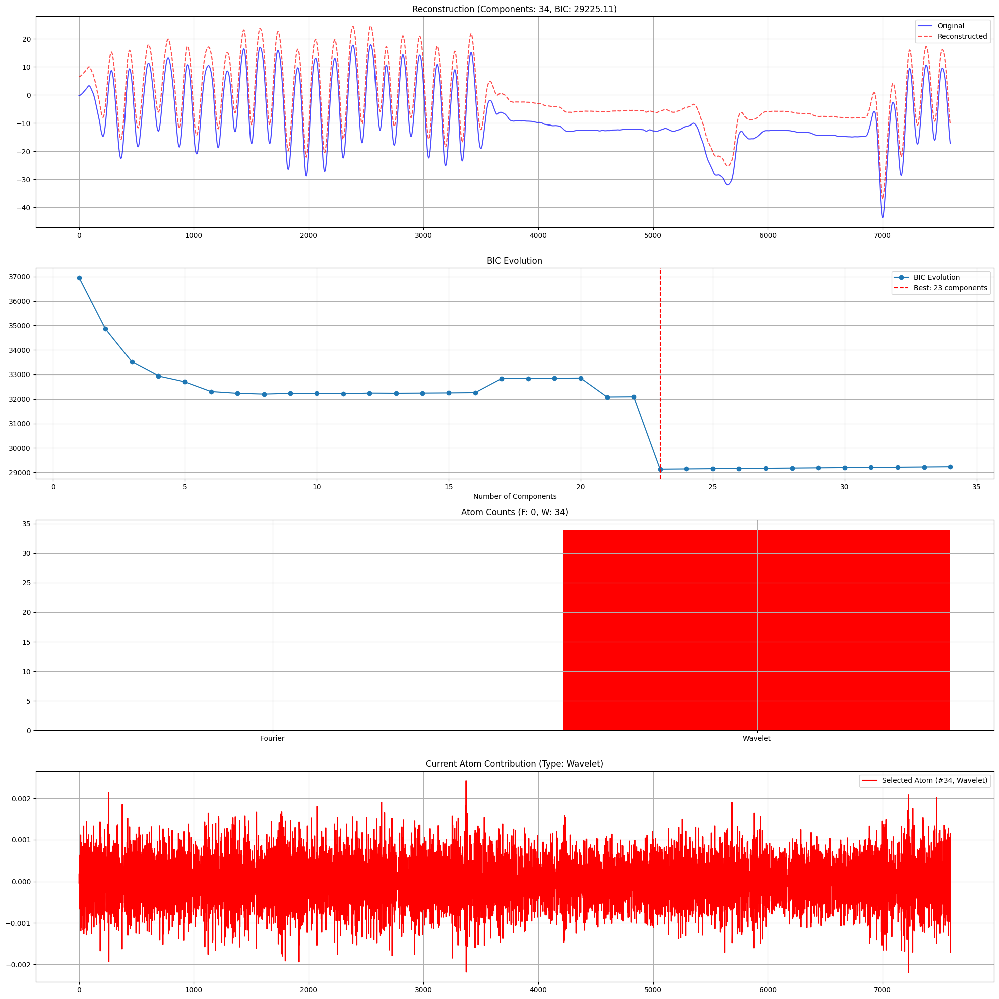

BIC: 29234.03891388134
RSS: 342338.7158565903
n: 7594
n_components: 35
log(n): 8.935113740791747


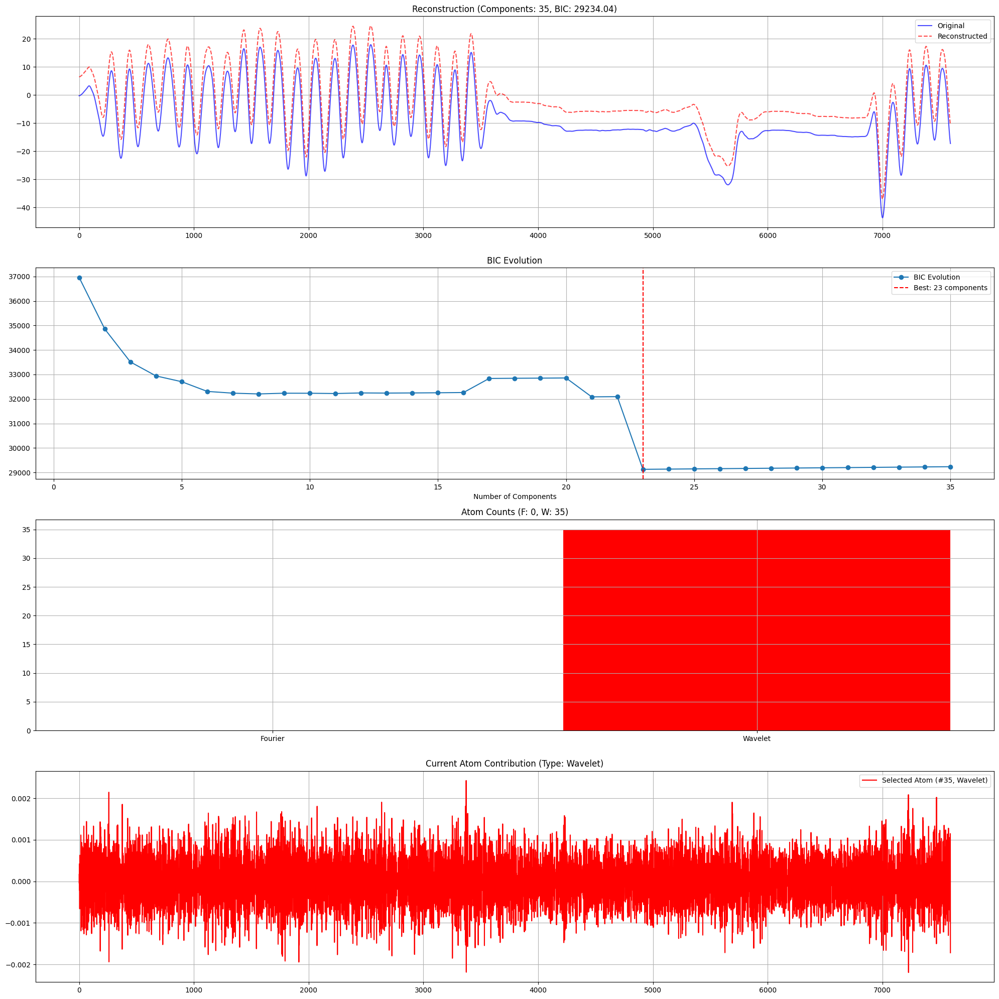


Analysis Results:
Fourier atoms used: 0
Wavelet atoms used: 35
Final BIC: 29234.03891388134
Best BIC: 29127.19801223247
Best BIC Fourier: 0
Best BIC Wavelet: 23


In [155]:

if __name__ == "__main__":
    # Load signal P026	20181209_Sun_140556_Fp_00.asc
    file_path = "/content/drive/MyDrive/PD_pat/pat/P026/20181209_Sun_140556_Fp_00.asc"
    signal = load_signal_data(file_path)

    if signal is not None:
        # Run analysis
        bics, fourier_count, wavelet_count, reconstructions, b_for, b_wave = analyze_signal_with_omp(
            signal,
            n_components=35,
            wavelet='db4',
            dict_mode = "all",  # change the counting to be based on wherter or not he signal appers in the sepered dcit and checnge create hybrid to return the two seperate dict
            plot = True
        )

        if bics is not None:
            # Final results
            print(f"\nAnalysis Results:")
            print(f"Fourier atoms used: {fourier_count}")
            print(f"Wavelet atoms used: {wavelet_count}")
            print(f"Final BIC: {bics[-1] if bics else 'N/A'}")
            print(f"Best BIC: {min(bics)}")
            print(f"Best BIC Fourier: {b_for}")
            print(f"Best BIC Wavelet: {b_wave}")

# Utils

In [ ]:
import os
import pandas as pd

# Function to create a DataFrame with recording information
def create_recordings_dataframe(base_pathsm,kind):
    """
    Scans directories and subdirectories to create a DataFrame with recording information.

    Parameters:
        base_paths (list): List of base directory paths to scan.

    Returns:
        pd.DataFrame: A DataFrame containing row ID, type of patient, recording name, and full path.
    """
    data = []
    row_id = 1

    for base_path in base_paths:
        for patient_type in os.listdir(base_path):
            patient_type_path = os.path.join(base_path, patient_type)
            if os.path.isdir(patient_type_path):
                for recording in os.listdir(patient_type_path):
                    if recording.endswith(".asc") and kind in recording:
                        full_path = os.path.join(patient_type_path, recording)
                        data.append({
                            "Row ID": row_id,
                            "Type of Patient": patient_type,
                            "Recording Name": recording,
                            "Full Path": full_path
                        })
                        row_id += 1

    return pd.DataFrame(data)

# Function to process recordings and store output in a DataFrame
def process_recordings(df, processing_function, mode = "omp"):
    """
    Processes recordings based on the provided DataFrame and function.

    Parameters:
        df (pd.DataFrame): Input DataFrame with recording information.
        processing_function (function): Function to process a recording.

    Returns:
        pd.DataFrame: A DataFrame with row ID and processing output.
    """
    results = []

    for _, row in df.iterrows():
        print(_)
        full_path = row["Full Path"]

        if mode == "omp":
            try:
              bics, fourier_count, wavelet_count, reconstructions, b_for, b_wave = processing_function(full_path)
            except Exception as e:
               result = f"Error: {str(e)}"
            results.append({
                "Row ID": row["Row ID"],
                "Type of Patient":  row["Type of Patient"],
                "Recording Name":  row["Recording Name"],
                "Best Bic" : min(bics),
                "Best Fourier Count": b_for,
                "Best Wavelet Count": b_wave,
                "reconstructions Output": reconstructions,
                "Bics": bics,
                "Fourier Count": fourier_count,
                "Wavelet Count": wavelet_count

            })


        # try:
        #     result = omp(full_path)
        # except Exception as e:
        #     result = f"Error: {str(e)}"
        # results.append({
        #     "Row ID": row["Row ID"],
        #     "Type of Patient":  row["Type of Patient"],
        #     "Recording Name":  row["Recording Name"],
        #     "Processing Output": result
        # })

    return pd.DataFrame(results)

# Example processing function
def example_processing_function(file_path):
    """
    Example processing function to calculate the length of the signal in a file.

    Parameters:
        file_path (str): Path to the file to process.

    Returns:
        int: Length of the signal in the file.
    """
    with open(file_path, "r") as file:
        data = file.readlines()
    return len(data)

def omp(file_path, n_components = 15 , wavelet='db4',dict_mode = "all",plot = False):
    """
    Example processing function to calculate the length of the signal in a file.

    Parameters:
        file_path (str): Path to the file to process.

    Returns:
        int: Length of the signal in the file.
    """

    signal = load_signal_data(file_path)

    if signal is not None:
        # Run analysis
        bics, fourier_count, wavelet_count, reconstructions, b_for, b_wave = analyze_signal_with_omp(
            signal,
            n_components = n_components,
            wavelet = wavelet,
            dict_mode = "all",
            plot = False
        )


    return bics, fourier_count, wavelet_count, reconstructions, b_for, b_wave



# Example usage
if __name__ == "__main__":
    # Define base paths
    base_paths = [
        "/content/drive/MyDrive/pat_Old_Young/pat",
        "/content/drive/My Drive/PD_pat/pat"
    ]

    # Create the DataFrame
    recordings_df = create_recordings_dataframe(base_paths, "_Fp_")
    print("Recordings DataFrame:")
    print(len(recordings_df))

    # Process the recordings
    results_df = process_recordings(recordings_df, omp)
    print("\nProcessing Results DataFrame:")
    print(results_df.head())

Recordings DataFrame:
130
0
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 26805.337369137098
RSS: 258609.92466375924
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 21319.145759598756
RSS: 125448.72007995081
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 16453.293758644737
RSS: 66032.02894500455
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 13788.094079457336
RSS: 46436.91610453332
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 11416.907898442034
RSS: 33945.48801281931
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 9036.114577112845
RSS: 24782.862269344114
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 6463.473043949321
RSS: 17642.17479468895
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 4167.101846416742
RSS: 13024.116924958407
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 3630.

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -5888.228864293937
RSS: 3465.315893040792
n: 7590
n_components: 7
log(n): 8.934586870389676
BIC: 19218.25568525614
RSS: 94581.68658714119
n: 7590
n_components: 8
log(n): 8.934586870389676
BIC: 20251.463168106162
RSS: 108246.84112021938
n: 7590
n_components: 9
log(n): 8.934586870389676
BIC: 20256.088590839314
RSS: 108185.40225090286
n: 7590
n_components: 10
log(n): 8.934586870389676
BIC: 20265.893566884566
RSS: 108197.80920773219
n: 7590
n_components: 11
log(n): 8.934586870389676
BIC: -3447.8154206034783
RSS: 4751.4419062409215
n: 7590
n_components: 12
log(n): 8.934586870389676
BIC: -657.5457249876143
RSS: 6854.4319605264955
n: 7590
n_components: 13
log(n): 8.934586870389676
BIC: -654.2548886506336
RSS: 6849.337056038127
n: 7590
n_components: 14
log(n): 8.934586870389676
BIC: -98814.88639368335
RSS: 0.016536924789420704
n: 7590
n_components: 15
log(n): 8.934586870389676
2
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fouri

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -41776.30379416859
RSS: 30.272124276692946
n: 7587
n_components: 15
log(n): 8.934191535338075
3
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7589, 15)
Wavelet dictionary shape: (7589, 16)
7589
BIC: 20891.931906697962
RSS: 118919.33935025461
n: 7589
n_components: 1
log(n): 8.934455109403913
BIC: 11750.553415115213
RSS: 35613.03620000241
n: 7589
n_components: 2
log(n): 8.934455109403913
BIC: 8813.317141755424
RSS: 24155.10685015328
n: 7589
n_components: 3
log(n): 8.934455109403913
BIC: 5530.511938511142
RSS: 15654.280346003872
n: 7589
n_components: 4
log(n): 8.934455109403913
BIC: 2524.7431051802278
RSS: 10522.311808672286
n: 7589
n_components: 5
log(n): 8.934455109403913
BIC: -1386.3043215409466
RSS: 6277.44613336596
n: 7589
n_components: 6
log(n): 8.934455109403913
BIC: -2621.3461380670833
RSS: 5328.367427655019
n: 7589
n_components: 7
log(n): 8.934455109403913
BIC: -4056.881819211924
RSS: 4404

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 22416.24263233999
RSS: 145186.31758152175
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 19063.782958588574
RSS: 93258.91221880727
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 17176.32273795484
RSS: 72650.2459803719
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 15761.118709314891
RSS: 60227.07444372227
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 14334.939150960608
RSS: 49856.153050758396
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 13312.98125629287
RSS: 43527.41334171939
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 11666.185962177693
RSS: 35000.40164976711
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 10481.866647721774
RSS: 29911.060385939607
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 9669.662680078285
RSS: 26845.503588679006
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 4584.221328714831
RSS: 13725.508524839908
n:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 22294.723453194438
RSS: 141591.93297873903
n: 7588
n_components: 10
log(n): 8.934323331054905
BIC: 22309.955664302077
RSS: 141709.50022510433
n: 7588
n_components: 11
log(n): 8.934323331054905
BIC: 22321.580458173627
RSS: 141759.7549478368
n: 7588
n_components: 12
log(n): 8.934323331054905
BIC: 22329.42383685785
RSS: 141739.37527875617
n: 7588
n_components: 13
log(n): 8.934323331054905
BIC: 22338.373082836722
RSS: 141739.65402531106
n: 7588
n_components: 14
log(n): 8.934323331054905
BIC: 22741.726699820032
RSS: 149302.02990537105
n: 7588
n_components: 15
log(n): 8.934323331054905
7
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7583, 15)
Wavelet dictionary shape: (7583, 16)
7583
BIC: 21930.18048606196
RSS: 136558.0550970867
n: 7583
n_components: 1
log(n): 8.933664178700935
BIC: 14142.788085526134
RSS: 48843.32322665618
n: 7583
n_components: 2
log(n): 8.933664178700935
BIC: 11744.413319310279
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 17022.569290896325
RSS: 71061.49036487736
n: 7591
n_components: 5
log(n): 8.934718614016768
BIC: 16624.72017007073
RSS: 67353.70518637491
n: 7591
n_components: 6
log(n): 8.934718614016768
BIC: 15708.434951057649
RSS: 59624.9501821249
n: 7591
n_components: 7
log(n): 8.934718614016768
BIC: 14002.522627997698
RSS: 47568.40715390756
n: 7591
n_components: 8
log(n): 8.934718614016768
BIC: 13917.804261267203
RSS: 46985.142803788265
n: 7591
n_components: 9
log(n): 8.934718614016768
BIC: 13917.308691470233
RSS: 46926.809469492524
n: 7591
n_components: 10
log(n): 8.934718614016768
BIC: 13917.43507937788
RSS: 46872.388822289126
n: 7591
n_components: 11
log(n): 8.934718614016768
BIC: 22420.33536885093
RSS: 143506.58193562683
n: 7591
n_components: 12
log(n): 8.934718614016768
BIC: 19413.488210628337
RSS: 96456.97256006818
n: 7591
n_components: 13
log(n): 8.934718614016768
BIC: 19428.659911859508
RSS: 96536.25693300075
n: 7591
n_components: 14
log(n): 8.934718614016768
BIC: 19437.609233443185
R

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 28860.619233089834
RSS: 338964.39614124765
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 26633.891773200427
RSS: 252541.09984910503
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 24241.13819523865
RSS: 184084.6843946465
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 20800.773417187804
RSS: 116897.98278739593
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 15794.630438963959
RSS: 60405.21208427622
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 11762.850575955801
RSS: 35485.43607220037
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 6293.475366748022
RSS: 17251.730138762672
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 322.81098961686655
RSS: 7851.532041203207
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 3003.4751830095806
RSS: 11161.128397679206
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 9259.428268847809
RSS: 25402.45756382306

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



log(n): 8.934982049213234
BIC: 17578.407835371014
RSS: 76523.70203104091
n: 7593
n_components: 4
log(n): 8.934982049213234
BIC: 12320.780108197372
RSS: 38244.23755080911
n: 7593
n_components: 5
log(n): 8.934982049213234
BIC: 12107.084689727146
RSS: 37139.17777685662
n: 7593
n_components: 6
log(n): 8.934982049213234
BIC: 15207.931760883577
RSS: 55805.811517633214
n: 7593
n_components: 7
log(n): 8.934982049213234
BIC: 14659.72905684073
RSS: 51857.66947662002
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: 14959.458753181185
RSS: 53882.221273042735
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: 15468.96754531744
RSS: 57554.15168426444
n: 7593
n_components: 10
log(n): 8.934982049213234
BIC: 15472.416979514308
RSS: 57512.58681709673
n: 7593
n_components: 11
log(n): 8.934982049213234
BIC: 15427.038942057265
RSS: 57102.664924503304
n: 7593
n_components: 12
log(n): 8.934982049213234
BIC: 15407.316128210738
RSS: 56887.55202488326
n: 7593
n_components: 13
log(n): 8.93498204921323

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 31049.15768570445
RSS: 452149.23996461125
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 28440.31842979039
RSS: 320341.26792631473
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 25969.158817801384
RSS: 231108.37574918946
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 23778.301154912642
RSS: 172999.3585180158
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 21179.33926544036
RSS: 122727.05344867514
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 20126.435673793127
RSS: 106716.26515290793
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 19806.521540285277
RSS: 102194.83383302114
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 19218.086689291693
RSS: 94465.84968583746
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 19189.364102624197
RSS: 93998.68433222239
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 19197.58987652954
RSS: 93989.90357279881

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 17938.759879905174
RSS: 79542.24726917729
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 17943.160250656998
RSS: 79494.77268589631
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 17949.626783386913
RSS: 79468.93957253791
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 17954.089529262943
RSS: 79422.16092112355
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: 17961.60186062794
RSS: 79407.28325142876
n: 7596
n_components: 15
log(n): 8.935377071932177
13
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7593, 15)
Wavelet dictionary shape: (7593, 16)
7593
BIC: 32018.497637550743
RSS: 514344.96667354985
n: 7593
n_components: 1
log(n): 8.934982049213234


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 27853.903192262234
RSS: 296853.66644294123
n: 7593
n_components: 2
log(n): 8.934982049213234
BIC: 22754.78960939122
RSS: 151488.2459747746
n: 7593
n_components: 3
log(n): 8.934982049213234
BIC: 16064.87172645033
RSS: 62694.10593779773
n: 7593
n_components: 4
log(n): 8.934982049213234
BIC: 12572.816688252804
RSS: 39534.99295464885
n: 7593
n_components: 5
log(n): 8.934982049213234
BIC: 9860.099255147246
RSS: 27625.627463786477
n: 7593
n_components: 6
log(n): 8.934982049213234
BIC: 7077.049841134741
RSS: 19125.81187133379
n: 7593
n_components: 7
log(n): 8.934982049213234
BIC: 5518.771578508889
RSS: 15558.956493661992
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: 3769.2590641508264
RSS: 12342.49860118989
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: -8531.641042570347
RSS: 2439.6146983682675
n: 7593
n_components: 10
log(n): 8.934982049213234
BIC: -8889.382142346347
RSS: 2324.6018675233563
n: 7593
n_components: 11
log(n): 8.934982049213234
BIC: 11894.651744406112
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -481.8177925595617
RSS: 7063.7059037093
n: 7589
n_components: 7
log(n): 8.934455109403913
BIC: -1949.4210069728078
RSS: 5814.803263765511
n: 7589
n_components: 8
log(n): 8.934455109403913
BIC: 3016.5622864766633
RSS: 11174.06676126919
n: 7589
n_components: 9
log(n): 8.934455109403913
BIC: 2945.272889016561
RSS: 11056.567058903629
n: 7589
n_components: 10
log(n): 8.934455109403913
BIC: 10445.201536729523
RSS: 29669.22646980069
n: 7589
n_components: 11
log(n): 8.934455109403913
BIC: 10454.200402504672
RSS: 29669.47828462989
n: 7589
n_components: 12
log(n): 8.934455109403913
BIC: 10464.30543692187
RSS: 29674.055061019935
n: 7589
n_components: 13
log(n): 8.934455109403913
BIC: 10474.540707685976
RSS: 29679.14186873728
n: 7589
n_components: 14
log(n): 8.934455109403913
BIC: 10483.500722450544
RSS: 29679.24182787672
n: 7589
n_components: 15
log(n): 8.934455109403913
15
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7602, 15)
Wavelet dictionary shape: (7602, 16)
7602
BIC: 27643.373592640044
RSS: 288174.1367299227
n: 7602
n_components: 1
log(n): 8.936166649549195
BIC: 19341.296115862846
RSS: 96572.90485591817
n: 7602
n_components: 2
log(n): 8.936166649549195
BIC: 17028.573763899545
RSS: 71157.60448894583
n: 7602
n_components: 3
log(n): 8.936166649549195
BIC: 14220.823328368182
RSS: 49125.49003265999
n: 7602
n_components: 4
log(n): 8.936166649549195
BIC: 10945.476004144379
RSS: 31891.80794500865
n: 7602
n_components: 5
log(n): 8.936166649549195
BIC: 6471.155851949032
RSS: 17682.973402240397
n: 7602
n_components: 6
log(n): 8.936166649549195
BIC: 2730.2503933645144
RSS: 10797.68561311459
n: 7602
n_components: 7
log(n): 8.936166649549195
BIC: 2427.7511649143235
RSS: 10364.269393505743
n: 7602
n_components: 8
log(n): 8.936166649549195
BIC: 1555.2621762287388
RSS: 9229.61904103791
n: 7602
n_components: 9
log(n): 8.936166649549195
BIC: 497.69403507702026
RSS: 8021.497928687237
n

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 1964.3768492353354
RSS: 9756.128808729407
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 4547.87521926123
RSS: 13692.893877460912
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: 6244.72169571531
RSS: 17100.655508619177
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: 6187.396527664349
RSS: 16952.11460563857
n: 7595
n_components: 10
log(n): 8.935245415029874
BIC: 6372.985522204808
RSS: 17351.028740137204
n: 7595
n_components: 11
log(n): 8.935245415029874
BIC: -27975.483730981156
RSS: 188.2403961180313
n: 7595
n_components: 12
log(n): 8.935245415029874
BIC: -27987.71261820047
RSS: 187.7165779406103
n: 7595
n_components: 13
log(n): 8.935245415029874
BIC: -27981.275491020562
RSS: 187.65484507765234
n: 7595
n_components: 14
log(n): 8.935245415029874
BIC: -27973.023693220308
RSS: 187.63795943104853
n: 7595
n_components: 15
log(n): 8.935245415029874
17
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7593, 15)
Wavelet dictionary shape: (7593, 16)
7593
BIC: 28195.612292178113
RSS: 310883.8050426544
n: 7593
n_components: 1
log(n): 8.934982049213234
BIC: 23775.879161293597
RSS: 173497.3848702964
n: 7593
n_components: 2
log(n): 8.934982049213234
BIC: 16231.580945130961
RSS: 64161.27427309635
n: 7593
n_components: 3
log(n): 8.934982049213234
BIC: 9384.573919093076
RSS: 26009.72603121357
n: 7593
n_components: 4
log(n): 8.934982049213234
BIC: 6666.372756373424
RSS: 18161.537496919962
n: 7593
n_components: 5
log(n): 8.934982049213234
BIC: 4357.137149969279
RSS: 13383.229415041214
n: 7593
n_components: 6
log(n): 8.934982049213234
BIC: -770.4572430738116
RSS: 6804.064695399767
n: 7593
n_components: 7
log(n): 8.934982049213234
BIC: -1693.9409815390438
RSS: 6017.791936695545
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: -17375.701745738046
RSS: 762.0461567571269
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: -17951.249325825174
RSS: 705.5873858496277

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 17492.26076742569
RSS: 75469.65152563647
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 16900.03979246584
RSS: 69725.67589837016
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 16660.66008122636
RSS: 67482.60149991163
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 17180.496603897187
RSS: 72178.8301799909
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 17172.57613410972
RSS: 72018.80027435179
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 24422.844636372305
RSS: 186883.80032097478
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 24441.14901231834
RSS: 187114.51455799933
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 24443.786922523806
RSS: 186959.4171422638
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 24452.472737235956
RSS: 186953.27966056095
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 24461.415634905832
RSS: 186953.4712897177
n: 7594
n_components: 15
log(n): 8.935113740791747
19
the number of som 15
the

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



BIC: 13384.851989673307
RSS: 43730.668555361466
n: 7595
n_components: 10
log(n): 8.935245415029874
BIC: 13388.26722261191
RSS: 43698.89684564601
n: 7595
n_components: 11
log(n): 8.935245415029874
BIC: 13569.808909697073
RSS: 44703.38310405427
n: 7595
n_components: 12
log(n): 8.935245415029874
BIC: 13559.888841748656
RSS: 44592.54032896228
n: 7595
n_components: 13
log(n): 8.935245415029874
BIC: 13569.68074500306
RSS: 44597.57030969909
n: 7595
n_components: 14
log(n): 8.935245415029874
BIC: 13575.737991745738
RSS: 44580.67400517836
n: 7595
n_components: 15
log(n): 8.935245415029874
20
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7599, 15)
Wavelet dictionary shape: (7599, 16)
7599
BIC: 28953.300381402518
RSS: 342745.04698870354
n: 7599
n_components: 1
log(n): 8.935771938669784
BIC: 24817.94798729526
RSS: 198663.81682942683
n: 7599
n_components: 2
log(n): 8.935771938669784


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 23225.699293395362
RSS: 160919.4842282507
n: 7599
n_components: 3
log(n): 8.935771938669784
BIC: 21495.632139512967
RSS: 128003.53185153418
n: 7599
n_components: 4
log(n): 8.935771938669784
BIC: 19575.617149751542
RSS: 99306.90893567805
n: 7599
n_components: 5
log(n): 8.935771938669784
BIC: 13810.203118360414
RSS: 46447.94817775772
n: 7599
n_components: 6
log(n): 8.935771938669784
BIC: 11792.870439637121
RSS: 35576.41564051236
n: 7599
n_components: 7
log(n): 8.935771938669784
BIC: 11952.105446187994
RSS: 36287.0799571111
n: 7599
n_components: 8
log(n): 8.935771938669784
BIC: 11867.419343879646
RSS: 35842.75537783657
n: 7599
n_components: 9
log(n): 8.935771938669784
BIC: 3073.0142868161774
RSS: 11253.224536418842
n: 7599
n_components: 10
log(n): 8.935771938669784
BIC: 466.24315634336824
RSS: 7976.003412083583
n: 7599
n_components: 11
log(n): 8.935771938669784
BIC: 482.02399244957803
RSS: 7983.191312107445
n: 7599
n_components: 12
log(n): 8.935771938669784
BIC: 600.8182877749391
RSS

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7591, 15)
Wavelet dictionary shape: (7591, 16)
7591
BIC: 19390.004554089122
RSS: 97526.83655445243
n: 7591
n_components: 1
log(n): 8.934718614016768
BIC: 12385.12176765037
RSS: 38712.50573880892
n: 7591
n_components: 2
log(n): 8.934718614016768
BIC: 9095.212431241067
RSS: 25067.937503066267
n: 7591
n_components: 3
log(n): 8.934718614016768
BIC: 5708.773855802834
RSS: 16027.408863059209
n: 7591
n_components: 4
log(n): 8.934718614016768
BIC: 145.75163236819967
RSS: 7692.753989011959
n: 7591
n_components: 5
log(n): 8.934718614016768
BIC: -2769.091629537444
RSS: 5233.682291875651
n: 7591
n_components: 6
log(n): 8.934718614016768
BIC: -3955.0401144344028
RSS: 4471.42532846403
n: 7591
n_components: 7
log(n): 8.934718614016768
BIC: -5176.595107620767
RSS: 3802.3097972409605
n: 7591
n_components: 8
log(n): 8.934718614016768
BIC: -15543.725651339713
RSS: 969.2025028749499
n: 7591
n_components: 9
log(n): 8.934718614016768
BIC: -20320.573199517552
RSS: 515.954605183799


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 16857.751070764538
RSS: 69520.19186488523
n: 7585
n_components: 6
log(n): 8.933927891782632
BIC: 10546.908448945587
RSS: 30217.560621843317
n: 7585
n_components: 7
log(n): 8.933927891782632
BIC: 6924.286366654752
RSS: 18720.926320360773
n: 7585
n_components: 8
log(n): 8.933927891782632
BIC: 5132.385286232375
RSS: 14764.437014640322
n: 7585
n_components: 9
log(n): 8.933927891782632
BIC: 4942.562584386057
RSS: 14382.576063936147
n: 7585
n_components: 10
log(n): 8.933927891782632
BIC: 1211.7184639805573
RSS: 8784.31984221097
n: 7585
n_components: 11
log(n): 8.933927891782632
BIC: 1423.525602869744
RSS: 9022.441096243267
n: 7585
n_components: 12
log(n): 8.933927891782632
BIC: 23217.758249507693
RSS: 159472.31448432693
n: 7585
n_components: 13
log(n): 8.933927891782632
BIC: 23224.822137022245
RSS: 159433.002301342
n: 7585
n_components: 14
log(n): 8.933927891782632
BIC: 23229.6350815972
RSS: 159346.40476765943
n: 7585
n_components: 15
log(n): 8.933927891782632
23
the number of som 15
th

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7999, 15)
Wavelet dictionary shape: (7999, 16)
7999
BIC: 255524.00002392425
RSS: 5.968494822946478e+17
n: 7999
n_components: 1
log(n): 8.987071812848821
BIC: 252580.8896185186
RSS: 4.126528329196338e+17
n: 7999
n_components: 2
log(n): 8.987071812848821
BIC: 249650.46807479204
RSS: 2.8575495140000915e+17
n: 7999
n_components: 3
log(n): 8.987071812848821
BIC: 245543.02957757143
RSS: 1.708040694583616e+17
n: 7999
n_components: 4
log(n): 8.987071812848821
BIC: 241571.62530093186
RSS: 1.0384568373794112e+17
n: 7999
n_components: 5
log(n): 8.987071812848821
BIC: 233154.44920216477
RSS: 3.621610521768734e+16
n: 7999
n_components: 6
log(n): 8.987071812848821
BIC: 228718.13989982102
RSS: 2.077545833190894e+16
n: 7999
n_components: 7
log(n): 8.987071812848821
BIC: 228562.50086552472
RSS: 2.0352251942563972e+16
n: 7999
n_components: 8
log(n): 8.987071812848821
BIC: 228530.1489277974
RSS: 2.024734237378804e+16
n: 7999
n_components: 9
log(n): 8.987071812848821
BIC: 228499

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 19288.704734481216
RSS: 95685.2454129922
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 17314.48280340758
RSS: 73698.68452628475
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 15320.224810717473
RSS: 56614.66647715705
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 15095.813823974286
RSS: 54901.92653033563
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 14992.537440290016
RSS: 54096.85002844233
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 14759.835042643821
RSS: 52403.04877707099
n: 7596
n_components: 10
log(n): 8.935377071932177
BIC: 14761.123387984724
RSS: 52350.32021802784
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 14702.381060635878
RSS: 51885.96884263946
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 17399.695535755982
RSS: 73918.9165003816
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 17409.01488710395
RSS: 73922.65316176042
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: 17384.660196515746
RSS: 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 4398.482269305185
RSS: 13369.257213881676
n: 7603
n_components: 12
log(n): 8.936298185228436
BIC: 4408.477223200387
RSS: 13371.118903465902
n: 7603
n_components: 13
log(n): 8.936298185228436
BIC: 5479.421293975169
RSS: 15375.568707698958
n: 7603
n_components: 14
log(n): 8.936298185228436
BIC: 5488.345923148292
RSS: 15375.545109440412
n: 7603
n_components: 15
log(n): 8.936298185228436
26
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7598, 15)
Wavelet dictionary shape: (7598, 16)
7598
BIC: 29499.299115255526
RSS: 368417.7341662682
n: 7598
n_components: 1
log(n): 8.935640333747571
BIC: 25537.11600659059
RSS: 218451.55558692708
n: 7598
n_components: 2
log(n): 8.935640333747571
BIC: 20223.40301850663
RSS: 108422.04352701183
n: 7598
n_components: 3
log(n): 8.935640333747571
BIC: 17539.961607957022
RSS: 76071.83054973849
n: 7598
n_components: 4
log(n): 8.935640333747571
BIC: 13643.78114606217
RSS: 4549

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 21418.971657953578
RSS: 127077.82820632763
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 11240.492033099583
RSS: 33242.22901355972
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 8855.361834874548
RSS: 24256.581573144293
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 5915.351113620663
RSS: 16453.126482508367
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 2870.1020468131996
RSS: 11006.54871355185
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 783.3262882572807
RSS: 8353.07770572021
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: -5314.430327501327
RSS: 3738.934342759768
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: -7582.8138504712315
RSS: 2770.5201052686552
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: -27841.0890773967
RSS: 192.28891660547177
n: 7597
n_components: 10
log(n): 8.935508711503221
BIC: -31693.93522597923
RSS: 115.66165861151958
n: 7597
n_components: 11
log(n): 8.935508711503221
BIC: -31728.790556500633
R

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 4215.014133848977
RSS: 13118.046862623778
n: 7591
n_components: 7
log(n): 8.934718614016768
BIC: -634.8224517559422
RSS: 6916.562612515161
n: 7591
n_components: 8
log(n): 8.934718614016768
BIC: -1921.234437240598
RSS: 5831.512971636002
n: 7591
n_components: 9
log(n): 8.934718614016768
BIC: -1970.7725644545785
RSS: 5786.76587187935
n: 7591
n_components: 10
log(n): 8.934718614016768
BIC: -1576.691040532025
RSS: 6087.946660094862
n: 7591
n_components: 11
log(n): 8.934718614016768
BIC: -1484.2150619080508
RSS: 6155.316393919928
n: 7591
n_components: 12
log(n): 8.934718614016768
BIC: 5088.83181450007
RSS: 14614.864758010326
n: 7591
n_components: 13
log(n): 8.934718614016768
BIC: 5102.196256794071
RSS: 14623.39574280987
n: 7591
n_components: 14
log(n): 8.934718614016768
BIC: 5143.265745121863
RSS: 14685.43177339214
n: 7591
n_components: 15
log(n): 8.934718614016768
30
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictio

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7609, 15)
Wavelet dictionary shape: (7609, 16)
7609
BIC: 23800.489683741507
RSS: 173485.92227318865
n: 7609
n_components: 1
log(n): 8.937087036176523
BIC: 16405.34151769344
RSS: 65564.0174964624
n: 7609
n_components: 2
log(n): 8.937087036176523
BIC: 14364.305588973959
RSS: 50079.55211343071
n: 7609
n_components: 3
log(n): 8.937087036176523
BIC: 11731.309556422217
RSS: 35389.004908046445
n: 7609
n_components: 4
log(n): 8.937087036176523
BIC: 9743.795523567514
RSS: 27221.877032019045
n: 7609
n_components: 5
log(n): 8.937087036176523
BIC: 9038.087019193108
RSS: 24781.56079657614
n: 7609
n_components: 6
log(n): 8.937087036176523
BIC: 8015.663516201872
RSS: 21640.250575302263
n: 7609
n_components: 7
log(n): 8.937087036176523
BIC: 6739.398107422559
RSS: 18277.110075495817
n: 7609
n_components: 8
log(n): 8.937087036176523
BIC: 6714.364357254724
RSS: 18195.69270215446
n: 7609
n_components: 9
log(n): 8.937087036176523
BIC: 4501.76218383944
RSS: 13588.48643419452
n: 76

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 16584.13871191873
RSS: 66913.74729852339
n: 7614
n_components: 4
log(n): 8.937743936942443
BIC: 15124.028050676969
RSS: 55172.46520457103
n: 7614
n_components: 5
log(n): 8.937743936942443
BIC: 14875.425466401452
RSS: 53337.48851641834
n: 7614
n_components: 6
log(n): 8.937743936942443
BIC: 14399.207525896487
RSS: 50044.89666670429
n: 7614
n_components: 7
log(n): 8.937743936942443
BIC: 15108.688961259508
RSS: 54867.86555109787
n: 7614
n_components: 8
log(n): 8.937743936942443
BIC: 15181.35806896822
RSS: 55329.05276441356
n: 7614
n_components: 9
log(n): 8.937743936942443
BIC: 15167.076318443234
RSS: 55160.579464218084
n: 7614
n_components: 10
log(n): 8.937743936942443
BIC: 18409.891809746667
RSS: 84350.13374243892
n: 7614
n_components: 11
log(n): 8.937743936942443
BIC: 18418.64490715062
RSS: 84348.08819858538
n: 7614
n_components: 12
log(n): 8.937743936942443
BIC: 18427.5368853379
RSS: 84347.58120595504
n: 7614
n_components: 13
log(n): 8.937743936942443
BIC: 18436.481121251403
RSS: 8

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


n: 7587
n_components: 1
log(n): 8.934191535338075
BIC: 15483.55481497242
RSS: 58258.02272590799
n: 7587
n_components: 2
log(n): 8.934191535338075
BIC: 11341.820147218812
RSS: 33710.36592097528
n: 7587
n_components: 3
log(n): 8.934191535338075
BIC: 8230.329178500577
RSS: 22343.146083292086
n: 7587
n_components: 4
log(n): 8.934191535338075
BIC: 7093.29287606677
RSS: 19210.8582899926
n: 7587
n_components: 5
log(n): 8.934191535338075
BIC: 6064.685082965639
RSS: 16755.441212114947
n: 7587
n_components: 6
log(n): 8.934191535338075
BIC: 1812.3550048784678
RSS: 9555.048600216933
n: 7587
n_components: 7
log(n): 8.934191535338075
BIC: -718.7917374304691
RSS: 6836.499385275592
n: 7587
n_components: 8
log(n): 8.934191535338075
BIC: -15646.47793182847
RSS: 954.6251706535724
n: 7587
n_components: 9
log(n): 8.934191535338075
BIC: -18538.015797409324
RSS: 651.3347937926804
n: 7587
n_components: 10
log(n): 8.934191535338075
BIC: -15756.483707489344
RSS: 938.6703897139698
n: 7587
n_components: 11
log(n)

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 2494.228420337025
RSS: 10461.985699538067
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 2146.0514140984183
RSS: 9981.516800231635
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 1926.7432342024583
RSS: 9686.054795325459
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 14234.032945903766
RSS: 48898.35979664858
n: 7596
n_components: 10
log(n): 8.935377071932177
BIC: 26464.001656713317
RSS: 244354.81609790382
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 26446.347557108176
RSS: 243500.95772019261
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 26465.554921729487
RSS: 243830.46414034299
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 29003.665782326636
RSS: 340166.3135187144
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: 29014.249858527288
RSS: 340240.15406280826
n: 7596
n_components: 15
log(n): 8.935377071932177
38
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7592, 15)
Wavelet dictionary shape: (7592, 16)
7592
BIC: 30944.630432214843
RSS: 446692.554059507
n: 7592
n_components: 1
log(n): 8.934850340289763
BIC: 28695.020873720645
RSS: 331749.6161394137
n: 7592
n_components: 2
log(n): 8.934850340289763
BIC: 27296.48344826386
RSS: 275611.33023686544
n: 7592
n_components: 3
log(n): 8.934850340289763
BIC: 25620.127034728044
RSS: 220745.20837700207
n: 7592
n_components: 4
log(n): 8.934850340289763
BIC: 23628.53417337166
RSS: 169610.4656478326
n: 7592
n_components: 5
log(n): 8.934850340289763
BIC: 21200.165074494955
RSS: 123034.96813949972
n: 7592
n_components: 6
log(n): 8.934850340289763
BIC: 18196.8538856787
RSS: 82739.96992261641
n: 7592
n_components: 7
log(n): 8.934850340289763
BIC: 17797.597835462082
RSS: 78408.85542172212
n: 7592
n_components: 8
log(n): 8.934850340289763
BIC: 12645.120563250428
RSS: 39729.26494691709
n: 7592
n_components: 9
log(n): 8.934850340289763
BIC: -10999.410483007328
RSS: 1762.1072054000751
n

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -4801.550919357515
RSS: 3996.613580545015
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: -8726.413012258097
RSS: 2380.6304285604256
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: -12665.854137326123
RSS: 1415.330704541961
n: 7593
n_components: 10
log(n): 8.934982049213234
BIC: -12705.861293258069
RSS: 1406.2372572617028
n: 7593
n_components: 11
log(n): 8.934982049213234
BIC: -12700.412986525233
RSS: 1405.59166695934
n: 7593
n_components: 12
log(n): 8.934982049213234
BIC: 6754.004212198392
RSS: 18200.211287222075
n: 7593
n_components: 13
log(n): 8.934982049213234
BIC: 6809.572119837634
RSS: 18312.333071249566
n: 7593
n_components: 14
log(n): 8.934982049213234
BIC: 6815.936874819879
RSS: 18306.135403797518
n: 7593
n_components: 15
log(n): 8.934982049213234
42
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7592, 15)
Wavelet dictionary shape: (7592, 16)
7592
BIC: 23924.81291515466
RSS

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


log(n): 8.935640333747571
BIC: 2998.129462388524
RSS: 11194.508038752956
n: 7598
n_components: 6
log(n): 8.935640333747571
BIC: -541.1214474840727
RSS: 7017.687592729042
n: 7598
n_components: 7
log(n): 8.935640333747571
BIC: -2722.6050307549694
RSS: 5260.072657065411
n: 7598
n_components: 8
log(n): 8.935640333747571
BIC: -3297.339860983981
RSS: 4871.12968390447
n: 7598
n_components: 9
log(n): 8.935640333747571
BIC: 1434.057361638145
RSS: 9069.035920950313
n: 7598
n_components: 10
log(n): 8.935640333747571
BIC: 1399.8308035616772
RSS: 9017.663217775618
n: 7598
n_components: 11
log(n): 8.935640333747571
BIC: 1379.9261021868124
RSS: 8983.499026741836
n: 7598
n_components: 12
log(n): 8.935640333747571
BIC: 1207.984946680665
RSS: 8772.164734451391
n: 7598
n_components: 13
log(n): 8.935640333747571
BIC: 30837.818383812337
RSS: 432722.2583454127
n: 7598
n_components: 14
log(n): 8.935640333747571
BIC: 30841.29672187002
RSS: 432411.5649668864
n: 7598
n_components: 15
log(n): 8.935640333747571
4

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



n_components: 14
log(n): 8.935771938669784
BIC: -11502.496793275564
RSS: 1643.2768991287207
n: 7599
n_components: 15
log(n): 8.935771938669784
46
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7587, 15)
Wavelet dictionary shape: (7587, 16)
7587
BIC: 28935.83254328273
RSS: 343479.9715746334
n: 7587
n_components: 1
log(n): 8.934191535338075
BIC: 25892.15172414068
RSS: 229701.51522530557
n: 7587
n_components: 2
log(n): 8.934191535338075
BIC: 21149.384885012074
RSS: 122791.22949540787
n: 7587
n_components: 3
log(n): 8.934191535338075
BIC: 17450.736839298057
RSS: 75324.8377849531
n: 7587
n_components: 4
log(n): 8.934191535338075
BIC: 14281.150743690441
RSS: 49544.28742056264
n: 7587
n_components: 5
log(n): 8.934191535338075
BIC: 12997.74956229519
RSS: 41784.75138530276
n: 7587
n_components: 6
log(n): 8.934191535338075
BIC: 11196.150687341762
RSS: 32913.90605680133
n: 7587
n_components: 7
log(n): 8.9341915

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 16780.30429400858
RSS: 68877.6204999621
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 13963.555816712784
RSS: 47476.605922635914
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 10042.368217877642
RSS: 28295.62211142685
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 4995.4288535658225
RSS: 14540.456175615745
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: -5419.457408635006
RSS: 3685.092911648313
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: -5306.89302184744
RSS: 3735.7251242471266
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: -5567.569855705441
RSS: 3605.4214017949557
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 715.93047579127
RSS: 8237.456747626293
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 528.8966411255341
RSS: 8027.6022810232425
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 23448.05858502679
RSS: 163984.37846948922
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 23452.364334534403
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 12503.121749441494
RSS: 38930.92012782421
n: 7597
n_components: 10
log(n): 8.935508711503221
BIC: 12479.571576539498
RSS: 38764.80227507092
n: 7597
n_components: 11
log(n): 8.935508711503221
BIC: 12443.292536529736
RSS: 38534.7736371596
n: 7597
n_components: 12
log(n): 8.935508711503221
BIC: 12408.952379916138
RSS: 38315.88759645891
n: 7597
n_components: 13
log(n): 8.935508711503221
BIC: 12407.231538599404
RSS: 38262.17938582007
n: 7597
n_components: 14
log(n): 8.935508711503221
BIC: 12404.577668631218
RSS: 38203.85414908804
n: 7597
n_components: 15
log(n): 8.935508711503221
50
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 30681.736161786022
RSS: 430626.87710432056
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 27501.408825273647
RSS: 282997.04050367966
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 25104.10450807279
RSS: 2

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 38378.365796065176
RSS: 1186017.5058945823
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 36394.34341248741
RSS: 912347.9897920359
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 34058.01793155625
RSS: 670023.4112775085
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 31992.701603042988
RSS: 509931.80619267863
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 29993.271547431177
RSS: 391472.0116110221
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 27507.517065718326
RSS: 281895.2975670199
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 24019.646426407173
RSS: 177904.68905262108
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 21722.15742627857
RSS: 131321.85288716367
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 21151.627621578882
RSS: 121677.68926402753
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: 20821.852587970858
RSS: 116371.8749111472

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 26246.040652630756
RSS: 238182.32165535085
n: 7590
n_components: 10
log(n): 8.934586870389676
BIC: 26053.727676793787
RSS: 231949.94808512717
n: 7590
n_components: 11
log(n): 8.934586870389676
BIC: 26047.99983943718
RSS: 231502.29780022305
n: 7590
n_components: 12
log(n): 8.934586870389676
BIC: 26067.521564993152
RSS: 231825.4410302972
n: 7590
n_components: 13
log(n): 8.934586870389676
BIC: 26085.52418764117
RSS: 232102.57642951724
n: 7590
n_components: 14
log(n): 8.934586870389676
BIC: 26107.460737301353
RSS: 232500.5178436507
n: 7590
n_components: 15
log(n): 8.934586870389676
54
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7591, 15)
Wavelet dictionary shape: (7591, 16)
7591
BIC: 32566.225409220813
RSS: 553297.7995404745
n: 7591
n_components: 1
log(n): 8.934718614016768
BIC: 29512.17422492208
RSS: 369589.9250568479
n: 7591
n_components: 2
log(n): 8.934718614016768
BIC: 26189.594044566227
RSS: 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7589, 15)
Wavelet dictionary shape: (7589, 16)
7589
BIC: 36591.84652631699
RSS: 941258.6397920706
n: 7589
n_components: 1
log(n): 8.934455109403913
BIC: 32722.92659256917
RSS: 564665.9843006078
n: 7589
n_components: 2
log(n): 8.934455109403913
BIC: 27321.00344694589
RSS: 276786.78371548536
n: 7589
n_components: 3
log(n): 8.934455109403913
BIC: 25732.924455378365
RSS: 224260.7744647688
n: 7589
n_components: 4
log(n): 8.934455109403913
BIC: 25090.014468910726
RSS: 205802.34578225194
n: 7589
n_components: 5
log(n): 8.934455109403913
BIC: 24126.784688648437
RSS: 181057.46453482052
n: 7589
n_components: 6
log(n): 8.934455109403913
BIC: 21918.475999956794
RSS: 135185.65752898523
n: 7589
n_components: 7
log(n): 8.934455109403913
BIC: 20087.163565932653
RSS: 106076.48128864182
n: 7589
n_components: 8
log(n): 8.934455109403913
BIC: 29537.687352151846
RSS: 368070.8453140112
n: 7589
n_components: 9
log(n): 8.934455109403913
BIC: 31721.199077231875
RSS: 490202.5906628964

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 23438.595052260876
RSS: 164985.63806185435
n: 7593
n_components: 7
log(n): 8.934982049213234
BIC: 23047.040172780584
RSS: 156509.04644729587
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: 22808.864724034604
RSS: 151497.52792875416
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: 22548.207028133205
RSS: 146212.91544748904
n: 7593
n_components: 10
log(n): 8.934982049213234
BIC: 22386.867432774055
RSS: 142970.55213323486
n: 7593
n_components: 11
log(n): 8.934982049213234
BIC: 21634.978391901663
RSS: 129339.14243942632
n: 7593
n_components: 12
log(n): 8.934982049213234
BIC: 21060.459058245542
RSS: 119772.83251966209
n: 7593
n_components: 13
log(n): 8.934982049213234
BIC: 24830.561785647016
RSS: 196555.2612603989
n: 7593
n_components: 14
log(n): 8.934982049213234
BIC: 24838.55059961791
RSS: 196530.76992270246
n: 7593
n_components: 15
log(n): 8.934982049213234
58
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fouri

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7595, 15)
Wavelet dictionary shape: (7595, 16)
7595
BIC: 35675.87478388561
RSS: 831805.0022425945
n: 7595
n_components: 1
log(n): 8.935245415029874
BIC: 32651.218928744227
RSS: 557899.3341197311
n: 7595
n_components: 2
log(n): 8.935245415029874
BIC: 28350.198268781798
RSS: 316304.62193275033
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 25617.486593337
RSS: 220461.97689370695
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 24932.217690937832
RSS: 201204.63106593257
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 32303.835177881647
RSS: 530454.5100739804
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 33109.6578374502
RSS: 589135.8724933562
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 34353.78115107243
RSS: 693179.2202134335
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: 38123.22580621354
RSS: 1137306.6901393444
n: 7595
n_com

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 24523.95791740314
RSS: 192024.75674699273
n: 7587
n_components: 1
log(n): 8.934191535338075
BIC: 17027.50458467045
RSS: 71405.94924885832
n: 7587
n_components: 2
log(n): 8.934191535338075
BIC: 14375.667885440633
RSS: 50283.644835713494
n: 7587
n_components: 3
log(n): 8.934191535338075
BIC: 10780.418902128527
RSS: 31269.17108610394
n: 7587
n_components: 4
log(n): 8.934191535338075
BIC: 6538.365283259704
RSS: 17855.895886348466
n: 7587
n_components: 5
log(n): 8.934191535338075
BIC: 3369.5590236215876
RSS: 11745.774685892942
n: 7587
n_components: 6
log(n): 8.934191535338075
BIC: -1088.7076806493105
RSS: 6518.842508707636
n: 7587
n_components: 7
log(n): 8.934191535338075
BIC: -3648.2439670720073
RSS: 4646.717771391903
n: 7587
n_components: 8
log(n): 8.934191535338075
BIC: -3216.4580686826657
RSS: 4913.04951363169
n: 7587
n_components: 9
log(n): 8.934191535338075
BIC: -3762.5803142202662
RSS: 4566.44932198699
n: 7587
n_components: 10
log(n): 8.934191535338075
BIC: -3756.769470442251
RS

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 24837.60391681352
RSS: 199531.79022149608
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 21106.619224668895
RSS: 121958.94664648814
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 18078.55943385358
RSS: 81770.94946903308
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 14771.164047135371
RSS: 52846.44245757608
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 12162.92567559746
RSS: 37445.60792178218
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 10542.380892111863
RSS: 30216.84214738423
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 10063.654119261919
RSS: 28338.123763305437
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 9256.130774940835
RSS: 25450.53611579885
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 5260.263140144583
RSS: 15022.978641

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


7594
BIC: 32687.079696927223
RSS: 561443.7292703356
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 27448.624731901957
RSS: 281327.6407656517
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 24788.105306467034
RSS: 197946.82542440674
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 21826.255536128363
RSS: 133860.31687703935
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 17913.510919036704
RSS: 79868.27023404685
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 9954.17675979856
RSS: 27968.917082356405
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 5467.605957396844
RSS: 15473.246484679712
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 3008.512428926156
RSS: 11179.875277686768
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 2020.2624291210664
RSS: 9804.123639327689
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: -3830.415223333158
RSS: 4532.130919184749
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 10422.896691535028

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 3098.724166043231
RSS: 11335.664882429122
n: 7589
n_components: 6
log(n): 8.934455109403913
BIC: 2692.454195041211
RSS: 10732.135850137129
n: 7589
n_components: 7
log(n): 8.934455109403913
BIC: 9639.983556752872
RSS: 26776.882676419293
n: 7589
n_components: 8
log(n): 8.934455109403913
BIC: 15405.018722020845
RSS: 57169.37770351798
n: 7589
n_components: 9
log(n): 8.934455109403913
BIC: 15399.743065331024
RSS: 57062.43039229151
n: 7589
n_components: 10
log(n): 8.934455109403913
BIC: 23437.66662591045
RSS: 164370.52138758206
n: 7589
n_components: 11
log(n): 8.934455109403913
BIC: 23447.741417130852
RSS: 164395.2218387848
n: 7589
n_components: 12
log(n): 8.934455109403913
BIC: 23457.082330804828
RSS: 164404.02690339438
n: 7589
n_components: 13
log(n): 8.934455109403913
BIC: 25255.02992281944
RSS: 208109.5536954051
n: 7589
n_components: 14
log(n): 8.934455109403913
BIC: 25263.95141704209
RSS: 208109.19827544809
n: 7589
n_components: 15
log(n): 8.934455109403913
68
the number of som 15


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 29972.55706510186
RSS: 392247.14501527965
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 22421.401966265996
RSS: 145002.4342060055
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 16972.6884306067
RSS: 70693.61350150284
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 12633.16313519159
RSS: 39883.52761908178
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 11159.725732008723
RSS: 32813.411080026905
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 10303.309646762393
RSS: 29280.749635854223
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 13162.401071413084
RSS: 42610.42319174337
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 14296.415867164926
RSS: 49412.0393549006
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 14109.915827590507
RSS: 48157.107918

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 27878.508379361425
RSS: 298063.0084311209
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 22940.407867851638
RSS: 155378.62293417827
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 17422.893435663642
RSS: 75047.85091035513
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 14522.553523013115
RSS: 51163.38440516748
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 9811.667967101335
RSS: 27481.262778408483
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 7418.0495094785265
RSS: 20027.95763327741
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 10108.65077338104
RSS: 28510.110388682697
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 10613.722426376497
RSS: 30434.94567159074
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 15364.237167788559
RSS: 56825.00562195356
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 17938.02850892792
RSS: 79656.54413844281
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 17940.23687541079
RSS: 7

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 28031.815955508795
RSS: 304141.44999378524
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 18767.568986042348
RSS: 89691.25836444537
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 16364.47645363947
RSS: 65284.22936531583
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 14295.59268982883
RSS: 49656.89562064312
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 12989.900004769455
RSS: 41763.520974740466
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 11831.205047358466
RSS: 35811.401910763074
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 10918.49856823666
RSS: 31718.556467875165
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 10915.177757419822
RSS: 31667.4073092338
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 10177.457087629036
RSS: 28701.982207691508
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 9933.447487145213
RSS: 27761.708841363376
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 21096.149433191185
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 8204.898850216967
RSS: 22136.193476900484
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 7790.057474062396
RSS: 20934.737539635913
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 7787.219945285403
RSS: 20902.308484579182
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 4450.095463537901
RSS: 13453.519575348211
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: -8649.592581929748
RSS: 2394.2239247636826
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: -8558.079075758344
RSS: 2420.4011754354906
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: -502.60010616074317
RSS: 6983.3279871729865
n: 7594
n_components: 15
log(n): 8.935113740791747
75
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 25021.285268648197
RSS: 204600.1230800444
n: 7594
n_components: 1
l

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7595, 15)
Wavelet dictionary shape: (7595, 16)
7595
BIC: 24920.511978682094
RSS: 201842.3753250839
n: 7595
n_components: 1
log(n): 8.935245415029874
BIC: 17387.637062869428
RSS: 74775.50387417046
n: 7595
n_components: 2
log(n): 8.935245415029874
BIC: 13228.775731255839
RSS: 43195.44428614887
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 12389.292313941063
RSS: 38629.93549986912
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 10730.106618315378
RSS: 31012.59503327318
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 9000.309016664532
RSS: 24666.897508142225
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 8231.544485282086
RSS: 22266.111945891447
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 7152.009327374598
RSS: 19293.182660174956
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: -1977.9058799533816
RSS: 5792.012738780466
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: -24978.003714325103
RSS: 279.9854648051565

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


7592
BIC: 26977.048288421916
RSS: 264878.21960413293
n: 7592
n_components: 1
log(n): 8.934850340289763
BIC: 21521.7623111231
RSS: 128964.36581760441
n: 7592
n_components: 2
log(n): 8.934850340289763
BIC: 19800.454017578868
RSS: 102681.57166022857
n: 7592
n_components: 3
log(n): 8.934850340289763
BIC: 18106.389243908303
RSS: 82049.08315971025
n: 7592
n_components: 4
log(n): 8.934850340289763
BIC: 20143.489883493894
RSS: 107174.97383390326
n: 7592
n_components: 5
log(n): 8.934850340289763
BIC: 19737.370818037423
RSS: 101473.01121154267
n: 7592
n_components: 6
log(n): 8.934850340289763
BIC: 19395.23142215499
RSS: 96887.47053425098
n: 7592
n_components: 7
log(n): 8.934850340289763
BIC: 21011.460948813492
RSS: 119732.39377960545
n: 7592
n_components: 8
log(n): 8.934850340289763
BIC: 22290.3427820074
RSS: 141533.09351561527
n: 7592
n_components: 9
log(n): 8.934850340289763
BIC: 22083.653212121346
RSS: 137569.88404404384
n: 7592
n_components: 10
log(n): 8.934850340289763
BIC: 22090.1367026994

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



RSS: 261.83381133367357
n: 7595
n_components: 14
log(n): 8.935245415029874
BIC: -25430.886643990674
RSS: 262.23112744510723
n: 7595
n_components: 15
log(n): 8.935245415029874
81
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 25881.258755418254
RSS: 228987.52468140752
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 21769.38592787578
RSS: 133109.27321628126
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 18490.249941827828
RSS: 86340.7433371013
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 16956.049807652573
RSS: 70467.42396954051
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 15895.132023589083
RSS: 61209.73529567702
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 15429.431234192494
RSS: 57502.08662698476
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 14656.730577243547
RSS: 51879.318916370146
n: 759

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7598, 15)
Wavelet dictionary shape: (7598, 16)
7598
BIC: 21741.924580178093
RSS: 132719.99232360744
n: 7598
n_components: 1
log(n): 8.935640333747571
BIC: 18019.14395886887
RSS: 81214.76307364914
n: 7598
n_components: 2
log(n): 8.935640333747571
BIC: 16556.057776071193
RSS: 66910.70546305497
n: 7598
n_components: 3
log(n): 8.935640333747571
BIC: 15670.904937324156
RSS: 59482.656839776755
n: 7598
n_components: 4
log(n): 8.935640333747571
BIC: 14756.440327394088
RSS: 52675.622287647035
n: 7598
n_components: 5
log(n): 8.935640333747571
BIC: 14086.748794710307
RSS: 48174.80757024117
n: 7598
n_components: 6
log(n): 8.935640333747571
BIC: 12876.370810739594
RSS: 41032.235339826184
n: 7598
n_components: 7
log(n): 8.935640333747571
BIC: 6219.656004987692
RSS: 17065.653059060667
n: 7598
n_components: 8
log(n): 8.935640333747571
BIC: 5104.919383749637
RSS: 14719.56142879238
n: 7598
n_components: 9
log(n): 8.935640333747571
BIC: -19893.631499327214
RSS: 547.634287938786

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 17225.163820960624
RSS: 72837.15992697046
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 15944.115768957967
RSS: 61460.96271898642
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 22257.97747200538
RSS: 140954.14843872364
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 22259.35602136557
RSS: 140813.99091449144
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 22179.027667507034
RSS: 139168.91252123113
n: 7596
n_components: 10
log(n): 8.935377071932177
BIC: 26740.91399592558
RSS: 253427.137154033
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 26749.379975227017
RSS: 253411.47700952174
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 26759.146731185505
RSS: 253439.21430302976
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 26770.03342960492
RSS: 253504.3281623597
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: 28034.450011089913
RSS: 299065.55064466794
n: 7596
n_components: 15
log(n): 8.935377071932177
85
the number of som 15

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -5218.869140633464
RSS: 3772.0826810117014
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 2655.0607557594903
RSS: 10623.196276042265
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 2646.2041523990124
RSS: 10598.342863950276
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 2655.2929683999378
RSS: 10598.556952260285
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: 8482.628185282989
RSS: 22798.61822649304
n: 7596
n_components: 15
log(n): 8.935377071932177
87
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 25318.618937031028
RSS: 212769.8823304944
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 16823.888396647286
RSS: 69437.2730375238
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 15885.827240830724
RSS: 61296.367079994394
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 15137.690623718212
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 14472.7239121334
RSS: 50768.99421103298
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 13617.208248951672
RSS: 45306.58681946431
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 11799.785717431789
RSS: 35621.60519770498
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: -761.595315567855
RSS: 6804.992692217611
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: -6120.1692475779455
RSS: 3356.3274814426127
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 15013.976349967732
RSS: 54199.76128075892
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 15006.43558032008
RSS: 54082.29737033054
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 15001.009637439276
RSS: 53980.11867576871
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 15010.05634689749
RSS: 53980.91193285749
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 22135.54554777491
RSS: 137793.8923931992
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 22144.55379501798
RSS: 1

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 26724.167332756446
RSS: 256030.8426983005
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 20830.461223045655
RSS: 117686.10558980373
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 18817.644433230147
RSS: 90178.47740634251
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 16678.99832924699
RSS: 67964.87651828518
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 14363.147727405074
RSS: 50041.69247477134
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 13984.503473006289
RSS: 47551.76605722183
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 13018.308802433045
RSS: 41821.51851644942
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 12177.0515563841
RSS: 37391.94108501283
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 5674.292515428913
RSS: 15862.7942477

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 11582.024207380055
RSS: 34492.677919117006
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 9336.640439692108
RSS: 25633.28756684358
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 9333.785011011563
RSS: 25593.519873605233
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 21066.4996091499
RSS: 119840.36429232392
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 21075.20626770861
RSS: 119836.75911186144
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 21084.06733286284
RSS: 119835.59059732797
n: 7594
n_components: 15
log(n): 8.935113740791747
90
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 23127.63337945191
RSS: 159444.4950761771
n: 7594
n_components: 1
log(n): 8.935113740791747


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 16205.165766631148
RSS: 64004.19345292861
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 12595.631081924888
RSS: 39743.96397731319
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 11135.313708791431
RSS: 32752.606298007926
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 8863.296899723695
RSS: 24254.93639472683
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 6639.433128728644
RSS: 18076.24617242846
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 5134.1760012739705
RSS: 14808.561204314028
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 3662.543834792619
RSS: 12185.418950711131
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: -3477.6171373362886
RSS: 4753.239140600609
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: -13058.02981340422
RSS: 1344.5684565559832
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: -13195.153131335728
RSS: 1318.9549420609515
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: -13201.47162332566


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 23201.03542666958
RSS: 160906.08175100494
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 18686.913527717224
RSS: 88709.6201228366
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 15803.951767087257
RSS: 60621.83754343713
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 13462.31571480128
RSS: 44487.426629709604
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 9718.684115987466
RSS: 27144.861879006043
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 5276.823929097532
RSS: 15108.362442547052
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 2498.978703707636
RSS: 10468.530320321845
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: -2284.506856259355
RSS: 5570.361106013963
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 804.0465127149769
RSS: 8355.217201370255
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 425.89416753184025
RSS: 7940.10693064564
n: 7

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(



RSS: 26424.817988441857
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 8554.527562079465
RSS: 23179.17179923746
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 19132.411949980466
RSS: 93223.89551025665
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 19147.23459200401
RSS: 93296.19879413296
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 19115.404452686485
RSS: 92796.71850383646
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 19116.825867146486
RSS: 92704.94844669633
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 17306.234308208863
RSS: 72953.42981331845
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 17315.63391124119
RSS: 72957.89216824033
n: 7594
n_components: 15
log(n): 8.935113740791747
93
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7595, 15)
Wavelet dictionary shape: (7595, 16)
7595
BIC: 19240.530189265188
RSS: 95548.02835987322
n: 7595


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 11178.86283248447
RSS: 32977.716777058304
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 9186.740202951185
RSS: 25339.429468603565
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 6805.31787515888
RSS: 18497.468197215556
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 3975.864399985938
RSS: 12729.419381623553
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 1876.5146088161341
RSS: 9643.91601131097
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: -17.554433638725058
RSS: 7506.483457717601
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: -2010.2417206145763
RSS: 5767.405566703492
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: -13721.102474463647
RSS: 1232.6036533241659
n: 7595
n_components: 10
log(n): 8.935245415029874
BIC: -14492.019547173033
RSS: 1112.321223206006
n: 7595
n_components: 11
log(n): 8.935245415029874
BIC: -8879.603002286476
RSS: 2326.196615841509
n: 7595
n_components: 12
log(n): 8.935245415029874
BIC: -8836.917017694426


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 3794.4096226640227
RSS: 12310.802337940993
n: 7593
n_components: 14
log(n): 8.934982049213234
BIC: 3810.447712990802
RSS: 12322.324249741803
n: 7593
n_components: 15
log(n): 8.934982049213234
95
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7592, 15)
Wavelet dictionary shape: (7592, 16)
7592
BIC: 19958.025812364518
RSS: 105082.04169680888
n: 7592
n_components: 1
log(n): 8.934850340289763
BIC: 16370.225805587286
RSS: 65430.47447095692
n: 7592
n_components: 2
log(n): 8.934850340289763
BIC: 13976.539492332276
RSS: 47680.41054457339
n: 7592
n_components: 3
log(n): 8.934850340289763
BIC: 12199.52817941343
RSS: 37685.67675339016
n: 7592
n_components: 4
log(n): 8.934850340289763
BIC: 9768.588346973425
RSS: 27327.831833441778
n: 7592
n_components: 5
log(n): 8.934850340289763
BIC: 7916.719278801071
RSS: 21387.46584893775
n: 7592
n_components: 6
log(n): 8.934850340289763
BIC: 6398.585036796101
RSS: 17490.

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 6569.892482971404
RSS: 17868.698565848754
n: 7592
n_components: 8
log(n): 8.934850340289763
BIC: 10452.530233665648
RSS: 29763.575224884713
n: 7592
n_components: 9
log(n): 8.934850340289763
BIC: 10309.574500000557
RSS: 29174.022566865926
n: 7592
n_components: 10
log(n): 8.934850340289763
BIC: 16692.826551487786
RSS: 67551.37519942658
n: 7592
n_components: 11
log(n): 8.934850340289763
BIC: 16697.88856596214
RSS: 67516.92463668862
n: 7592
n_components: 12
log(n): 8.934850340289763
BIC: 16726.263946888466
RSS: 67690.03406634241
n: 7592
n_components: 13
log(n): 8.934850340289763
BIC: 16735.23938690178
RSS: 67690.39596356245
n: 7592
n_components: 14
log(n): 8.934850340289763
BIC: 16749.229366742107
RSS: 67735.48258951401
n: 7592
n_components: 15
log(n): 8.934850340289763
96
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 27523.035881844506
RSS: 284137.82456056966
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 25299.92022353092
RSS: 211802.13190021948
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 23718.92624172105
RSS: 171806.46467943286
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 22414.789047445942
RSS: 144535.86640581297
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 21394.249553575126
RSS: 126218.80631272416
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 20342.16098669663
RSS: 109766.28213816951
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 19055.91792860837
RSS: 92560.99829136106
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 18432.781030344693
RSS: 85171.56244413674
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 19005.752122336184
RSS: 91735.74613255651
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: 18988.650685753535
RSS: 91421.88141880237
n: 7597
n_components: 10
log(n): 8.935508711503221
BIC: 18898.31056153313
RSS:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 23848.65421986985
RSS: 175177.05890273472
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 20828.794059438595
RSS: 117579.43018077934
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 18454.171814996655
RSS: 85915.49852785174
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 15948.957970349891
RSS: 61708.672389166575
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 13245.532593792743
RSS: 43180.713773030286
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 9598.161026954538
RSS: 26685.248944091843
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 4416.5236017142615
RSS: 13475.47162137685
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: -73.10438336215944
RSS: 7453.778785377959
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: -8715.890879073657
RSS: 2386.6414087068692
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: -10856.724949114008
RSS: 1798.424475006

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 17575.333123649314
RSS: 76260.36469013192
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 17228.114551549275
RSS: 72767.72012153897
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 17395.918247794463
RSS: 74305.4585631048
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 22092.320250464814
RSS: 137716.86593063414
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: 25915.69183525448
RSS: 227533.51848484343
n: 7597
n_components: 10
log(n): 8.935508711503221
BIC: 25903.675171010866
RSS: 226906.85616470687
n: 7597
n_components: 11
log(n): 8.935508711503221
BIC: 25846.633799359573
RSS: 224944.79384514585
n: 7597
n_components: 12
log(n): 8.935508711503221
BIC: 29025.513954096255
RSS: 341421.4712345062
n: 7597
n_components: 13
log(n): 8.935508711503221
BIC: 29029.457783755322
RSS: 341197.2107860888
n: 7597
n_components: 14
log(n): 8.935508711503221
BIC: 29059.187483162877
RSS: 342132.40082035476
n: 7597
n_components: 15
log(n): 8.935508711503221
99
the number of som 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 28770.522546188986
RSS: 335213.59340903326
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 26283.88264641333
RSS: 241324.7042250533
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 24398.346468080294
RSS: 188043.6015499999
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 22560.04982163654
RSS: 147440.5450278552
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 20314.37449236061
RSS: 109566.46499976661
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 17723.059992134888
RSS: 77798.55998858408
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 14861.023345527014
RSS: 53306.85917996351
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 14273.902643504973
RSS: 49282.7760617576
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 13723.831454653935
RSS: 45785.29981178891
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 13734.01003554009
RSS: 45792.7974648666
n: 75

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


RSS: 340068.17470977537
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 28717.62917285943
RSS: 330545.1156324496
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 28712.57914123002
RSS: 329936.9424045419
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 28641.955122359857
RSS: 326498.37597919133
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 28719.70297299433
RSS: 329470.37335190625
n: 7594
n_components: 10
log(n): 8.935113740791747
BIC: 29069.42571573745
RSS: 344592.4249821604
n: 7594
n_components: 11
log(n): 8.935113740791747
BIC: 29075.900410116235
RSS: 344480.79678346124
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 29074.54070474284
RSS: 344014.11719990964
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 29069.745319257436
RSS: 343392.6768599939
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 29078.359294655907
RSS: 343378.15562963684
n: 7594
n_components: 15
log(n): 8.935113740791747
101
the number of som 15
then numeber of com  1

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 33663.011158490735
RSS: 638438.3054331685
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 32277.486643178763
RSS: 531338.1033846926
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 30591.39213354822
RSS: 425043.756013272
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 28814.89894097135
RSS: 335990.11111908307
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 27558.222435530774
RSS: 284411.5504449192
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 26082.737738361655
RSS: 233913.08008992666
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: 25384.60135325953
RSS: 213116.79801827105
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: 25081.60585883657
RSS: 204540.1796083094
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: 24901.368969155894
RSS: 199507.87595996755
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: 24751.18774640245
RSS: 195371.09712550248
n:

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 29988.39186767684
RSS: 386944.7297573965
n: 7595
n_components: 15
log(n): 8.935245415029874
103
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7593, 15)
Wavelet dictionary shape: (7593, 16)
7593
BIC: 28488.894487351605
RSS: 323126.7185030491
n: 7593
n_components: 1
log(n): 8.934982049213234
BIC: 24920.516368262925
RSS: 201726.24047660956
n: 7593
n_components: 2
log(n): 8.934982049213234
BIC: 23907.537561860503
RSS: 176324.35611752069
n: 7593
n_components: 3
log(n): 8.934982049213234
BIC: 22857.805984828607
RSS: 153376.94444457252
n: 7593
n_components: 4
log(n): 8.934982049213234
BIC: 23248.55403804848
RSS: 161286.68887146312
n: 7593
n_components: 5
log(n): 8.934982049213234
BIC: 22580.072909769457
RSS: 147520.56450579036
n: 7593
n_components: 6
log(n): 8.934982049213234


/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 22230.815083863003
RSS: 140723.01194290962
n: 7593
n_components: 7
log(n): 8.934982049213234
BIC: 22321.654095714614
RSS: 142249.17668995186
n: 7593
n_components: 8
log(n): 8.934982049213234
BIC: 24748.695730655076
RSS: 195594.87121819908
n: 7593
n_components: 9
log(n): 8.934982049213234
BIC: 26977.382511342654
RSS: 262011.2400568748
n: 7593
n_components: 10
log(n): 8.934982049213234
BIC: 26984.155295112294
RSS: 261936.6398200251
n: 7593
n_components: 11
log(n): 8.934982049213234
BIC: 26990.886208882395
RSS: 261860.61684425845
n: 7593
n_components: 12
log(n): 8.934982049213234
BIC: 27025.010344388367
RSS: 262730.760436105
n: 7593
n_components: 13
log(n): 8.934982049213234
BIC: 27033.96098570479
RSS: 262731.30227403785
n: 7593
n_components: 14
log(n): 8.934982049213234
BIC: 27050.762573596796
RSS: 263003.64187719126
n: 7593
n_components: 15
log(n): 8.934982049213234
104
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 24538.37043287926
RSS: 191486.8733945106
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 22789.605115407714
RSS: 151925.55247106563
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 20772.23846944238
RSS: 116349.24748849426
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 18671.319421128974
RSS: 88128.96517606133
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 13961.632543551515
RSS: 47347.839304669265
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 12057.628723710655
RSS: 36805.709213351365
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: 12064.403627288857
RSS: 36795.241589113255
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: 12053.712076693759
RSS: 36700.27906187557
n: 7595
n_components: 10
log(n): 8.935245415029874
BIC: 4806.15563056615
RSS: 14116.640066166741
n: 7595
n_components: 11
log(n): 8.935245415029874
BIC: -7360.146263100174
RSS: 2841.393829877576
n: 7595
n_components: 12
log(n): 8.935245415029874
BIC: -7843.733059048176
R

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7594, 15)
Wavelet dictionary shape: (7594, 16)
7594
BIC: 24837.566141718107
RSS: 199709.69484187244
n: 7594
n_components: 1
log(n): 8.935113740791747
BIC: 20773.338650016194
RSS: 116804.1839718862
n: 7594
n_components: 2
log(n): 8.935113740791747
BIC: 15107.554180312725
RSS: 55325.5771072069
n: 7594
n_components: 3
log(n): 8.935113740791747
BIC: 9951.072071946217
RSS: 28023.35188653891
n: 7594
n_components: 4
log(n): 8.935113740791747
BIC: 3328.090173246273
RSS: 11701.628775034693
n: 7594
n_components: 5
log(n): 8.935113740791747
BIC: 1253.745657576877
RSS: 8894.167499693489
n: 7594
n_components: 6
log(n): 8.935113740791747
BIC: -1904.9099572109951
RSS: 5860.753434177625
n: 7594
n_components: 7
log(n): 8.935113740791747
BIC: -8031.805496205384
RSS: 2612.4648092851403
n: 7594
n_components: 8
log(n): 8.935113740791747
BIC: -10414.64209811759
RSS: 1906.6326837114702
n: 7594
n_components: 9
log(n): 8.935113740791747
BIC: -5169.026588507444
RSS: 3799.6919354199927

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 5771.726339766425
RSS: 16163.475163850884
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 2215.098934765937
RSS: 10108.271276246065
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: -3188.385926305318
RSS: 4957.087895969389
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: -5148.854805310051
RSS: 3824.967056089339
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: -1617.3108417656401
RSS: 6081.765673705642
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 5549.243382207419
RSS: 15604.868598520436
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 5520.762481194995
RSS: 15528.191342527585
n: 7596
n_components: 10
log(n): 8.935377071932177
BIC: 14462.974864753518
RSS: 50335.33557754582
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: 14463.042131528602
RSS: 50276.60481903645
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: 14473.39444550752
RSS: 50285.98415311778
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: 21404.911729103544
RS

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 5694.517538739726
RSS: 15941.48914866333
n: 7592
n_components: 7
log(n): 8.934850340289763
BIC: 1631.500250974705
RSS: 9323.865896680634
n: 7592
n_components: 8
log(n): 8.934850340289763
BIC: -138.8079208382802
RSS: 7375.913229432945
n: 7592
n_components: 9
log(n): 8.934850340289763
BIC: 10127.256817624686
RSS: 28481.76984626396
n: 7592
n_components: 10
log(n): 8.934850340289763
BIC: 18851.867206854633
RSS: 89771.90553589637
n: 7592
n_components: 11
log(n): 8.934850340289763
BIC: 18853.314556398218
RSS: 89683.412929793
n: 7592
n_components: 12
log(n): 8.934850340289763
BIC: 18861.51005144646
RSS: 89674.67943699413
n: 7592
n_components: 13
log(n): 8.934850340289763
BIC: 18870.53990609165
RSS: 89675.80160953006
n: 7592
n_components: 14
log(n): 8.934850340289763
BIC: 18877.329295330554
RSS: 89650.46325842555
n: 7592
n_components: 15
log(n): 8.934850340289763
108
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionar

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 18263.978085833325
RSS: 84004.12981395362
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 11272.964054571707
RSS: 33426.03111053014
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 7094.894251779744
RSS: 19261.785849467262
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 2726.1600034120424
RSS: 10824.48439386668
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: -3944.670282938188
RSS: 4492.598549104393
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: -6811.534553758907
RSS: 3076.637639880476
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: -10935.889531265957
RSS: 1785.4972388315134
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: -11264.53322959086
RSS: 1707.884127211331
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: -8559.734993063716
RSS: 2435.521

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 20428.38292200025
RSS: 111698.80866953166
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 13923.926973687234
RSS: 47386.12966459899
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 10788.458966667384
RSS: 31323.68135395684
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 7090.998802978847
RSS: 19229.277160044738
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 2749.064905823484
RSS: 10844.409622850993
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 1057.641926761745
RSS: 8669.40817367528
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: -3140.2821716848125
RSS: 4982.714876294376
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: -3803.181036963001
RSS: 4560.9416552135135
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 1037.969188934732
RSS: 8616.523231906045
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 13785.461588154756
RSS: 46094.342770552816
n

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: -12973.307913863451
RSS: 1362.228215052725
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: -7114.060153294996
RSS: 2942.6338783962046
n: 7596
n_components: 10
log(n): 8.935377071932177
BIC: -7178.1446478503485
RSS: 2914.482051130255
n: 7596
n_components: 11
log(n): 8.935377071932177
BIC: -14402.727314958998
RSS: 1124.5829210202514
n: 7596
n_components: 12
log(n): 8.935377071932177
BIC: -14437.357110564179
RSS: 1118.1515855655407
n: 7596
n_components: 13
log(n): 8.935377071932177
BIC: -14435.05224596725
RSS: 1117.1759821964863
n: 7596
n_components: 14
log(n): 8.935377071932177
BIC: -14426.132770988084
RSS: 1117.1736434106108
n: 7596
n_components: 15
log(n): 8.935377071932177
114
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 23871.936240925726
RSS: 175764.27668049966
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 17411.2069539

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7595, 15)
Wavelet dictionary shape: (7595, 16)
7595
BIC: 28337.919063768786
RSS: 316537.5647492755
n: 7595
n_components: 1
log(n): 8.935245415029874
BIC: 20771.249430895692
RSS: 116745.41131648845
n: 7595
n_components: 2
log(n): 8.935245415029874
BIC: 18430.97919059444
RSS: 85685.71402674241
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 17205.77061602395
RSS: 72834.65450729178
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 16236.059903782028
RSS: 64029.11412240332
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 14843.069314771434
RSS: 53236.940450846145
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 14017.069071145652
RSS: 47694.69940525056
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 13299.843199866633
RSS: 43345.801667760745
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: 12409.514626546666
RSS: 38505.757224497334
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: 12712.893787035518
RSS: 40027.86730478863

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 20285.237620838085
RSS: 109075.10835468447
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 18618.589057358924
RSS: 87485.93707760313
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 15055.403569967206
RSS: 54667.89098258387
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: 12844.230438066186
RSS: 40814.67185535054
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 12797.0688849254
RSS: 40514.40192299691
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: 16975.31669349252
RSS: 70138.22046970425
n: 7597
n_components: 10
log(n): 8.935508711503221
BIC: 16913.56035682341
RSS: 69488.59521994722
n: 7597
n_components: 11
log(n): 8.935508711503221
BIC: 16818.375463821867
RSS: 68542.7185008218
n: 7597
n_components: 12
log(n): 8.935508711503221
BIC: 21644.495999889205
RSS: 129224.03619111271
n: 7597
n_components: 13
log(n): 8.935508711503221
BIC: 21679.94129132433
RSS: 129675.7520110432
n: 7597
n_components: 14
log(n): 8.935508711503221
BIC: 21646.757659417177
RSS: 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 281.4941830007802
RSS: 7764.1447480616425
n: 7597
n_components: 13
log(n): 8.935508711503221
BIC: 4535.211940770261
RSS: 13575.420559973989
n: 7597
n_components: 14
log(n): 8.935508711503221
BIC: 4544.130781204295
RSS: 13575.390774712909
n: 7597
n_components: 15
log(n): 8.935508711503221
120
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 22209.270570607663
RSS: 141175.4821789139
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 16859.00601379963
RSS: 69725.58376999827
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 13838.7610670943
RSS: 46797.675613853295
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 11857.473097003209
RSS: 36012.23038935455
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 10137.77888183565
RSS: 28683.37009092602
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 8836.13027192644
RSS: 24138.40

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 18178.67236394974
RSS: 83081.23969359125
n: 7595
n_components: 1
log(n): 8.935245415029874
BIC: 16729.770796491965
RSS: 68571.15782437522
n: 7595
n_components: 2
log(n): 8.935245415029874
BIC: 15394.397665084554
RSS: 57447.57992341839
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 14381.480127822237
RSS: 50215.816658935146
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 13583.566267512135
RSS: 45154.76462063109
n: 7595
n_components: 5
log(n): 8.935245415029874
BIC: 12693.774652867787
RSS: 40115.56522324122
n: 7595
n_components: 6
log(n): 8.935245415029874
BIC: 11968.538844821334
RSS: 36419.31877204193
n: 7595
n_components: 7
log(n): 8.935245415029874
BIC: 11204.834235404856
RSS: 32896.599799764226
n: 7595
n_components: 8
log(n): 8.935245415029874
BIC: 10391.311866537579
RSS: 29520.352854992452
n: 7595
n_components: 9
log(n): 8.935245415029874
BIC: 9981.987553291097
RSS: 27938.609068094418
n: 7595
n_components: 10
log(n): 8.935245415029874
BIC: 9671.44780370297
RSS: 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


BIC: 31945.44144048433
RSS: 502656.91148655594
n: 7594
n_components: 12
log(n): 8.935113740791747
BIC: 31954.74198534177
RSS: 502681.10043784906
n: 7594
n_components: 13
log(n): 8.935113740791747
BIC: 29044.804938091405
RSS: 342266.749018228
n: 7594
n_components: 14
log(n): 8.935113740791747
BIC: 29053.659229398636
RSS: 342263.1063155183
n: 7594
n_components: 15
log(n): 8.935113740791747
124
the number of som 15
then numeber of com  15

Analyzing top 15 frequencies above 0.0% relative magnitude:
Fourier dictionary shape: (7595, 15)
Wavelet dictionary shape: (7595, 16)
7595
BIC: 30416.6818042255
RSS: 416190.63084178197
n: 7595
n_components: 1
log(n): 8.935245415029874
BIC: 22370.41655095432
RSS: 144106.24525440298
n: 7595
n_components: 2
log(n): 8.935245415029874
BIC: 21137.910243657137
RSS: 122375.68921300604
n: 7595
n_components: 3
log(n): 8.935245415029874
BIC: 20036.645704248756
RSS: 105733.38036794383
n: 7595
n_components: 4
log(n): 8.935245415029874
BIC: 19156.835918835506
RSS: 94

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7597, 15)
Wavelet dictionary shape: (7597, 16)
7597
BIC: 26146.768396856518
RSS: 237056.8725597998
n: 7597
n_components: 1
log(n): 8.935508711503221
BIC: 19122.764152190884
RSS: 93929.81390396834
n: 7597
n_components: 2
log(n): 8.935508711503221
BIC: 16749.97418442523
RSS: 68651.23749787705
n: 7597
n_components: 3
log(n): 8.935508711503221
BIC: 13451.411931417251
RSS: 44419.1298077174
n: 7597
n_components: 4
log(n): 8.935508711503221
BIC: 9976.913067913127
RSS: 28082.387557047234
n: 7597
n_components: 5
log(n): 8.935508711503221
BIC: 5921.520146814483
RSS: 16447.136106703932
n: 7597
n_components: 6
log(n): 8.935508711503221
BIC: 852.2621426919707
RSS: 8429.219211528052
n: 7597
n_components: 7
log(n): 8.935508711503221
BIC: -2347.4767177939248
RSS: 5525.3325200619565
n: 7597
n_components: 8
log(n): 8.935508711503221
BIC: 1709.3779391203236
RSS: 9413.781182828696
n: 7597
n_components: 9
log(n): 8.935508711503221
BIC: 13324.029036244778
RSS: 43373.366059514665
n

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Fourier dictionary shape: (7596, 15)
Wavelet dictionary shape: (7596, 16)
7596
BIC: 26457.118640588033
RSS: 247022.26214607677
n: 7596
n_components: 1
log(n): 8.935377071932177
BIC: 22677.67182562341
RSS: 150016.40130681798
n: 7596
n_components: 2
log(n): 8.935377071932177
BIC: 17759.13747797505
RSS: 78417.87771083857
n: 7596
n_components: 3
log(n): 8.935377071932177
BIC: 16579.304883304038
RSS: 67057.65199947289
n: 7596
n_components: 4
log(n): 8.935377071932177
BIC: 15780.9135378437
RSS: 60296.2304293185
n: 7596
n_components: 5
log(n): 8.935377071932177
BIC: 14975.22143877374
RSS: 54164.478643298615
n: 7596
n_components: 6
log(n): 8.935377071932177
BIC: 13888.680003695137
RSS: 46890.15450762662
n: 7596
n_components: 7
log(n): 8.935377071932177
BIC: 13448.63476271583
RSS: 44198.91414286931
n: 7596
n_components: 8
log(n): 8.935377071932177
BIC: 10501.554280846023
RSS: 29950.497897568643
n: 7596
n_components: 9
log(n): 8.935377071932177
BIC: 10503.736511548028
RSS: 29923.882545520948
n: 

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 15 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [ ]:
# prompt: save the result df in a csv file in kmy drive

# Save the results_df to a CSV file in your Google Drive
results_df.to_csv('/content/drive/MyDrive/processing_results.csv', index=False)

In [ ]:
# prompt: read the results df  dron the fikle4

import pandas as pd

# Load the results DataFrame from the CSV file
results_df = pd.read_csv('/content/drive/MyDrive/processing_results.csv')


In [ ]:
results_df

,Row ID,Type of Patient,Recording Name,Best Bic,Best Fourier Count,Best Wavelet Count,reconstructions Output,Bics,Fourier Count,Wavelet Count
0,1,O30,20160320_Sun_121923_Fp_00.asc,-3665.052188,1,10,"[array([-0.19927502, -0.20952981, -0.2200207 ,...","[26805.337369137098, 21319.145759598756, 16453...",1,14
1,2,O30,20160320_Sun_121704_Fp_00.asc,-98814.886394,1,14,"[array([16.98962107, 17.19113171, 17.39417575,...","[27704.350057163207, 23964.169007668726, 16281...",1,14
2,3,O22,20160313_Sun_104408_Fp_00.asc,-41871.281975,2,11,"[array([-0.06565978, -0.06954538, -0.07360789,...","[18679.18322365609, 15853.149896694733, 13993....",2,13
3,4,O22,20160313_Sun_104624_Fp_00.asc,-4056.881819,0,8,"[array([-2.67673526, -2.73234674, -2.78814833,...","[20891.931906697962, 11750.553415115213, 8813....",0,15
4,5,O28,20160320_Sun_102132_Fp_00.asc,-3387.659458,2,11,"[array([-0.88336948, -0.92464988, -0.95088744,...","[22416.24263233999, 19063.782958588574, 17176....",2,13
...,...,...,...,...,...,...,...,...,...,...
125,126,P026,20181209_Sun_140505_Fp_00.asc,-2347.476718,0,8,"[array([-4.50516216, -4.68917125, -4.87898904,...","[26146.768396856518, 19122.764152190884, 16749...",2,13
126,127,P029,20181223_Sun_160054_Fp_00.asc,-11442.130978,1,10,"[array([-0.48701027, -0.51358008, -0.540705 ,...","[24024.226677735584, 17594.873376336993, 15756...",3,12
127,128,P029,20181223_Sun_160147_Fp_00.asc,20275.737232,3,10,"[array([-0.81675302, -0.86230856, -0.90922267,...","[34522.9378857991, 30518.758512974364, 28896.0...",3,12
128,129,P025,20180826_Sun_113900_Fp_00.asc,-15357.092369,0,14,"[array([ 1.52596957, 1.55303553, 1.57934312,...","[26457.118640588033, 22677.67182562341, 17759....",0,15


In [ ]:
# prompt: Using dataframe results_df: compare the differnt types of Type of Patieet ignore the number

# Group by 'Type of Patient' and count the occurrences, ignoring the number
patient_type_counts = results_df.groupby('Type of Patient')['Type of Patient'].count()

# Display the counts for each patient type
patient_type_counts


,Type of Patient
Type of Patient,
O17,2
O18,1
O19,2
O20,2
O21,2
...,...
Y23,2
Y24,2
Y25,2


In [ ]:
# prompt: add a colom with the wammping O - for old patients
# Y - for young Patients
# P - for Parkinson disease patients Type of Patient
# this needs to be extrcted from the

# Assuming 'results_df' is already created as in your provided code.

def add_patient_age_category(df):
    """Adds a column 'Type of Patient' based on patient type."""
    df['Type of Patient'] = df['Type of Patient'].astype(str)  # Ensure 'Type of Patient' is string type
    df['Patient Status Category'] = 'O'  # Initialize the new column

    df.loc[df['Type of Patient'].str.contains('O'), 'Patient Status Category'] = 'O'
    df.loc[df['Type of Patient'].str.contains('Y'), 'Patient Status Category'] = 'Y'
    df.loc[df['Type of Patient'].str.contains('P'), 'Patient Status Category'] = 'P'

    return df

# Apply the function to add the 'Patient Age Category' column
results_df = add_patient_age_category(results_df)

results_df

,Row ID,Type of Patient,Recording Name,Best Bic,Best Fourier Count,Best Wavelet Count,reconstructions Output,Bics,Fourier Count,Wavelet Count,Patient Status Category
0,1,O30,20160320_Sun_121923_Fp_00.asc,-3665.052188,1,10,"[array([-0.19927502, -0.20952981, -0.2200207 ,...","[26805.337369137098, 21319.145759598756, 16453...",1,14,O
1,2,O30,20160320_Sun_121704_Fp_00.asc,-98814.886394,1,14,"[array([16.98962107, 17.19113171, 17.39417575,...","[27704.350057163207, 23964.169007668726, 16281...",1,14,O
2,3,O22,20160313_Sun_104408_Fp_00.asc,-41871.281975,2,11,"[array([-0.06565978, -0.06954538, -0.07360789,...","[18679.18322365609, 15853.149896694733, 13993....",2,13,O
3,4,O22,20160313_Sun_104624_Fp_00.asc,-4056.881819,0,8,"[array([-2.67673526, -2.73234674, -2.78814833,...","[20891.931906697962, 11750.553415115213, 8813....",0,15,O
4,5,O28,20160320_Sun_102132_Fp_00.asc,-3387.659458,2,11,"[array([-0.88336948, -0.92464988, -0.95088744,...","[22416.24263233999, 19063.782958588574, 17176....",2,13,O
...,...,...,...,...,...,...,...,...,...,...,...
125,126,P026,20181209_Sun_140505_Fp_00.asc,-2347.476718,0,8,"[array([-4.50516216, -4.68917125, -4.87898904,...","[26146.768396856518, 19122.764152190884, 16749...",2,13,P
126,127,P029,20181223_Sun_160054_Fp_00.asc,-11442.130978,1,10,"[array([-0.48701027, -0.51358008, -0.540705 ,...","[24024.226677735584, 17594.873376336993, 15756...",3,12,P
127,128,P029,20181223_Sun_160147_Fp_00.asc,20275.737232,3,10,"[array([-0.81675302, -0.86230856, -0.90922267,...","[34522.9378857991, 30518.758512974364, 28896.0...",3,12,P
128,129,P025,20180826_Sun_113900_Fp_00.asc,-15357.092369,0,14,"[array([ 1.52596957, 1.55303553, 1.57934312,...","[26457.118640588033, 22677.67182562341, 17759....",0,15,P


In [ ]:

# Sort the DataFrame by 'Best Bic' in descending order and get the top 5
top_bic_values = results_df.sort_values(by='Best Bic', ascending=False).head(5)

# Print the top BIC values
top_bic_values

# O38 - drop , Y15	- has a high irgulrity in the start

,Row ID,Type of Patient,Recording Name,Best Bic,Best Fourier Count,Best Wavelet Count,reconstructions Output,Bics,Fourier Count,Wavelet Count,Patient Status Category
23,24,O38,20160605_Sun_093740_Fp_00.asc,228375.598258,5,10,"[array([ 5.29253848e-06, 1.64223843e-05, -1.2...","[255524.00002392425, 252580.8896185186, 249650...",5,10,O
123,124,P026,20181209_Sun_140556_Fp_00.asc,29044.804938,1,13,"[array([-2.95730622, -3.01760176, -3.07796936,...","[36963.39510048394, 34855.89550282768, 33511.3...",1,14,P
100,101,P015,20180605_Tue_115847_Fp_00.asc,28641.955122,2,7,"[array([0.7322801 , 0.69463199, 0.65354034, .....","[32137.207463625713, 30956.87251022749, 29621....",4,11,P
102,103,P015,20180605_Tue_115548_Fp_00.asc,26662.369644,0,9,"[array([ 2.34342216, 2.47113851, 2.60402548,...","[34230.71454600273, 32148.22035001713, 30600.2...",4,11,P
60,61,Y15,20151203_Thu_155446_Fp_00.asc,24932.217691,0,5,"[array([25.25388462, 25.56508635, 25.87843642,...","[35675.87478388561, 32651.218928744227, 28350....",2,13,Y


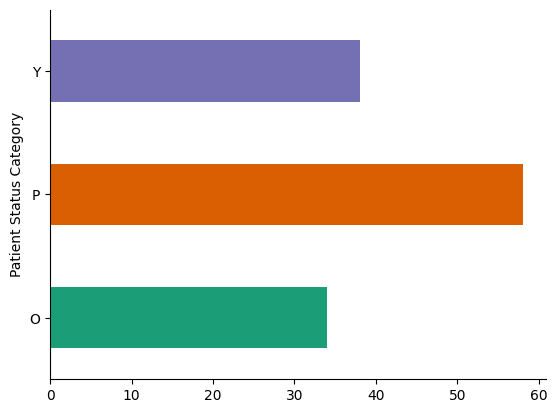

In [ ]:
# @title Patient Status Category

from matplotlib import pyplot as plt
import seaborn as sns
results_df.groupby('Patient Status Category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# prompt: show descriptive statistic

# Assuming 'results_df' is already created and populated as in your provided code.

# Descriptive statistics for numerical columns
numerical_stats = results_df.describe()
print("Descriptive Statistics for Numerical Columns:\n", numerical_stats)

# Descriptive statistics for the 'Processing Output' column (assuming it contains numbers).
# If 'Processing Output' column is not numerical you may need to convert it first.
try:
    processing_output_stats = results_df['Processing Output'].astype(int).describe() #try convert to int first.
    print("\nDescriptive Statistics for 'Processing Output':\n", processing_output_stats)
except:
    print("\n'Processing Output' column is not numeric. Cannot calculate descriptive statistics")

# Value counts and frequencies for categorical columns
categorical_columns = ['Type of Patient', 'Patient Status Category']  # Replace with actual column names
for col in categorical_columns:
    print(f"\nValue Counts for '{col}':\n", results_df[col].value_counts())
    print(f"\nValue Frequencies for '{col}':\n", results_df[col].value_counts(normalize=True))

Descriptive Statistics for Numerical Columns:
            Row ID       Best Bic  Best Fourier Count  Best Wavelet Count  \
count  130.000000     130.000000          130.000000          130.000000   
mean    65.500000   -1346.500001            0.969231            9.430769   
std     37.671829   27100.754695            1.559857            2.372120   
min      1.000000  -98814.886394            0.000000            2.000000   
25%     33.250000  -11557.237775            0.000000            8.000000   
50%     65.500000    -987.238396            1.000000            9.500000   
75%     97.750000    8599.056398            1.000000           11.000000   
max    130.000000  228375.598258           13.000000           14.000000   

       Fourier Count  Wavelet Count  
count     130.000000     130.000000  
mean        1.715385      13.284615  
std         1.783797       1.783797  
min         0.000000       2.000000  
25%         0.000000      12.000000  
50%         1.000000      14.000000  
75


Patient Group: O
--------------------
Number of patients: 34
            Best Bic  Best Fourier Count  Best Wavelet Count
count      34.000000           34.000000           34.000000
mean    -1317.523106            0.852941            9.911765
std     46880.422381            1.158169            2.094258
min    -98814.886394            0.000000            6.000000
25%    -13888.176766            0.000000            8.000000
50%     -1960.096786            0.500000           10.000000
75%      8739.657412            1.000000           11.000000
max    228375.598258            5.000000           14.000000


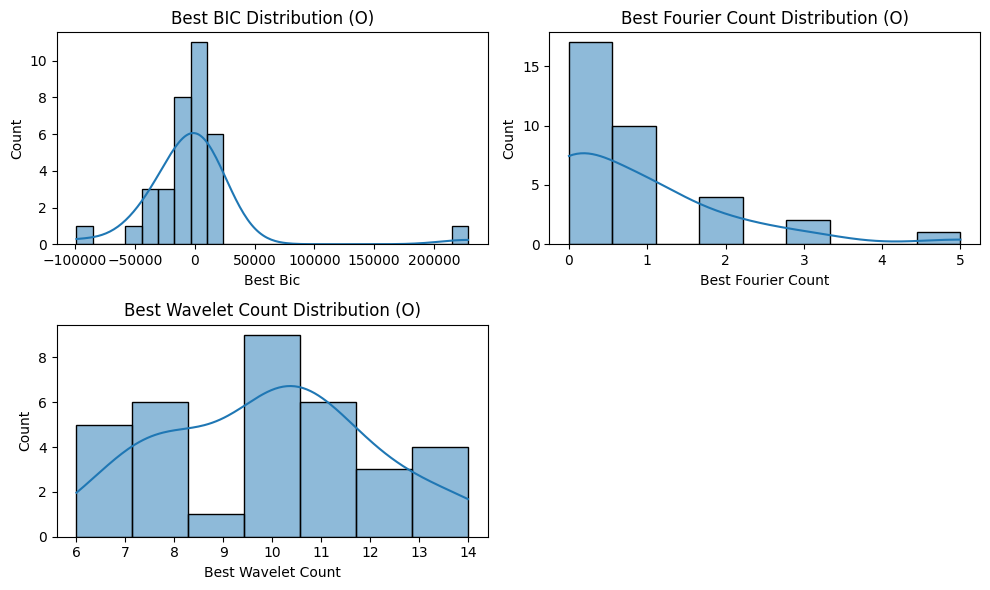


Patient Group: P
--------------------
Number of patients: 58
           Best Bic  Best Fourier Count  Best Wavelet Count
count     58.000000           58.000000           58.000000
mean   -1654.905358            1.137931            9.137931
std    16950.872855            1.959666            2.357878
min   -46474.037380            0.000000            2.000000
25%   -13506.817982            0.000000            8.000000
50%    -2315.991787            1.000000            9.000000
75%    12836.769732            1.000000           11.000000
max    29044.804938           13.000000           14.000000


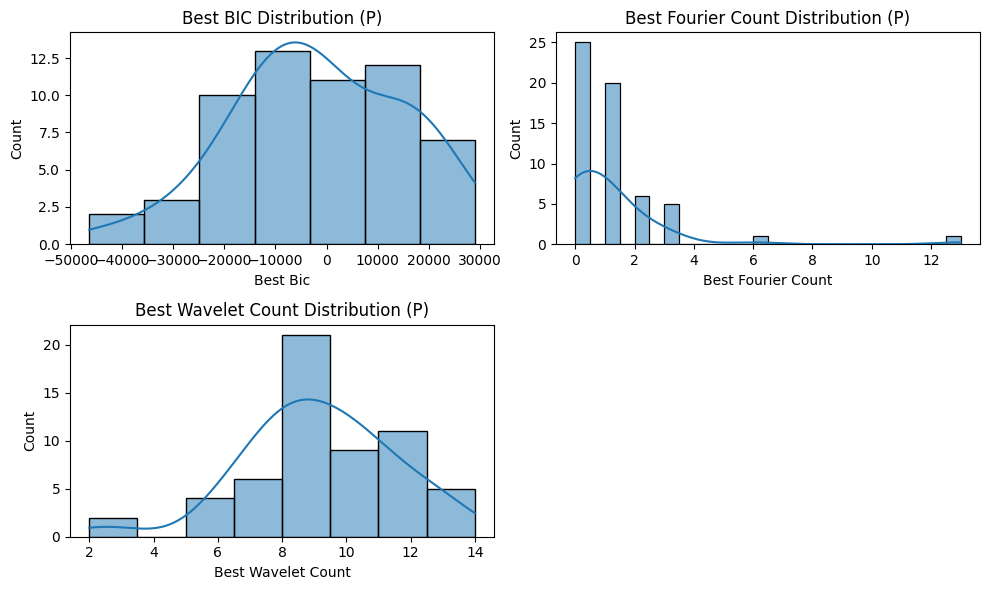


Patient Group: Y
--------------------
Number of patients: 38
           Best Bic  Best Fourier Count  Best Wavelet Count
count     38.000000           38.000000           38.000000
mean    -901.702732            0.815789            9.447368
std    12548.965989            1.135550            2.606617
min   -31893.982983            0.000000            4.000000
25%    -8917.296068            0.000000            8.000000
50%     1877.395058            0.500000            9.000000
75%     5986.389634            1.000000           11.000000
max    24932.217691            5.000000           14.000000


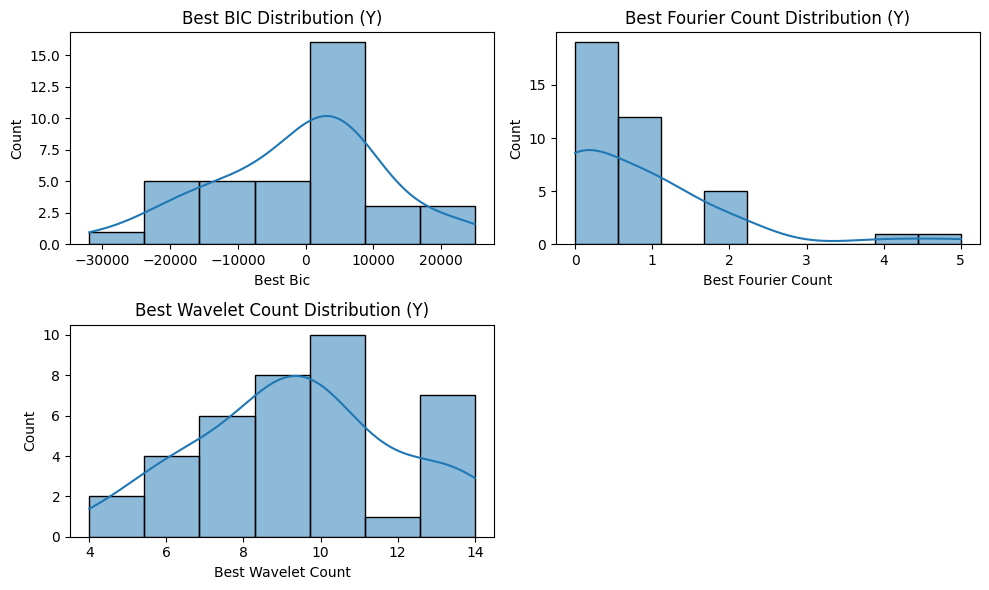

In [ ]:
# prompt: results_df give me a detaild report on the differnces bwetween the grpoup[s pf paitiens by the the best bic, the number of fourier and wavelt compuntes in each one  and plot every section

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'results_df' is already created and populated as in your provided code.

# Detailed report on differences between patient groups
def detailed_report(df):
    """Generates a detailed report on patient group differences."""

    # Group data by patient type
    grouped = df.groupby('Patient Status Category')

    # Iterate through groups and print statistics
    for name, group in grouped:
        print(f"\nPatient Group: {name}")
        print("-" * 20)
        print(f"Number of patients: {len(group)}")
        print(group[['Best Bic', 'Best Fourier Count', 'Best Wavelet Count']].describe())  #Descriptive statistics

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.subplot(2, 2, 1)
        sns.histplot(group['Best Bic'], kde=True)
        plt.title(f'Best BIC Distribution ({name})')

        plt.subplot(2, 2, 2)
        sns.histplot(group['Best Fourier Count'], kde=True)
        plt.title(f'Best Fourier Count Distribution ({name})')

        plt.subplot(2, 2, 3)
        sns.histplot(group['Best Wavelet Count'], kde=True)
        plt.title(f'Best Wavelet Count Distribution ({name})')

        plt.tight_layout()
        plt.show()


# Call the function to generate the report
detailed_report(results_df)

<ipython-input-36-38640d1b707d>:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.lineplot(data=grouped, x='Row ID', y='Best Bic', hue=group_column, ci=95, marker='o')  #Added ci for confidence interval


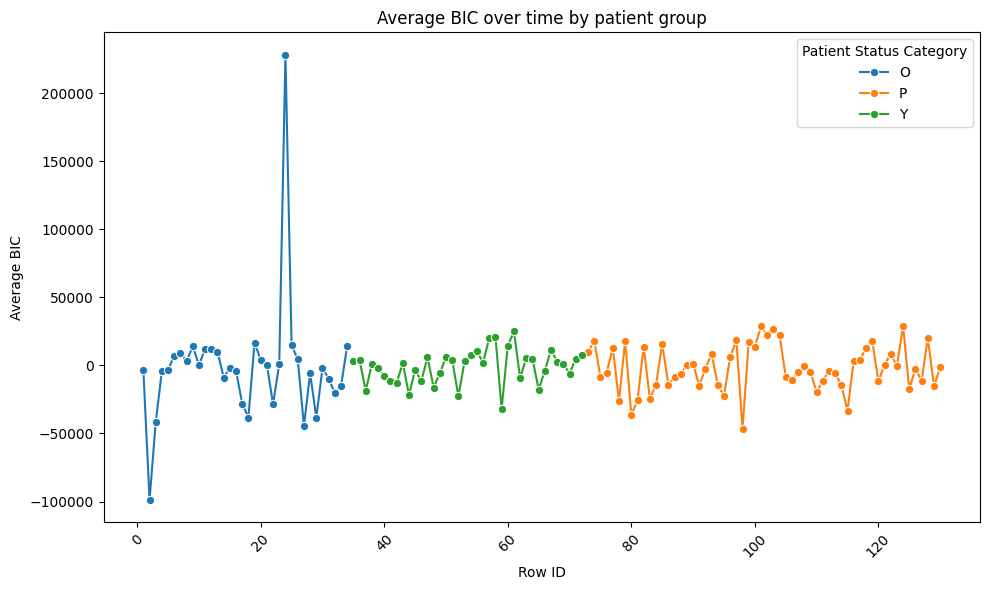

In [ ]:
# prompt: show me the avrege bic over time by group add confidence intervals

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'results_df' is already created and populated as in your provided code.

def plot_average_bic_over_time(df, group_column='Patient Status Category'):
    """Plots the average BIC over time for different patient groups, with confidence intervals."""

    # Convert 'Row ID' to numeric if it's not already
    try:
        df['Row ID'] = pd.to_numeric(df['Row ID'])
    except:
        print("Warning: 'Row ID' column cannot be converted to numeric. Using it as categorical.")

    # Group data and calculate mean BIC
    grouped = df.groupby([group_column, 'Row ID'])['Best Bic'].mean().reset_index()

    # Plot
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=grouped, x='Row ID', y='Best Bic', hue=group_column, ci=95, marker='o')  #Added ci for confidence interval
    plt.title('Average BIC over time by patient group')
    plt.xlabel('Row ID')
    plt.ylabel('Average BIC')
    plt.xticks(rotation=45)  # Rotate x-axis labels if needed
    plt.legend(title=group_column)
    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_average_bic_over_time(results_df)

<ipython-input-59-33dc2f9f9db3>:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




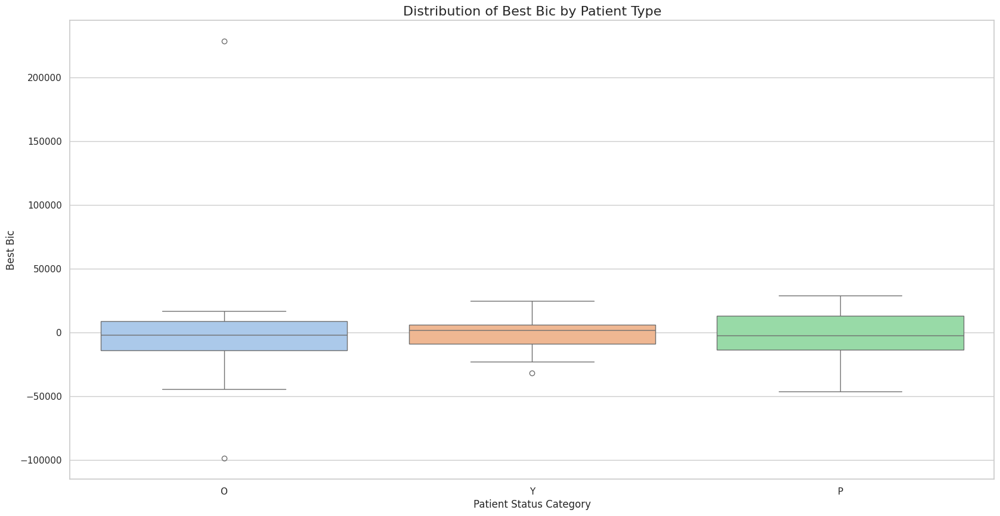

<ipython-input-59-33dc2f9f9db3>:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




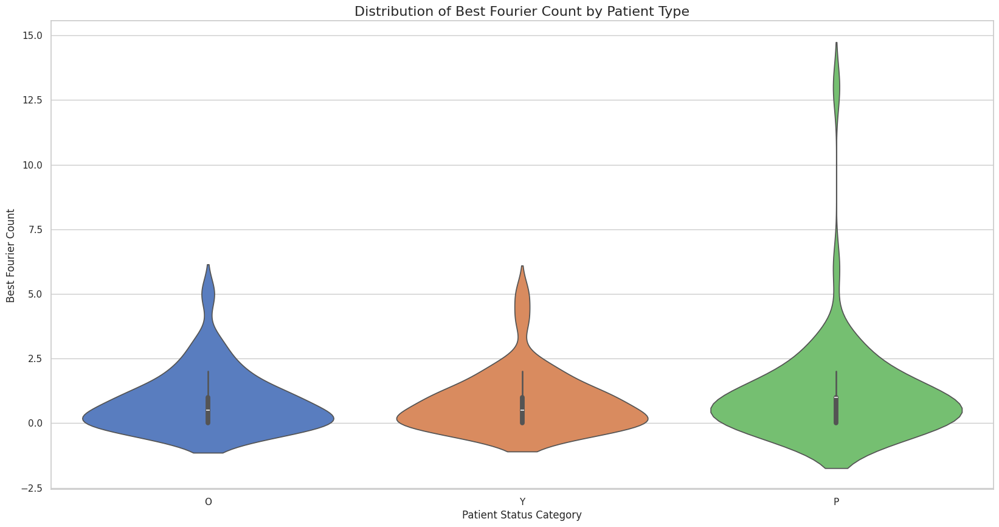

<ipython-input-59-33dc2f9f9db3>:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.


<ipython-input-59-33dc2f9f9db3>:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




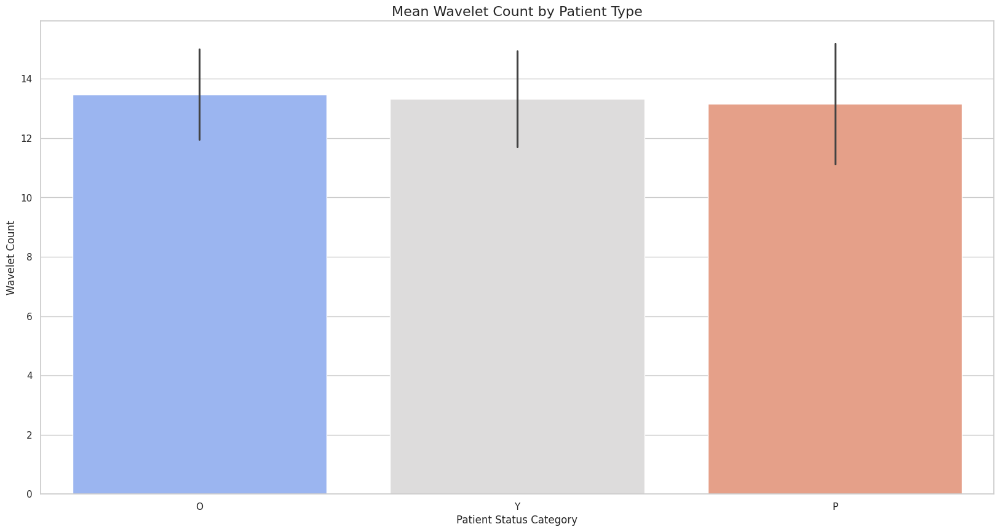

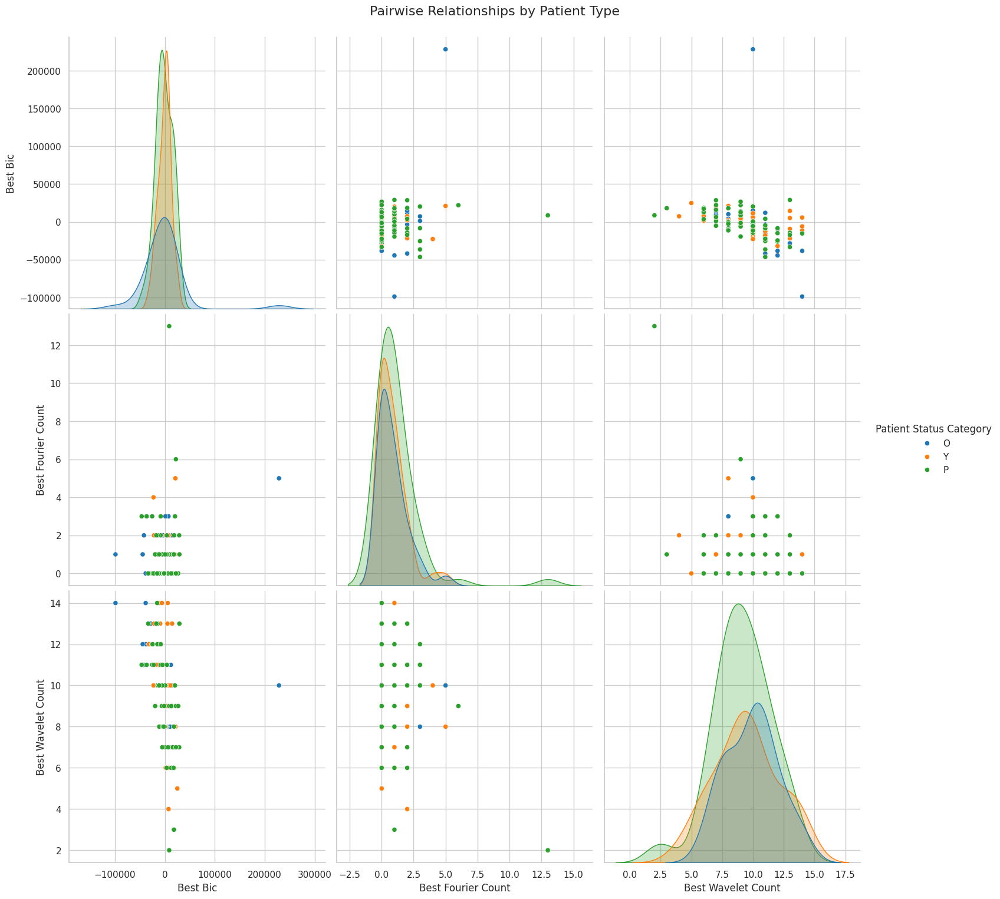

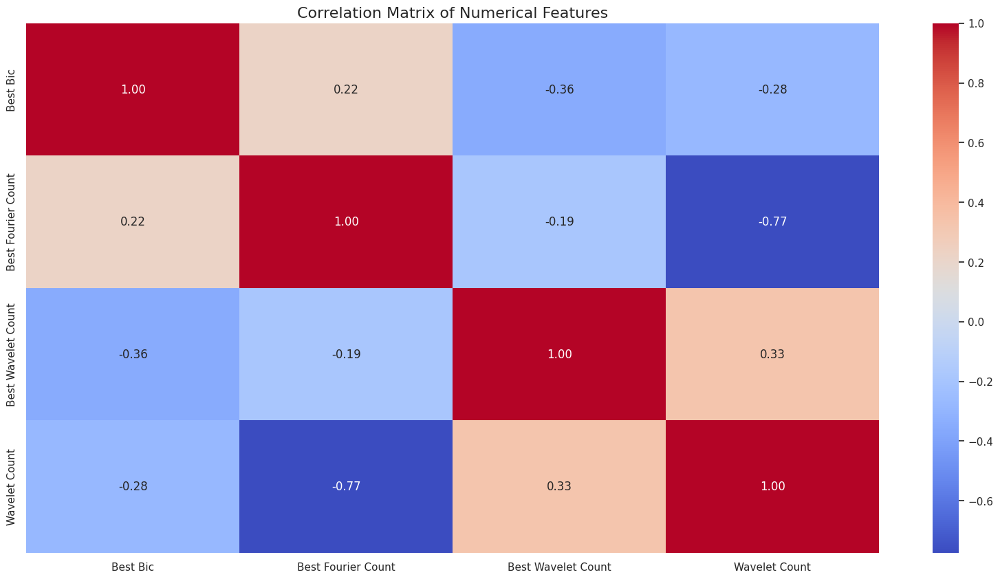

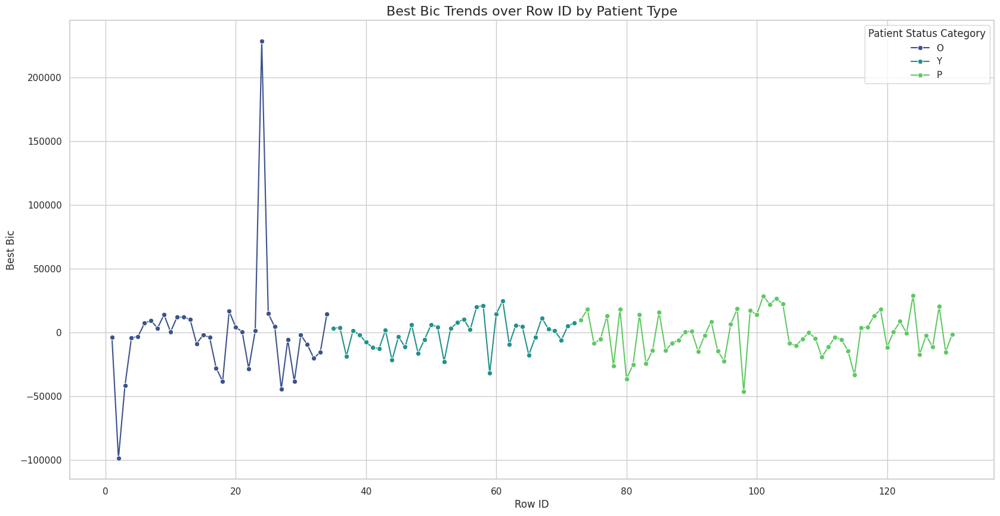

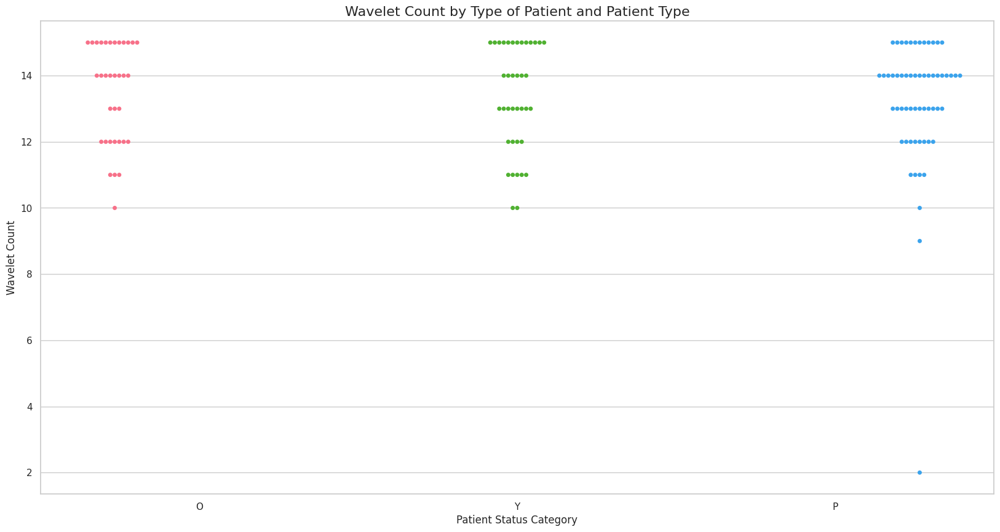

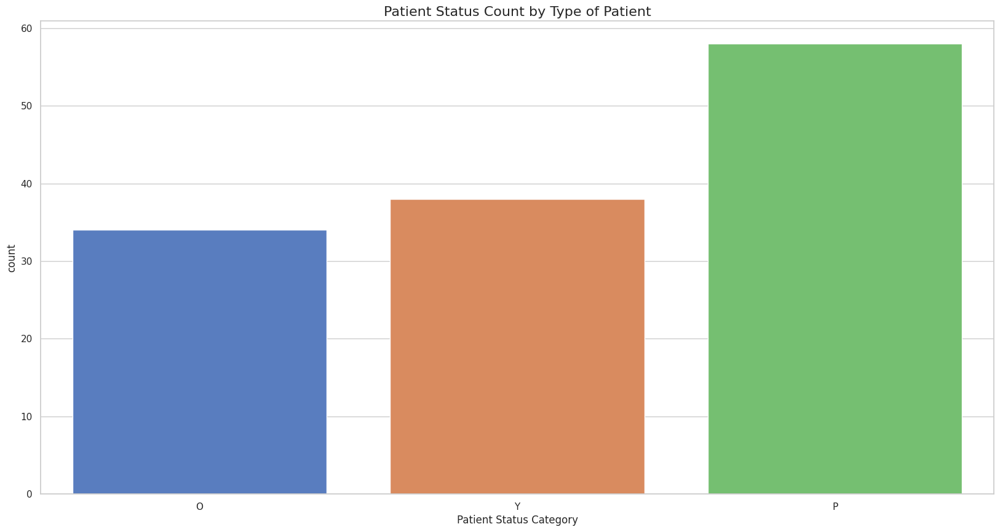

<ipython-input-59-33dc2f9f9db3>:63: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-59-33dc2f9f9db3>:63: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-59-33dc2f9f9db3>:63: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-59-33dc2f9f9db3>:63: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-59-33dc2f9f9db3>:63: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-59-33dc2f9f9db3

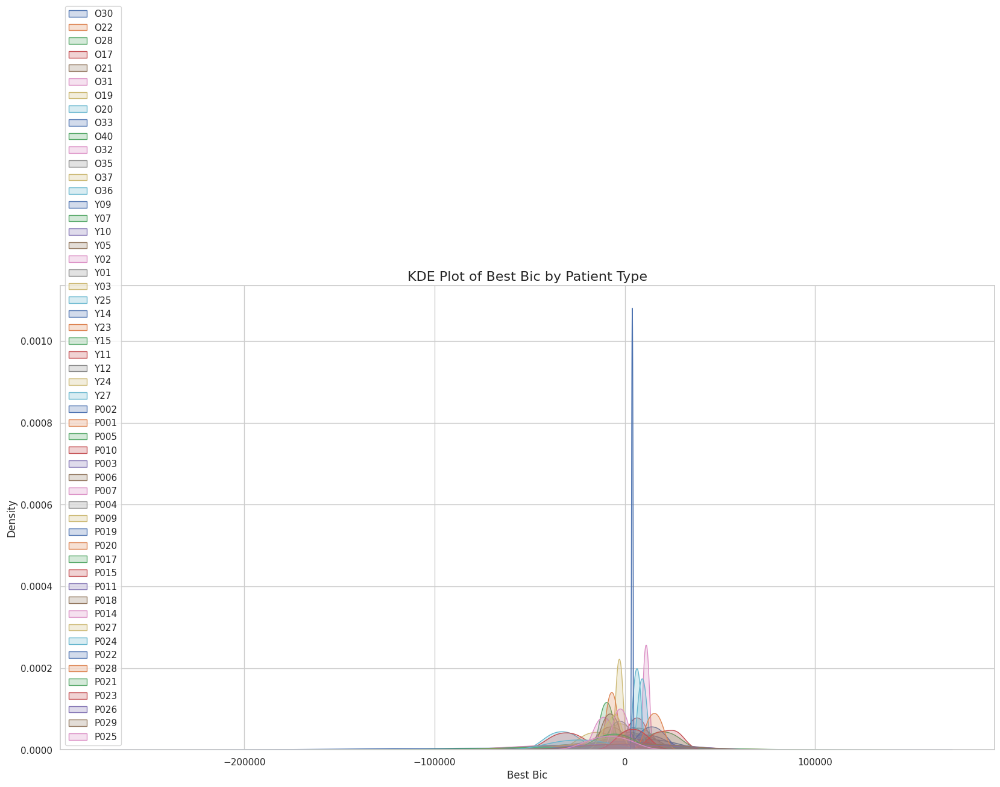

<ipython-input-59-33dc2f9f9db3>:74: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




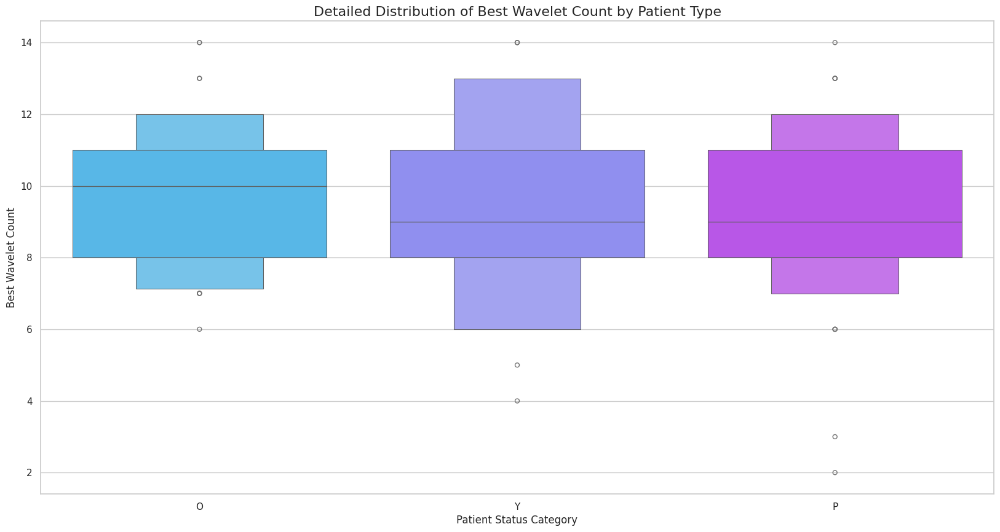

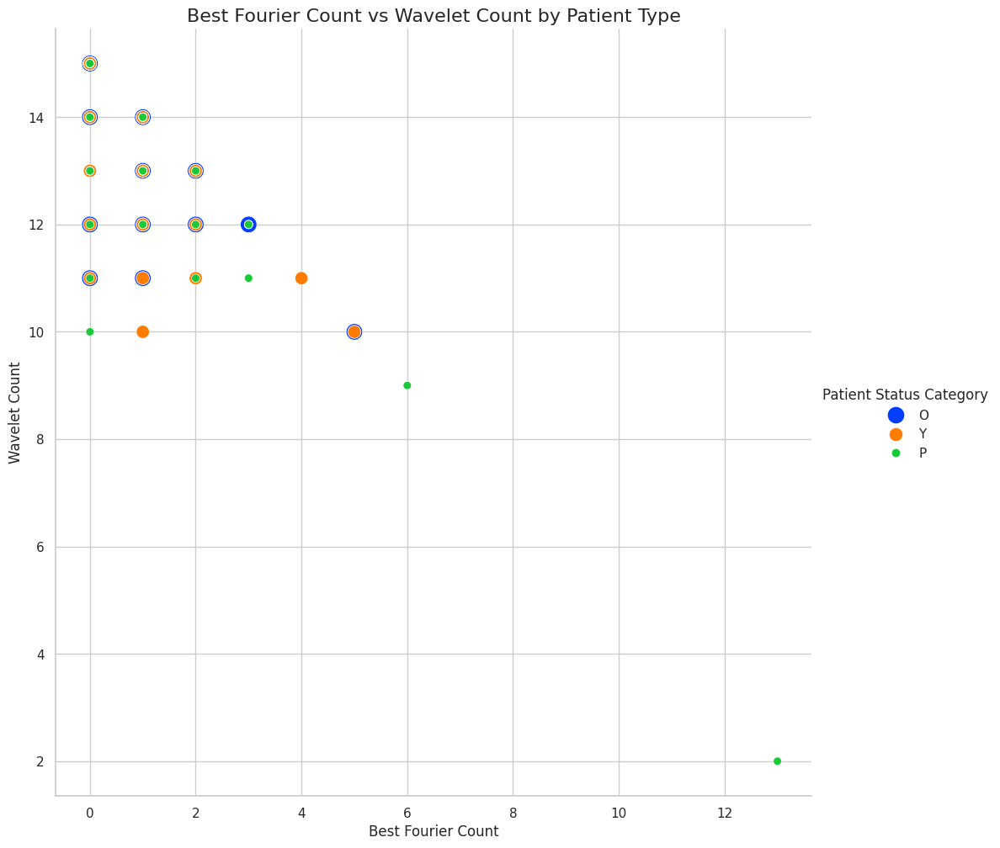

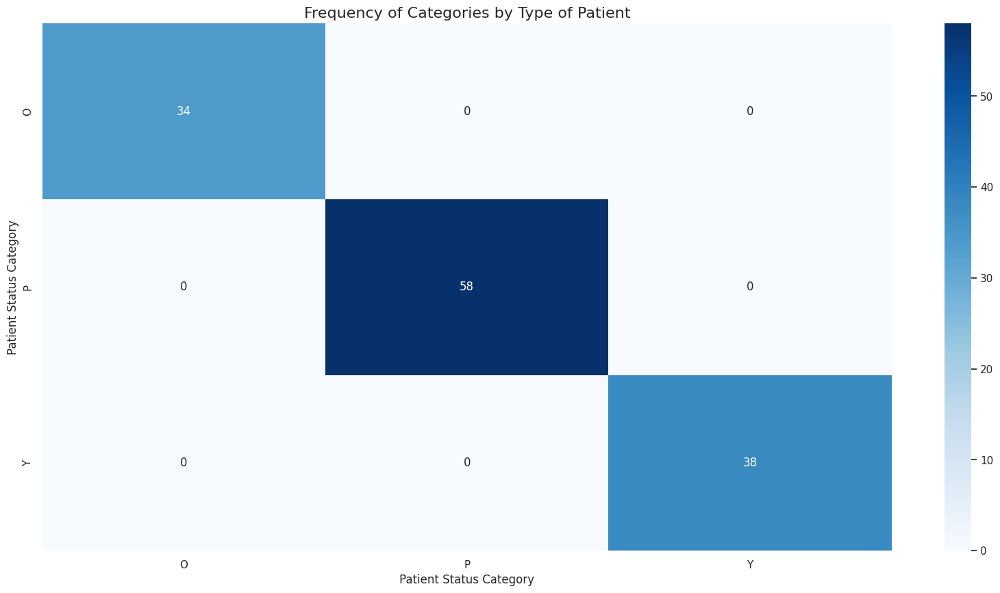

Detailed Summary Statistics:
                      Best Bic                             Best Fourier Count  \
                         mean        median           std               mean   
Type of Patient                                                                
O17               6278.984285   6278.984285   4187.739963                0.0   
O18              -8889.382142  -8889.382142           NaN                1.0   
O19              -2997.702660  -2997.702660   1482.494131                0.5   
O20             -33174.857516 -33174.857516   7335.730664                0.0   
O21               6214.947840   6214.947840   8332.739845                0.5   
...                       ...           ...           ...                ...   
Y23              -5416.761963  -5416.761963  37444.445062                2.5   
Y24              -2368.662028  -2368.662028   5120.260613                0.0   
Y25               9021.848802   9021.848802   1890.091003                1.0   
Y26       

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

# Load the dataset (assuming the data is stored in a dataframe named `df`)

df = results_df

# 1. Boxplot: Distribution of Best Bic by Patient Type
plt.figure(figsize=(20, 10))
sns.boxplot(data=df, x="Patient Status Category", y="Best Bic", palette="pastel")
plt.title("Distribution of Best Bic by Patient Type", fontsize=16)
plt.show()

# 2. Violin plot: Distribution of Best Fourier Count by Patient Type
plt.figure(figsize=(20, 10))
sns.violinplot(data=df, x="Patient Status Category", y="Best Fourier Count", palette="muted")
plt.title("Distribution of Best Fourier Count by Patient Type", fontsize=16)
plt.show()

# 3. Barplot: Mean Wavelet Count by Patient Type
plt.figure(figsize=(20, 10))
sns.barplot(data=df, x="Patient Status Category", y="Wavelet Count", ci="sd", palette="coolwarm")
plt.title("Mean Wavelet Count by Patient Type", fontsize=16)
plt.show()

# 4. Pairplot: Relationship between numerical features grouped by Patient Type
sns.pairplot(df[["Best Bic",	"Best Fourier Count"	,"Best Wavelet Count",	"Patient Status Category"]], hue="Patient Status Category", diag_kind="kde", palette="tab10", height=5)
plt.suptitle("Pairwise Relationships by Patient Type", y=1.02, fontsize=16)
plt.show()

# 5. Heatmap: Correlation matrix of numerical features
plt.figure(figsize=(20, 10))
correlation_matrix = df[["Best Bic", "Best Fourier Count", "Best Wavelet Count", "Wavelet Count"]].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Numerical Features", fontsize=16)
plt.show()

# 6. Lineplot: Best Bic over Row ID for each Patient Type
plt.figure(figsize=(20, 10))
sns.lineplot(data=df, x="Row ID", y="Best Bic", hue="Patient Status Category", marker="o", palette="viridis")
plt.title("Best Bic Trends over Row ID by Patient Type", fontsize=16)
plt.show()

# 7. Swarmplot: Distribution of Wavelet Count by Category and Patient Type
plt.figure(figsize=(20, 10))
sns.swarmplot(data=df, x="Patient Status Category", y="Wavelet Count", hue="Patient Status Category", palette="husl", dodge=True)
plt.title("Wavelet Count by Type of Patient and Patient Type", fontsize=16)
plt.show()


# 9. Countplot: Frequency of Patient Status by Patient Type
plt.figure(figsize=(20, 10))
sns.countplot(data=df, x="Patient Status Category", hue="Patient Status Category", palette="muted")
plt.title("Patient Status Count by Type of Patient", fontsize=16)
plt.show()

# 10. KDE plot: Distribution of Best Bic for each Patient Type
plt.figure(figsize=(20, 10))
for patient_type in df["Type of Patient"].unique():
    sns.kdeplot(
        df[df["Type of Patient"] == patient_type]["Best Bic"],
        label=f"{patient_type}",
        shade=True,
    )
plt.title("KDE Plot of Best Bic by Patient Type", fontsize=16)
plt.legend()
plt.show()

# 11. Boxenplot: Detailed distribution of Best Wavelet Count by Patient Type
plt.figure(figsize=(20, 10))
sns.boxenplot(data=df, x="Patient Status Category", y="Best Wavelet Count", palette="cool")
plt.title("Detailed Distribution of Best Wavelet Count by Patient Type", fontsize=16)
plt.show()

# 12. Relplot: Scatter plot of Best Fourier Count vs Wavelet Count
sns.relplot(
    data=df,
    x="Best Fourier Count",
    y="Wavelet Count",
    hue="Patient Status Category",
    size="Patient Status Category",
    sizes=(50, 200),
    palette="bright",
    height=10,
)
plt.title("Best Fourier Count vs Wavelet Count by Patient Type", fontsize=16)
plt.show()

# 13. Heatmap: Frequency of Category by Type of Patient
plt.figure(figsize=(20, 10))
category_counts = pd.crosstab(df["Patient Status Category"], df["Patient Status Category"])
sns.heatmap(category_counts, annot=True, cmap="Blues", fmt="d")
plt.title("Frequency of Categories by Type of Patient", fontsize=16)
plt.show()

# Detailed Analysis
summary_stats = df.groupby("Type of Patient").agg(
    {
        "Best Bic": ["mean", "median", "std"],
        "Best Fourier Count": ["mean", "sum"],
        "Best Wavelet Count": ["mean", "sum"],
    }
)
print("Detailed Summary Statistics:\n", summary_stats)

# Detailed Analysis
summary_stats = df.groupby("Patient Status Category").agg(
    {
        "Best Bic": ["mean", "median", "std"],
        "Best Fourier Count": ["mean", "sum"],
        "Best Wavelet Count": ["mean", "sum"],
    }
)
print("Detailed Summary Statistics:\n", summary_stats)

# Interactive Plotly Visualization: Boxplot of Best Bic by Patient Type
fig = px.box(
    df, x="Patient Status Category", y="Best Bic", color="Patient Status Category",
    title="Interactive Distribution of Best Bic by Patient Type",
    labels={"Best Bic": "Best Bic", "Type of Patient": "Patient Type"},
    width=1200, height=600
)
fig.show()

# Interactive Plotly Visualization: Scatter Plot
fig = px.scatter(
    df, x="Best Fourier Count", y="Wavelet Count", color="Patient Status Category",
    # size="Patient Status Category",
    title="Interactive Scatter Plot of Best Fourier Count vs Wavelet Count",
    labels={"Best Fourier Count": "Fourier Count", "Wavelet Count": "Wavelet Count"},
    width=1200, height=600
)
fig.show()


In [ ]:
pip install --upgrade pywavelets

In [ ]:
import numpy as np
import pywt
import matplotlib.pyplot as plt

In [ ]:
# Example signal: 10 Hz and 50 Hz bursts at different times
t = np.linspace(0, 1, 1000)
signal = np.sin(2 * np.pi * 10 * t) * (t > 0.2) * (t < 0.4) + \
         np.sin(2 * np.pi * 50 * t) * (t > 0.6) * (t < 0.8)
wavelet = 'db4'  # Daubechies 4 wavelet
levels = 5       # Number of decomposition levels

In [ ]:
# Load signal
file_path = "/content/drive/MyDrive/pat_Old_Young/pat/O20/20160311_Fri_101604_Fp_00.asc"
signal = load_signal_data(file_path)


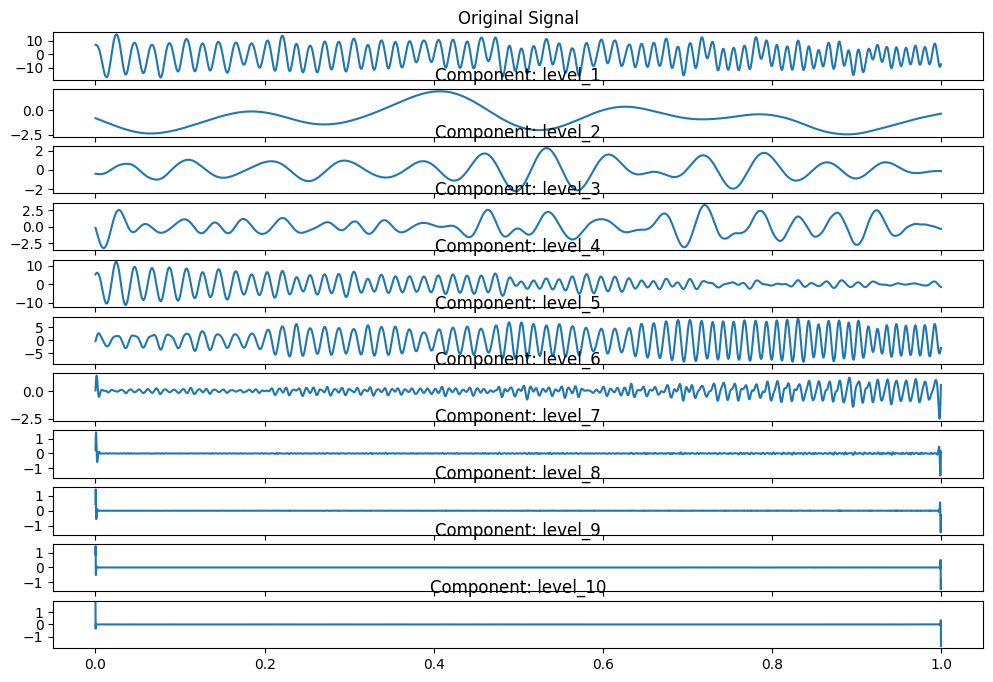

In [ ]:
import numpy as np
import pywt
import matplotlib.pyplot as plt

# Generate a test signal (replace with your data)
t = np.linspace(0, 1, len(signal))


# Ensure signal length is divisible by 2^levels for SWT
levels = 10
n_original = len(signal)
n_padded = ((n_original + (2**levels - 1)) // (2**levels)) * (2**levels)
signal_padded = np.pad(signal, (0, n_padded - n_original), mode='constant')

# SWT parameters
wavelet = 'db4'  # Daubechies 4 wavelet

# Decompose the signal using SWT (remove trim_approx)
coeffs = pywt.swt(signal_padded, wavelet, level=levels)  # ✅ Remove trim_approx=True

# Reconstruct components for each level
components = {}
for level in range(levels):
    # Initialize a coefficient set where only the target level is kept
    coeffs_level = []
    for i in range(levels):
        if i == level:
            # Keep coefficients for the current level
            coeffs_level.append(coeffs[i])
        else:
            # Zero out coefficients for other levels
            cA, cD = coeffs[i]
            coeffs_level.append((np.zeros_like(cA), np.zeros_like(cD)))

    # Reconstruct the component using inverse SWT
    component_padded = pywt.iswt(coeffs_level, wavelet)
    # Trim back to original signal length
    component = component_padded[:n_original]
    components[f'level_{level+1}'] = component

# Plot the original and components
plt.figure(figsize=(12, 8))
plt.subplot(levels + 1, 1, 1)
plt.plot(t, signal)
plt.title("Original Signal")

for i, (name, component) in enumerate(components.items()):
    plt.subplot(levels + 1, 1, i + 2)
    plt.plot(t, component)
    plt.title(f"Component: {name}")

plt.show()